# DESCRIPTION
- A banking institution requires actionable insights into mortgage-backed securities, geographic business investment, and real estate analysis. 
- The mortgage bank would like to identify potential monthly mortgage expenses for each region based on monthly family income and rental of the real estate.
- A statistical model needs to be created to predict the potential demand in dollars amount of loan for each of the region in the USA. Also, there is a need to create a dashboard which would refresh periodically post data retrieval from the agencies.
- The dashboard must demonstrate relationships and trends for the key metrics as follows: number of loans, average rental income, monthly mortgage and owner’s cost, family income vs mortgage cost comparison across different regions. The metrics described here do not limit the dashboard to these few.

# 1. Import required Libraries

In [1]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
plt.style.use("fivethirtyeight")
from pylab import rcParams
rcParams['figure.figsize'] = 10, 5
import seaborn as sns
import plotly.offline as py
import plotly.graph_objs as go
py.init_notebook_mode(connected = True)
import plotly.io as pio
pio.renderers.default = "iframe"
from factor_analyzer import FactorAnalyzer

#showing all the columns & rows of the pandas dataframe
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", None)


from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# 2. Import Dataset



In [2]:
# load training & test data
train_data = pd.read_csv("data/train.csv")
test_data = pd.read_csv("data/test.csv")

In [3]:
train_data.head()

,UID,BLOCKID,SUMLEVEL,COUNTYID,STATEID,state,state_ab,city,place,type,primary,zip_code,area_code,lat,lng,ALand,AWater,pop,male_pop,female_pop,rent_mean,rent_median,rent_stdev,rent_sample_weight,rent_samples,rent_gt_10,rent_gt_15,rent_gt_20,rent_gt_25,rent_gt_30,rent_gt_35,rent_gt_40,rent_gt_50,universe_samples,used_samples,hi_mean,hi_median,hi_stdev,hi_sample_weight,hi_samples,family_mean,family_median,family_stdev,family_sample_weight,family_samples,hc_mortgage_mean,hc_mortgage_median,hc_mortgage_stdev,hc_mortgage_sample_weight,hc_mortgage_samples,hc_mean,hc_median,hc_stdev,hc_samples,hc_sample_weight,home_equity_second_mortgage,second_mortgage,home_equity,debt,second_mortgage_cdf,home_equity_cdf,debt_cdf,hs_degree,hs_degree_male,hs_degree_female,male_age_mean,male_age_median,male_age_stdev,male_age_sample_weight,male_age_samples,female_age_mean,female_age_median,female_age_stdev,female_age_sample_weight,female_age_samples,pct_own,married,married_snp,separated,divorced
0,267822,NaN,140,53,36,New York,NY,Hamilton,Hamilton,City,tract,13346,315,42.840812,-75.501524,202183361.0,1699120,5230,2612,2618,769.38638,784.0,232.63967,272.34441,362.0,0.86761,0.79155,0.59155,0.45634,0.42817,0.18592,0.15493,0.12958,387,355,63125.28406,48120.0,49042.01206,1290.96240,2024.0,67994.14790,53245.0,47667.30119,884.33516,1491.0,1414.80295,1223.0,641.22898,377.83135,867.0,570.01530,558.0,270.11299,770.0,499.29293,0.01588,0.02077,0.08919,0.52963,0.43658,0.49087,0.73341,0.89288,0.85880,0.92434,42.48574,44.00000,22.97306,696.42136,2612.0,44.48629,45.33333,22.51276,685.33845,2618.0,0.79046,0.57851,0.01882,0.01240,0.08770
1,246444,NaN,140,141,18,Indiana,IN,South Bend,Roseland,City,tract,46616,574,41.701441,-86.266614,1560828.0,100363,2633,1349,1284,804.87924,848.0,253.46747,312.58622,513.0,0.97410,0.93227,0.69920,0.69920,0.55179,0.41235,0.39044,0.27888,542,502,41931.92593,35186.0,31639.50203,838.74664,1127.0,50670.10337,43023.0,34715.57548,375.28798,554.0,864.41390,784.0,482.27020,316.88320,356.0,351.98293,336.0,125.40457,229.0,189.60606,0.02222,0.02222,0.04274,0.60855,0.42174,0.70823,0.58120,0.90487,0.86947,0.94187,34.84728,32.00000,20.37452,323.90204,1349.0,36.48391,37.58333,23.43353,267.23367,1284.0,0.52483,0.34886,0.01426,0.01426,0.09030
2,245683,NaN,140,63,18,Indiana,IN,Danville,Danville,City,tract,46122,317,39.792202,-86.515246,69561595.0,284193,6881,3643,3238,742.77365,703.0,323.39011,291.85520,378.0,0.95238,0.88624,0.79630,0.66667,0.39153,0.39153,0.28307,0.15873,459,378,84942.68317,74964.0,56811.62186,1155.20980,2488.0,95262.51431,85395.0,49292.67664,709.74925,1889.0,1506.06758,1361.0,731.89394,699.41354,1491.0,556.45986,532.0,184.42175,538.0,323.35354,0.00000,0.00000,0.09512,0.73484,1.00000,0.46332,0.28704,0.94288,0.94616,0.93952,39.38154,40.83333,22.89769,888.29730,3643.0,42.15810,42.83333,23.94119,707.01963,3238.0,0.85331,0.64745,0.02830,0.01607,0.10657
3,279653,NaN,140,127,72,Puerto Rico,PR,San Juan,Guaynabo,Urban,tract,927,787,18.396103,-66.104169,1105793.0,0,2700,1141,1559,803.42018,782.0,297.39258,259.30316,368.0,0.94693,0.87151,0.69832,0.61732,0.51397,0.46927,0.35754,0.32961,438,358,48733.67116,37845.0,45100.54010,928.32193,1267.0,56401.68133,44399.0,41082.90515,490.18479,729.0,1175.28642,1101.0,428.98751,261.28471,437.0,288.04047,247.0,185.55887,392.0,314.90566,0.01086,0.01086,0.01086,0.52714,0.53057,0.82530,0.73727,0.91500,0.90755,0.92043,48.64749,48.91667,23.05968,274.98956,1141.0,47.77526,50.58333,24.32015,362.20193,1559.0,0.65037,0.47257,0.02021,0.02021,0.10106
4,247218,NaN,140,161,20,Kansas,KS,Manhattan,Manhattan City,City,tract,66502,785,39.195573,-96.569366,2554403.0,0,5637,2586,3051,938.56493,881.0,392.44096,1005.42886,1704.0,0.99286,0.98247,0.91688,0.84740,0.78247,0.60974,0.55455,0.44416,1725,1540,31834.15466,22497.0,34046.50907,1548.67477,1983.0,54053.42396,50272.0,39609.12605,244.08903,395.0,1192.58759,1125.0,327.49674,76.61052,134.0,443.68855,444.0,76.12674,124.0,79.55556,0.05426,0.05426,0.05426,0.51938,0.18332,0.65545,0.7496

In [4]:
test_data.head()

,UID,BLOCKID,SUMLEVEL,COUNTYID,STATEID,state,state_ab,city,place,type,primary,zip_code,area_code,lat,lng,ALand,AWater,pop,male_pop,female_pop,rent_mean,rent_median,rent_stdev,rent_sample_weight,rent_samples,rent_gt_10,rent_gt_15,rent_gt_20,rent_gt_25,rent_gt_30,rent_gt_35,rent_gt_40,rent_gt_50,universe_samples,used_samples,hi_mean,hi_median,hi_stdev,hi_sample_weight,hi_samples,family_mean,family_median,family_stdev,family_sample_weight,family_samples,hc_mortgage_mean,hc_mortgage_median,hc_mortgage_stdev,hc_mortgage_sample_weight,hc_mortgage_samples,hc_mean,hc_median,hc_stdev,hc_samples,hc_sample_weight,home_equity_second_mortgage,second_mortgage,home_equity,debt,second_mortgage_cdf,home_equity_cdf,debt_cdf,hs_degree,hs_degree_male,hs_degree_female,male_age_mean,male_age_median,male_age_stdev,male_age_sample_weight,male_age_samples,female_age_mean,female_age_median,female_age_stdev,female_age_sample_weight,female_age_samples,pct_own,married,married_snp,separated,divorced
0,255504,NaN,140,163,26,Michigan,MI,Detroit,Dearborn Heights City,CDP,tract,48239,313,42.346422,-83.252823,2711280,39555,3417,1479,1938,858.57169,859.0,232.39082,276.07497,424.0,1.00000,0.95696,0.85316,0.85316,0.85316,0.85316,0.76962,0.63544,435,395,48899.52121,38746.0,44392.20902,798.02401,1180.0,53802.87122,45167.0,43756.56479,464.30972,769.0,1139.24548,1109.0,336.47710,262.67011,474.0,488.51323,436.0,192.75147,271.0,189.18182,0.06443,0.06443,0.07651,0.63624,0.14111,0.55087,0.51965,0.91047,0.92010,0.90391,33.37131,27.83333,22.36768,334.30978,1479.0,34.78682,33.75000,21.58531,416.48097,1938.0,0.70252,0.28217,0.05910,0.03813,0.14299
1,252676,NaN,140,1,23,Maine,ME,Auburn,Auburn City,City,tract,4210,207,44.100724,-70.257832,14778785,2705204,3796,1846,1950,832.68625,750.0,267.22342,183.32299,245.0,1.00000,1.00000,0.86611,0.67364,0.30962,0.30962,0.30962,0.27197,275,239,72335.33234,61008.0,51895.81159,922.82969,1722.0,85642.22095,74759.0,49156.72870,482.99945,1147.0,1533.25988,1438.0,536.61118,373.96188,937.0,661.31296,668.0,201.31365,510.0,279.69697,0.01175,0.01175,0.14375,0.64755,0.52310,0.26442,0.49359,0.94290,0.92832,0.95736,43.88680,46.08333,22.90302,427.10824,1846.0,44.23451,46.66667,22.37036,532.03505,1950.0,0.85128,0.64221,0.02338,0.00000,0.13377
2,276314,NaN,140,15,42,Pennsylvania,PA,Pine City,Millerton,Borough,tract,14871,607,41.948556,-76.783808,258903666,863840,3944,2065,1879,816.00639,755.0,416.25699,141.39063,217.0,0.97573,0.93204,0.78641,0.71845,0.63592,0.47573,0.43689,0.32524,245,206,58501.15901,51648.0,45245.27248,893.07759,1461.0,65694.06582,57186.0,44239.31893,619.73962,1084.0,1254.54462,1089.0,596.85204,340.45884,552.0,397.44466,356.0,189.40372,664.0,534.16737,0.01069,0.01316,0.06497,0.45395,0.51066,0.60484,0.83848,0.89238,0.86003,0.92463,39.81661,41.91667,24.29111,499.10080,2065.0,41.62426,44.50000,22.86213,453.11959,1879.0,0.81897,0.59961,0.01746,0.01358,0.10026
3,248614,NaN,140,231,21,Kentucky,KY,Monticello,Monticello City,City,tract,42633,606,36.746009,-84.766870,501694825,2623067,2508,1427,1081,418.68937,385.0,156.92024,88.95960,93.0,1.00000,0.93548,0.93548,0.64516,0.55914,0.46237,0.46237,0.36559,153,93,38237.55059,31612.0,34527.61607,775.17947,957.0,44156.38709,34687.0,34899.74300,535.21987,689.0,862.65763,749.0,624.42157,299.56752,337.0,200.88113,180.0,91.56490,467.0,454.85404,0.00995,0.00995,0.01741,0.41915,0.53770,0.80931,0.87403,0.60908,0.56584,0.65947,41.81638,43.00000,24.65325,333.57733,1427.0,44.81200,48.00000,21.03155,263.94320,1081.0,0.84609,0.56953,0.05492,0.04694,0.12489
4,286865,NaN,140,355,48,Texas,TX,Corpus Christi,Edroy,Town,tract,78410,361,27.882462,-97.678586,13796057,497689,6230,3274,2956,1031.63763,997.0,326.76727,277.39844,624.0,0.72276,0.66506,0.53526,0.38301,0.18910,0.16667,0.14263,0.11058,660,624,114456.07790,94211.0,81950.95692,836.30759,2404.0,123527.02420,103898.0,72173.55823,507.42257,1738.0,1996.41425,1907.0,740.21168,319.97570,1102.0,867.57713,804.0,376.20236,642.0,333.91919,0.00000,0.00000,0.03440,0.63188,1.000

In [5]:
#dimension of the train dataset
train_data.shape

(27321, 80)

- There are total 27321 observations & 80 columns in the training dataset.

In [6]:
#dimension of the test dataset
test_data.shape

(11709, 80)

- There are total 11709 observations & 80 columns in the test dataset.

In [7]:
#characteristics of the train dataset
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27321 entries, 0 to 27320
Data columns (total 80 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   UID                          27321 non-null  int64  
 1   BLOCKID                      0 non-null      float64
 2   SUMLEVEL                     27321 non-null  int64  
 3   COUNTYID                     27321 non-null  int64  
 4   STATEID                      27321 non-null  int64  
 5   state                        27321 non-null  object 
 6   state_ab                     27321 non-null  object 
 7   city                         27321 non-null  object 
 8   place                        27321 non-null  object 
 9   type                         27321 non-null  object 
 10  primary                      27321 non-null  object 
 11  zip_code                     27321 non-null  int64  
 12  area_code                    27321 non-null  int64  
 13  lat             

- We can see there are missing values in many columns & no data in 'BLOCKID' column.

In [8]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11709 entries, 0 to 11708
Data columns (total 80 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   UID                          11709 non-null  int64  
 1   BLOCKID                      0 non-null      float64
 2   SUMLEVEL                     11709 non-null  int64  
 3   COUNTYID                     11709 non-null  int64  
 4   STATEID                      11709 non-null  int64  
 5   state                        11709 non-null  object 
 6   state_ab                     11709 non-null  object 
 7   city                         11709 non-null  object 
 8   place                        11709 non-null  object 
 9   type                         11709 non-null  object 
 10  primary                      11709 non-null  object 
 11  zip_code                     11709 non-null  int64  
 12  area_code                    11709 non-null  int64  
 13  lat             

In [9]:
# check duplicate records
train_data[train_data.duplicated()]

,UID,BLOCKID,SUMLEVEL,COUNTYID,STATEID,state,state_ab,city,place,type,primary,zip_code,area_code,lat,lng,ALand,AWater,pop,male_pop,female_pop,rent_mean,rent_median,rent_stdev,rent_sample_weight,rent_samples,rent_gt_10,rent_gt_15,rent_gt_20,rent_gt_25,rent_gt_30,rent_gt_35,rent_gt_40,rent_gt_50,universe_samples,used_samples,hi_mean,hi_median,hi_stdev,hi_sample_weight,hi_samples,family_mean,family_median,family_stdev,family_sample_weight,family_samples,hc_mortgage_mean,hc_mortgage_median,hc_mortgage_stdev,hc_mortgage_sample_weight,hc_mortgage_samples,hc_mean,hc_median,hc_stdev,hc_samples,hc_sample_weight,home_equity_second_mortgage,second_mortgage,home_equity,debt,second_mortgage_cdf,home_equity_cdf,debt_cdf,hs_degree,hs_degree_male,hs_degree_female,male_age_mean,male_age_median,male_age_stdev,male_age_sample_weight,male_age_samples,female_age_mean,female_age_median,female_age_stdev,female_age_sample_weight,female_age_samples,pct_own,married,married_snp,separated,divorced
1623,230058,NaN,140,73,6,California,CA,Oceanside,Camp Pendleton North,City,tract,92058,760,33.380238,-117.390100,548969793.0,10394327,39454,27962,11492,1783.71119,1829.0,591.18192,1216.05870,6281.0,1.00000,0.95061,0.88989,0.88021,0.81638,0.74056,0.67345,0.47407,6648,6094,49895.41569,41615.0,33995.24006,4991.10244,6661.0,49650.75721,41981.0,30501.50747,4888.94460,6603.0,NaN,NaN,NaN,NaN,NaN,53.59461,53.0,24.62293,13.0,6.37000,0.00000,0.00000,0.00000,0.00000,1.00000,1.00000,1.00000,0.98810,0.99079,0.98418,20.48470,21.50000,8.28680,12017.07044,27962.0,19.99315,22.41667,11.62088,3406.53918,11492.0,0.00107,0.33566,0.07245,0.00250,0.01032
1907,292484,NaN,140,25,55,Wisconsin,WI,Madison,Madison City,City,tract,53703,608,43.073403,-89.395430,175748.0,0,3274,1293,1981,1191.78679,956.0,737.36689,768.38091,1497.0,1.00000,0.98039,0.96757,0.96757,0.96154,0.90422,0.84992,0.78733,1505,1326,14917.36079,9758.0,15534.75750,1202.89330,1505.0,22527.10680,7965.0,21141.68686,23.49730,37.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.87107,0.89950,0.82353,24.13033,22.08333,7.84307,755.14608,1293.0,22.03226,21.08333,5.13435,1365.86300,1981.0,0.00000,0.00773,0.00000,0.00000,0.01160
2447,268401,NaN,140,61,36,New York,NY,Long Island City,New York City,City,tract,11101,718,40.747948,-73.962778,106753.0,317001,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4161,284060,NaN,140,113,48,Texas,TX,Dallas,University Park City,Town,tract,75231,972,32.861585,-96.767449,510363.0,0,1909,843,1066,1213.02668,1203.0,290.83832,316.85951,1038.0,0.95922,0.73689,0.45534,0.36990,0.23204,0.17864,0.14757,0.13010,1047,1030,79270.10248,68038.0,55756.27549,483.19883,1055.0,100978.20690,90224.0,55196.10143,105.55705,324.0,1147.00000,1143.0,77.95565,3.18072,8.0,NaN,NaN,NaN,NaN,NaN,0.00000,0.00000,0.00000,1.00000,1.00000,1.00000,0.00000,0.99032,0.97895,1.00000,35.42484,31.83333,16.43998,201.07788,843.0,35.57082,31.00000,14.89626,248.71488,1066.0,0.00419,0.39327,0.01423,0.00000,0.07245
5066,274254,NaN,140,109,40,Oklahoma,OK,Oklahoma City,Oklahoma City City,CDP,tract,73102,405,35.467896,-97.519872,502382.0,0,231,118,113,1271.16422,1162.0,606.43543,63.90225,167.0,0.85802,0.74691,0.53086,0.36420,0.26543,0.23457,0.09259,0.06790,167,162,81877.33198,70115.0,70199.06235,72.14662,167.0,118098.41760,78761.0,82478.99612,6.19967,15.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.97685,0.95690,1.00000,35.34160,30.91667,13.04167,23.62712,118.0,36.16616,29.83333,13.14478,23.22171,113.0,0.00000,0.22881,0.10169,0.00000,0.17797
5605,284597,NaN,140,121,48,Texas,TX,Lewisville,Lewisville City,Town,tract,75067,469,33.011810,-96.990290,541579.0,0,3162,1370,1792,872.34229,870.0,231.19429,903.56866,1555.0,1.00000,0.94212,0.81865,0.64952,0.42058,0.32412,0.24759,0.15884,1579,1555,43326.80541,36337.0,26656

- So we have duplicate records in the dataset. We have to remove these duplicate records before doing other analysis.

In [10]:
#dropping duplicate records from train dataset
train_data.drop_duplicates(inplace = True)
train_data.shape

(27161, 80)

- There is not a single data in 'BLOCKID' column. So we will remove this column as we don't have any idea what values should be there.
- We will remove those records which are having missing values in our target variable 'hc_mortgage_mean' as keeping those records for training purpose does not make sense.

In [11]:
test_data[test_data.duplicated()]

,UID,BLOCKID,SUMLEVEL,COUNTYID,STATEID,state,state_ab,city,place,type,primary,zip_code,area_code,lat,lng,ALand,AWater,pop,male_pop,female_pop,rent_mean,rent_median,rent_stdev,rent_sample_weight,rent_samples,rent_gt_10,rent_gt_15,rent_gt_20,rent_gt_25,rent_gt_30,rent_gt_35,rent_gt_40,rent_gt_50,universe_samples,used_samples,hi_mean,hi_median,hi_stdev,hi_sample_weight,hi_samples,family_mean,family_median,family_stdev,family_sample_weight,family_samples,hc_mortgage_mean,hc_mortgage_median,hc_mortgage_stdev,hc_mortgage_sample_weight,hc_mortgage_samples,hc_mean,hc_median,hc_stdev,hc_samples,hc_sample_weight,home_equity_second_mortgage,second_mortgage,home_equity,debt,second_mortgage_cdf,home_equity_cdf,debt_cdf,hs_degree,hs_degree_male,hs_degree_female,male_age_mean,male_age_median,male_age_stdev,male_age_sample_weight,male_age_samples,female_age_mean,female_age_median,female_age_stdev,female_age_sample_weight,female_age_samples,pct_own,married,married_snp,separated,divorced
460,265339,NaN,140,3,32,Nevada,NV,Las Vegas,Winchester,City,tract,89119,702,36.111448,-115.159125,612803,0,724,490,234,751.50703,736.0,172.34699,446.71620,501.0,0.95781,0.91772,0.87764,0.77637,0.57806,0.45992,0.43460,0.29325,501,474,32947.89919,24961.0,37213.92684,434.21963,501.0,27064.98901,27879.0,16391.07515,58.49710,73.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.89028,0.88703,0.90000,47.99025,46.58333,14.22954,108.69207,490.0,33.57247,32.50000,17.36519,49.31407,234.0,0.00000,0.22857,0.11020,0.06122,0.26327
897,250903,NaN,140,25,25,Massachusetts,MA,Cambridge,Cambridge City,City,tract,2139,617,42.359478,-71.121263,1158117,0,6234,2518,3716,1964.19623,2025.0,769.92869,137.01400,646.0,1.00000,0.98262,0.90521,0.87204,0.77725,0.68562,0.60506,0.52607,646,633,54583.21233,33796.0,53650.39665,427.80531,661.0,72208.68011,70655.0,51468.81482,75.59543,158.0,1943.06061,1911.0,265.85378,2.97595,15.0,NaN,NaN,NaN,NaN,NaN,0.00000,0.00000,0.33333,1.00000,1.00000,0.01506,0.00000,0.94958,0.93675,0.96093,23.68423,21.33333,9.46337,1279.90666,2518.0,22.53871,20.75000,7.40442,2069.57453,3716.0,0.02169,0.10879,0.05440,0.00204,0.00409
1340,224994,NaN,140,29,6,California,CA,Edwards,Edwards Afb,City,tract,93523,661,34.916328,-117.874053,871289334,6131489,2617,1429,1188,1559.30305,1497.0,353.27412,55.18693,353.0,0.93123,0.83954,0.71920,0.57880,0.46991,0.36676,0.25501,0.13181,692,349,72236.54800,57439.0,55874.77821,391.76273,697.0,72935.01519,58768.0,50609.31079,376.88353,678.0,NaN,NaN,NaN,NaN,NaN,53.59461,53.0,24.62293,5.0,2.45000,0.00000,0.00000,0.00000,0.00000,1.00000,1.00000,1.00000,0.99251,1.00000,0.98393,21.64262,23.83333,13.59898,331.04457,1429.0,21.51140,24.58333,13.71310,253.66584,1188.0,0.00615,0.77842,0.02411,0.01148,0.01148
1400,251389,NaN,140,3,24,Maryland,MD,Linthicum,Ferndale,CDP,tract,21090,410,39.174278,-76.671513,13238827,1056,22,14,8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,112499.50000,112499.0,9128.70929,0.79987,4.0,112499.50000,112499.0,9128.70929,0.79987,4.0,NaN,NaN,NaN,NaN,NaN,457.00000,456.0,32.04814,4.0,1.97980,0.00000,0.00000,0.00000,0.00000,1.00000,1.00000,1.00000,0.66667,0.60000,0.75000,39.10110,41.41667,27.64420,2.29033,14.0,57.44250,39.58333,24.03228,1.18411,8.0,1.00000,0.60000,0.10000,0.00000,0.00000
3065,278467,NaN,140,101,42,Pennsylvania,PA,Philadelphia,Philadelphia City,Borough,tract,19140,215,40.017529,-75.143907,416088,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3326,257215,NaN,140,15,29,Missouri,MO,Warsaw,Lincoln City,City,tract,65355,660,38.301823,-93.172919,216350358,11553444,1791,969,822,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40,0,46327.26702,38996.0,37598.54588,639.37037,912.0,59055.53460,49136.0,37206.65193,376.65545,576.0,987.37333,894.0,505.55658,341.06437,439.0,302.55139,266.0,157.28782,433.0

In [12]:
# dropping duplicate records from test dataset
test_data.drop_duplicates(inplace = True)
test_data.shape

(11677, 80)

In [13]:
# dropping BLOCKID column from the train dataset
train_data.drop('BLOCKID', axis = 1, inplace = True)
train_data.head(10)

,UID,SUMLEVEL,COUNTYID,STATEID,state,state_ab,city,place,type,primary,zip_code,area_code,lat,lng,ALand,AWater,pop,male_pop,female_pop,rent_mean,rent_median,rent_stdev,rent_sample_weight,rent_samples,rent_gt_10,rent_gt_15,rent_gt_20,rent_gt_25,rent_gt_30,rent_gt_35,rent_gt_40,rent_gt_50,universe_samples,used_samples,hi_mean,hi_median,hi_stdev,hi_sample_weight,hi_samples,family_mean,family_median,family_stdev,family_sample_weight,family_samples,hc_mortgage_mean,hc_mortgage_median,hc_mortgage_stdev,hc_mortgage_sample_weight,hc_mortgage_samples,hc_mean,hc_median,hc_stdev,hc_samples,hc_sample_weight,home_equity_second_mortgage,second_mortgage,home_equity,debt,second_mortgage_cdf,home_equity_cdf,debt_cdf,hs_degree,hs_degree_male,hs_degree_female,male_age_mean,male_age_median,male_age_stdev,male_age_sample_weight,male_age_samples,female_age_mean,female_age_median,female_age_stdev,female_age_sample_weight,female_age_samples,pct_own,married,married_snp,separated,divorced
0,267822,140,53,36,New York,NY,Hamilton,Hamilton,City,tract,13346,315,42.840812,-75.501524,202183361.0,1699120,5230,2612,2618,769.38638,784.0,232.63967,272.34441,362.0,0.86761,0.79155,0.59155,0.45634,0.42817,0.18592,0.15493,0.12958,387,355,63125.28406,48120.0,49042.01206,1290.96240,2024.0,67994.14790,53245.0,47667.30119,884.33516,1491.0,1414.80295,1223.0,641.22898,377.83135,867.0,570.01530,558.0,270.11299,770.0,499.29293,0.01588,0.02077,0.08919,0.52963,0.43658,0.49087,0.73341,0.89288,0.85880,0.92434,42.48574,44.00000,22.97306,696.42136,2612.0,44.48629,45.33333,22.51276,685.33845,2618.0,0.79046,0.57851,0.01882,0.01240,0.08770
1,246444,140,141,18,Indiana,IN,South Bend,Roseland,City,tract,46616,574,41.701441,-86.266614,1560828.0,100363,2633,1349,1284,804.87924,848.0,253.46747,312.58622,513.0,0.97410,0.93227,0.69920,0.69920,0.55179,0.41235,0.39044,0.27888,542,502,41931.92593,35186.0,31639.50203,838.74664,1127.0,50670.10337,43023.0,34715.57548,375.28798,554.0,864.41390,784.0,482.27020,316.88320,356.0,351.98293,336.0,125.40457,229.0,189.60606,0.02222,0.02222,0.04274,0.60855,0.42174,0.70823,0.58120,0.90487,0.86947,0.94187,34.84728,32.00000,20.37452,323.90204,1349.0,36.48391,37.58333,23.43353,267.23367,1284.0,0.52483,0.34886,0.01426,0.01426,0.09030
2,245683,140,63,18,Indiana,IN,Danville,Danville,City,tract,46122,317,39.792202,-86.515246,69561595.0,284193,6881,3643,3238,742.77365,703.0,323.39011,291.85520,378.0,0.95238,0.88624,0.79630,0.66667,0.39153,0.39153,0.28307,0.15873,459,378,84942.68317,74964.0,56811.62186,1155.20980,2488.0,95262.51431,85395.0,49292.67664,709.74925,1889.0,1506.06758,1361.0,731.89394,699.41354,1491.0,556.45986,532.0,184.42175,538.0,323.35354,0.00000,0.00000,0.09512,0.73484,1.00000,0.46332,0.28704,0.94288,0.94616,0.93952,39.38154,40.83333,22.89769,888.29730,3643.0,42.15810,42.83333,23.94119,707.01963,3238.0,0.85331,0.64745,0.02830,0.01607,0.10657
3,279653,140,127,72,Puerto Rico,PR,San Juan,Guaynabo,Urban,tract,927,787,18.396103,-66.104169,1105793.0,0,2700,1141,1559,803.42018,782.0,297.39258,259.30316,368.0,0.94693,0.87151,0.69832,0.61732,0.51397,0.46927,0.35754,0.32961,438,358,48733.67116,37845.0,45100.54010,928.32193,1267.0,56401.68133,44399.0,41082.90515,490.18479,729.0,1175.28642,1101.0,428.98751,261.28471,437.0,288.04047,247.0,185.55887,392.0,314.90566,0.01086,0.01086,0.01086,0.52714,0.53057,0.82530,0.73727,0.91500,0.90755,0.92043,48.64749,48.91667,23.05968,274.98956,1141.0,47.77526,50.58333,24.32015,362.20193,1559.0,0.65037,0.47257,0.02021,0.02021,0.10106
4,247218,140,161,20,Kansas,KS,Manhattan,Manhattan City,City,tract,66502,785,39.195573,-96.569366,2554403.0,0,5637,2586,3051,938.56493,881.0,392.44096,1005.42886,1704.0,0.99286,0.98247,0.91688,0.84740,0.78247,0.60974,0.55455,0.44416,1725,1540,31834.15466,22497.0,34046.50907,1548.67477,1983.0,54053.42396,50272.0,39609.12605,244.08903,395.0,1192.58759,1125.0,327.49674,76.61052,134.0,443.68855,444.0,76.12674,124.0,79.55556,0.05426,0.05426,0.05426,0.51938,0.18332,0.65545,0.74967,1.00000,1.00000,1.00000,26

In [14]:
# dropping BLOCKID column from the test dataset
test_data.drop('BLOCKID', axis = 1, inplace = True)
test_data.head(7)

,UID,SUMLEVEL,COUNTYID,STATEID,state,state_ab,city,place,type,primary,zip_code,area_code,lat,lng,ALand,AWater,pop,male_pop,female_pop,rent_mean,rent_median,rent_stdev,rent_sample_weight,rent_samples,rent_gt_10,rent_gt_15,rent_gt_20,rent_gt_25,rent_gt_30,rent_gt_35,rent_gt_40,rent_gt_50,universe_samples,used_samples,hi_mean,hi_median,hi_stdev,hi_sample_weight,hi_samples,family_mean,family_median,family_stdev,family_sample_weight,family_samples,hc_mortgage_mean,hc_mortgage_median,hc_mortgage_stdev,hc_mortgage_sample_weight,hc_mortgage_samples,hc_mean,hc_median,hc_stdev,hc_samples,hc_sample_weight,home_equity_second_mortgage,second_mortgage,home_equity,debt,second_mortgage_cdf,home_equity_cdf,debt_cdf,hs_degree,hs_degree_male,hs_degree_female,male_age_mean,male_age_median,male_age_stdev,male_age_sample_weight,male_age_samples,female_age_mean,female_age_median,female_age_stdev,female_age_sample_weight,female_age_samples,pct_own,married,married_snp,separated,divorced
0,255504,140,163,26,Michigan,MI,Detroit,Dearborn Heights City,CDP,tract,48239,313,42.346422,-83.252823,2711280,39555,3417,1479,1938,858.57169,859.0,232.39082,276.07497,424.0,1.00000,0.95696,0.85316,0.85316,0.85316,0.85316,0.76962,0.63544,435,395,48899.52121,38746.0,44392.20902,798.02401,1180.0,53802.87122,45167.0,43756.56479,464.30972,769.0,1139.24548,1109.0,336.47710,262.67011,474.0,488.51323,436.0,192.75147,271.0,189.18182,0.06443,0.06443,0.07651,0.63624,0.14111,0.55087,0.51965,0.91047,0.92010,0.90391,33.37131,27.83333,22.36768,334.30978,1479.0,34.78682,33.75000,21.58531,416.48097,1938.0,0.70252,0.28217,0.05910,0.03813,0.14299
1,252676,140,1,23,Maine,ME,Auburn,Auburn City,City,tract,4210,207,44.100724,-70.257832,14778785,2705204,3796,1846,1950,832.68625,750.0,267.22342,183.32299,245.0,1.00000,1.00000,0.86611,0.67364,0.30962,0.30962,0.30962,0.27197,275,239,72335.33234,61008.0,51895.81159,922.82969,1722.0,85642.22095,74759.0,49156.72870,482.99945,1147.0,1533.25988,1438.0,536.61118,373.96188,937.0,661.31296,668.0,201.31365,510.0,279.69697,0.01175,0.01175,0.14375,0.64755,0.52310,0.26442,0.49359,0.94290,0.92832,0.95736,43.88680,46.08333,22.90302,427.10824,1846.0,44.23451,46.66667,22.37036,532.03505,1950.0,0.85128,0.64221,0.02338,0.00000,0.13377
2,276314,140,15,42,Pennsylvania,PA,Pine City,Millerton,Borough,tract,14871,607,41.948556,-76.783808,258903666,863840,3944,2065,1879,816.00639,755.0,416.25699,141.39063,217.0,0.97573,0.93204,0.78641,0.71845,0.63592,0.47573,0.43689,0.32524,245,206,58501.15901,51648.0,45245.27248,893.07759,1461.0,65694.06582,57186.0,44239.31893,619.73962,1084.0,1254.54462,1089.0,596.85204,340.45884,552.0,397.44466,356.0,189.40372,664.0,534.16737,0.01069,0.01316,0.06497,0.45395,0.51066,0.60484,0.83848,0.89238,0.86003,0.92463,39.81661,41.91667,24.29111,499.10080,2065.0,41.62426,44.50000,22.86213,453.11959,1879.0,0.81897,0.59961,0.01746,0.01358,0.10026
3,248614,140,231,21,Kentucky,KY,Monticello,Monticello City,City,tract,42633,606,36.746009,-84.766870,501694825,2623067,2508,1427,1081,418.68937,385.0,156.92024,88.95960,93.0,1.00000,0.93548,0.93548,0.64516,0.55914,0.46237,0.46237,0.36559,153,93,38237.55059,31612.0,34527.61607,775.17947,957.0,44156.38709,34687.0,34899.74300,535.21987,689.0,862.65763,749.0,624.42157,299.56752,337.0,200.88113,180.0,91.56490,467.0,454.85404,0.00995,0.00995,0.01741,0.41915,0.53770,0.80931,0.87403,0.60908,0.56584,0.65947,41.81638,43.00000,24.65325,333.57733,1427.0,44.81200,48.00000,21.03155,263.94320,1081.0,0.84609,0.56953,0.05492,0.04694,0.12489
4,286865,140,355,48,Texas,TX,Corpus Christi,Edroy,Town,tract,78410,361,27.882462,-97.678586,13796057,497689,6230,3274,2956,1031.63763,997.0,326.76727,277.39844,624.0,0.72276,0.66506,0.53526,0.38301,0.18910,0.16667,0.14263,0.11058,660,624,114456.07790,94211.0,81950.95692,836.30759,2404.0,123527.02420,103898.0,72173.55823,507.42257,1738.0,1996.41425,1907.0,740.21168,319.97570,1102.0,867.57713,804.0,376.20236,642.0,333.91919,0.00000,0.00000,0.03440,0.63188,1.00000,0.74519,0.52943,0.86297,0

In [15]:
# removing those records which are having missing values in our target variable 'hc_mortgage_mean'
train_data = train_data[pd.notnull(train_data.hc_mortgage_mean)]
train_data.shape

(26719, 79)

In [16]:
train_data['UID'].value_counts() > 1

UID
267822    False
234693    False
237390    False
248481    False
277209    False
256632    False
249184    False
242725    False
253355    False
275521    False
273537    False
252898    False
287924    False
220868    False
263020    False
251128    False
281644    False
266733    False
227771    False
290047    False
244138    False
270081    False
237147    False
226108    False
259772    False
236510    False
275795    False
284212    False
276790    False
244094    False
253045    False
265733    False
223008    False
264059    False
278090    False
255918    False
280334    False
272157    False
223280    False
259258    False
244212    False
275687    False
265473    False
247564    False
273685    False
284897    False
271571    False
285787    False
257511    False
227688    False
226000    False
286806    False
221091    False
290688    False
291008    False
261695    False
262755    False
265825    False
287016    False
247424    False
293829    False
232336    False
2329

- Here 'UID' is uniquely identifying each observation. UID is the ID of the location of which we are analyzing. Hence we can use it as the primary key and can be used as index of each observation.

In [17]:
test_data.shape

(11677, 79)

# 3. Missing Value Handling

In [18]:
# columns of the dataset
cols = train_data.columns
cols

Index(['UID', 'SUMLEVEL', 'COUNTYID', 'STATEID', 'state', 'state_ab', 'city',
       'place', 'type', 'primary', 'zip_code', 'area_code', 'lat', 'lng',
       'ALand', 'AWater', 'pop', 'male_pop', 'female_pop', 'rent_mean',
       'rent_median', 'rent_stdev', 'rent_sample_weight', 'rent_samples',
       'rent_gt_10', 'rent_gt_15', 'rent_gt_20', 'rent_gt_25', 'rent_gt_30',
       'rent_gt_35', 'rent_gt_40', 'rent_gt_50', 'universe_samples',
       'used_samples', 'hi_mean', 'hi_median', 'hi_stdev', 'hi_sample_weight',
       'hi_samples', 'family_mean', 'family_median', 'family_stdev',
       'family_sample_weight', 'family_samples', 'hc_mortgage_mean',
       'hc_mortgage_median', 'hc_mortgage_stdev', 'hc_mortgage_sample_weight',
       'hc_mortgage_samples', 'hc_mean', 'hc_median', 'hc_stdev', 'hc_samples',
       'hc_sample_weight', 'home_equity_second_mortgage', 'second_mortgage',
       'home_equity', 'debt', 'second_mortgage_cdf', 'home_equity_cdf',
       'debt_cdf', 'hs_degree',

In [19]:
for i in cols:
    print(i)
    print(train_data[i].count() - train_data[i].isnull().count())
    print(train_data[i].isnull().mean())

UID
0
0.0
SUMLEVEL
0
0.0
COUNTYID
0
0.0
STATEID
0
0.0
state
0
0.0
state_ab
0
0.0
city
0
0.0
place
0
0.0
type
0
0.0
primary
0
0.0
zip_code
0
0.0
area_code
0
0.0
lat
0
0.0
lng
0
0.0
ALand
0
0.0
AWater
0
0.0
pop
0
0.0
male_pop
0
0.0
female_pop
0
0.0
rent_mean
-28
0.001047943411055803
rent_median
-28
0.001047943411055803
rent_stdev
-28
0.001047943411055803
rent_sample_weight
-28
0.001047943411055803
rent_samples
-28
0.001047943411055803
rent_gt_10
-28
0.001047943411055803
rent_gt_15
-28
0.001047943411055803
rent_gt_20
-28
0.001047943411055803
rent_gt_25
-28
0.001047943411055803
rent_gt_30
-28
0.001047943411055803
rent_gt_35
-28
0.001047943411055803
rent_gt_40
-28
0.001047943411055803
rent_gt_50
-28
0.001047943411055803
universe_samples
0
0.0
used_samples
0
0.0
hi_mean
0
0.0
hi_median
0
0.0
hi_stdev
0
0.0
hi_sample_weight
0
0.0
hi_samples
0
0.0
family_mean
-5
0.00018713275197425054
family_median
-5
0.00018713275197425054
family_stdev
-5
0.00018713275197425054
family_sample_weight
-5
0.00018

- __'rent_mean', 'rent_median', 'rent_stdev', 'rent_sample_weight', 'rent_samples', 'rent_gt_10', 'rent_gt_15', 'rent_gt_20', 'rent_gt_25', 'rent_gt_30', 'rent_gt_35', 'rent_gt_40', 'rent_gt_50'__ columns are having __28 missing values__ each out of 27161.
- All these features are continuous numerical variables.

In [20]:
null_data = train_data[train_data.isna().any(axis=1)]
null_data

,UID,SUMLEVEL,COUNTYID,STATEID,state,state_ab,city,place,type,primary,zip_code,area_code,lat,lng,ALand,AWater,pop,male_pop,female_pop,rent_mean,rent_median,rent_stdev,rent_sample_weight,rent_samples,rent_gt_10,rent_gt_15,rent_gt_20,rent_gt_25,rent_gt_30,rent_gt_35,rent_gt_40,rent_gt_50,universe_samples,used_samples,hi_mean,hi_median,hi_stdev,hi_sample_weight,hi_samples,family_mean,family_median,family_stdev,family_sample_weight,family_samples,hc_mortgage_mean,hc_mortgage_median,hc_mortgage_stdev,hc_mortgage_sample_weight,hc_mortgage_samples,hc_mean,hc_median,hc_stdev,hc_samples,hc_sample_weight,home_equity_second_mortgage,second_mortgage,home_equity,debt,second_mortgage_cdf,home_equity_cdf,debt_cdf,hs_degree,hs_degree_male,hs_degree_female,male_age_mean,male_age_median,male_age_stdev,male_age_sample_weight,male_age_samples,female_age_mean,female_age_median,female_age_stdev,female_age_sample_weight,female_age_samples,pct_own,married,married_snp,separated,divorced
153,263292,140,13,34,New Jersey,NJ,Newark,Silver Lake,City,tract,7107,973,40.773830,-74.175141,763973.0,22300,3458,1787,1671,890.69365,929.0,472.84907,566.54167,1011.0,0.96211,0.79163,0.72981,0.66899,0.49551,0.40279,0.38883,0.29412,1011,1003,46259.09568,28496.0,52060.62169,820.16516,1228.0,55882.00264,41924.0,45573.64511,477.68311,746.0,2342.64044,2190.0,770.94014,48.54139,217.0,NaN,NaN,NaN,NaN,NaN,0.00000,0.00000,0.28571,1.00000,1.00000,0.03005,0.00000,0.70552,0.73876,0.67054,34.66877,34.41667,19.38107,411.29534,1787.0,35.47667,35.58333,20.62717,369.61740,1671.0,0.24002,0.37411,0.05579,0.02504,0.07654
557,290192,140,650,51,Virginia,VA,Hampton,Hampton City,Town,tract,23663,757,37.022641,-76.333248,1874697.0,222936,2515,893,1622,1063.77193,1124.0,397.34307,69.91817,210.0,0.89080,0.89080,0.87356,0.87356,0.79885,0.79885,0.75862,0.72989,210,174,18010.12654,8328.0,17761.56726,169.48224,218.0,30456.42442,33526.0,18391.36467,27.49875,35.0,1787.00000,1781.0,160.24070,1.58717,8.0,NaN,NaN,NaN,NaN,NaN,0.00000,0.00000,0.00000,1.00000,1.00000,1.00000,0.00000,0.77460,0.87978,0.62879,27.50361,20.66667,16.67283,519.67279,893.0,21.19540,19.41667,7.99737,925.02297,1622.0,0.02830,0.08287,0.05711,0.01680,0.05599
585,294209,140,1,56,Wyoming,WY,Laramie,Laramie City,City,tract,82070,307,41.314455,-105.569290,2224922.0,0,2587,1318,1269,784.47223,861.0,236.87592,180.56274,252.0,0.97908,0.92469,0.82845,0.78243,0.71130,0.71130,0.64017,0.59833,264,239,30729.50984,15484.0,38437.42792,228.85540,283.0,49530.17288,21752.0,54025.26238,66.62925,101.0,2249.50000,2249.0,182.57419,3.76954,19.0,NaN,NaN,NaN,NaN,NaN,0.00000,0.00000,0.00000,1.00000,1.00000,1.00000,0.00000,0.98496,0.97122,1.00000,20.79712,19.66667,6.24377,713.88828,1318.0,21.34901,19.75000,7.17654,742.33402,1269.0,0.07303,0.06447,0.00629,0.00000,0.00865
646,266327,140,5,36,New York,NY,Bronx,Mount Vernon City,City,tract,10468,718,40.881456,-73.882727,245661.0,0,5654,2793,2861,1109.24296,1108.0,361.49042,790.78060,2012.0,0.98377,0.89757,0.74544,0.61866,0.57961,0.52738,0.46653,0.36308,2043,1972,46610.94949,36703.0,39419.78159,1395.89029,2099.0,51237.95188,37756.0,40739.29745,806.13244,1223.0,1231.52824,1409.0,543.25434,28.32296,56.0,NaN,NaN,NaN,NaN,NaN,0.00000,0.00000,0.37500,1.00000,1.00000,0.00893,0.00000,0.61872,0.57250,0.66027,33.23615,29.41667,21.51102,750.30601,2793.0,35.30417,32.33333,22.14864,722.76229,2861.0,0.02939,0.32747,0.11425,0.07169,0.06383
784,268538,140,61,36,New York,NY,New York,Pelham Manor,City,tract,10027,646,40.813527,-73.949471,69710.0,0,3756,1728,2028,1081.11642,1076.0,661.63450,650.81703,1295.0,0.92013,0.89696,0.80591,0.71246,0.60304,0.41534,0.36022,0.21725,1310,1252,46485.07123,33959.0,47018.71781,920.52029,1329.0,42914.03731,41603.0,28019.24832,553.67846,769.0,2809.69145,3320.0,1173.59027,5.16389,19.0,NaN,NaN,NaN,NaN,NaN,0.00000,0.00000,0.00000,1.00000,1.00000,1.00000,0.00000,0.78831,0.77549,0.79728,28.61207,25.41667,18.00726,429.53818,1728.0,34.04800,31.66667,21.40114,503.74858,2028.0,0.00860,0.29525,0.08930,0.01368,0

In [21]:
round((134 / 26719)*100, 2)

0.5

### Since we only have 0.5% data missing, we can safely delete these rows, without loosing much information.

In [22]:
train_data.dropna(inplace = True)

In [23]:
train_data.shape

(26585, 79)

In [24]:
train_data.isna().sum()

UID                            0
SUMLEVEL                       0
COUNTYID                       0
STATEID                        0
state                          0
state_ab                       0
city                           0
place                          0
type                           0
primary                        0
zip_code                       0
area_code                      0
lat                            0
lng                            0
ALand                          0
AWater                         0
pop                            0
male_pop                       0
female_pop                     0
rent_mean                      0
rent_median                    0
rent_stdev                     0
rent_sample_weight             0
rent_samples                   0
rent_gt_10                     0
rent_gt_15                     0
rent_gt_20                     0
rent_gt_25                     0
rent_gt_30                     0
rent_gt_35                     0
rent_gt_40

In [25]:
#checking missing value in test data
test_data.isna().sum()

UID                              0
SUMLEVEL                         0
COUNTYID                         0
STATEID                          0
state                            0
state_ab                         0
city                             0
place                            0
type                             0
primary                          0
zip_code                         0
area_code                        0
lat                              0
lng                              0
ALand                            0
AWater                           0
pop                              0
male_pop                         0
female_pop                       0
rent_mean                      134
rent_median                    134
rent_stdev                     134
rent_sample_weight             134
rent_samples                   134
rent_gt_10                     135
rent_gt_15                     135
rent_gt_20                     135
rent_gt_25                     135
rent_gt_30          

In [26]:
# dropping the missing data from test dataset
test_data = test_data.dropna()
test_data = test_data.reset_index(drop=True)

In [27]:
test_data.shape

(11355, 79)

# 4. Exploratory Data Analysis (EDA)
## Debt Analysis :
### Exploring the top 2500 locations where the percentage of households with a second mortgage is the highest and percent ownership is above 10 percent. Visualizing using geo-map.

In [28]:
term = "second_mortgage"

#ownership above 10%
df_pop = train_data.loc[train_data.pct_own > 0.1, ['UID', 'COUNTYID', 'STATEID', 'state', 'state_ab', 'city',
       'place', 'type', 'primary', 'zip_code', 'area_code', 'lat', 'lng',
       'ALand', 'AWater', 'pop', 'male_pop', 'female_pop', 'rent_mean',
       'rent_median', 'rent_stdev', 'rent_sample_weight', 'rent_samples',
       'rent_gt_10', 'rent_gt_15', 'rent_gt_20', 'rent_gt_25', 'rent_gt_30',
       'rent_gt_35', 'rent_gt_40', 'rent_gt_50', 'universe_samples',
       'used_samples', 'hi_mean', 'hi_median', 'hi_stdev', 'hi_sample_weight',
       'hi_samples', 'family_mean', 'family_median', 'family_stdev',
       'family_sample_weight', 'family_samples', 'hc_mortgage_mean',
       'hc_mortgage_median', 'hc_mortgage_stdev', 'hc_mortgage_sample_weight',
       'hc_mortgage_samples', 'hc_mean', 'hc_median', 'hc_stdev', 'hc_samples',
       'hc_sample_weight', 'home_equity_second_mortgage', 'second_mortgage',
       'home_equity', 'debt', 'second_mortgage_cdf', 'home_equity_cdf',
       'debt_cdf', 'hs_degree', 'hs_degree_male', 'hs_degree_female',
       'male_age_mean', 'male_age_median', 'male_age_stdev',
       'male_age_sample_weight', 'male_age_samples', 'female_age_mean',
       'female_age_median', 'female_age_stdev', 'female_age_sample_weight',
       'female_age_samples', 'pct_own', 'married', 'married_snp', 'separated',
       'divorced']]
df_pop.sort_values("second_mortgage", ascending = False, inplace = True)

In [29]:
df_pop.head(30)

,UID,COUNTYID,STATEID,state,state_ab,city,place,type,primary,zip_code,area_code,lat,lng,ALand,AWater,pop,male_pop,female_pop,rent_mean,rent_median,rent_stdev,rent_sample_weight,rent_samples,rent_gt_10,rent_gt_15,rent_gt_20,rent_gt_25,rent_gt_30,rent_gt_35,rent_gt_40,rent_gt_50,universe_samples,used_samples,hi_mean,hi_median,hi_stdev,hi_sample_weight,hi_samples,family_mean,family_median,family_stdev,family_sample_weight,family_samples,hc_mortgage_mean,hc_mortgage_median,hc_mortgage_stdev,hc_mortgage_sample_weight,hc_mortgage_samples,hc_mean,hc_median,hc_stdev,hc_samples,hc_sample_weight,home_equity_second_mortgage,second_mortgage,home_equity,debt,second_mortgage_cdf,home_equity_cdf,debt_cdf,hs_degree,hs_degree_male,hs_degree_female,male_age_mean,male_age_median,male_age_stdev,male_age_sample_weight,male_age_samples,female_age_mean,female_age_median,female_age_stdev,female_age_sample_weight,female_age_samples,pct_own,married,married_snp,separated,divorced
3285,289712,147,51,Virginia,VA,Farmville,Farmville,Town,tract,23901,434,37.297357,-78.396452,413391.0,0,1733,609,1124,782.00000,781.0,22.95830,11.00000,11.0,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,0.00000,11,11,33088.92156,23236.0,19970.41249,16.33316,19.0,47067.92731,59954.0,24030.19608,5.33316,8.0,2249.50000,2249.0,182.57419,0.79359,4.0,749.50000,749.0,36.51484,4.0,1.97980,0.00000,0.50000,0.00000,0.50000,0.00067,1.00000,0.77776,1.00000,1.00000,1.00000,21.33803,19.25000,9.50021,364.20985,609.0,19.58762,19.16667,4.00258,673.39577,1124.0,0.62069,0.03612,0.01806,0.01806,0.00000
11980,251185,27,25,Massachusetts,MA,Worcester,Worcester City,City,tract,1610,508,42.254262,-71.800347,797165.0,0,2133,1139,994,942.32740,953.0,304.34109,333.88019,645.0,0.98906,0.97813,0.86250,0.81563,0.68438,0.53281,0.47500,0.39063,655,640,39036.18368,29037.0,42317.65457,599.87224,768.0,50471.95789,40476.0,45794.28515,314.09134,432.0,1596.15811,1690.0,465.71234,30.05003,96.0,589.73200,528.0,198.18324,17.0,10.43434,0.43363,0.43363,0.43363,0.84956,0.00100,0.00468,0.08684,0.71803,0.68883,0.75828,30.99146,30.75000,18.15286,255.90977,1139.0,30.60147,26.16667,19.21553,262.09529,994.0,0.20247,0.37844,0.11976,0.09341,0.10539
26018,269323,81,36,New York,NY,Corona,Harbor Hills,City,tract,11368,718,40.751809,-73.853582,169666.0,0,4181,2249,1932,1413.12357,1388.0,499.47343,205.65925,777.0,1.00000,0.92664,0.80952,0.69241,0.58301,0.44659,0.37967,0.30245,821,777,56434.63436,46106.0,47279.53535,674.74625,997.0,48558.91165,40462.0,35569.90113,630.41529,878.0,3037.81395,3320.0,888.70919,29.17150,138.0,751.81483,894.0,269.48263,38.0,23.35354,0.31818,0.31818,0.40341,0.78409,0.00241,0.00638,0.18540,0.58739,0.61499,0.55192,30.09851,29.58333,18.22005,483.12831,2249.0,29.80694,27.66667,18.45616,448.69061,1932.0,0.15618,0.44490,0.14555,0.02357,0.04066
7829,251324,3,24,Maryland,MD,Glen Burnie,Glen Burnie,CDP,tract,21061,410,39.127273,-76.635265,1110282.0,0,4866,1985,2881,1335.49818,1335.0,336.92824,352.62444,1502.0,1.00000,0.91545,0.77763,0.60186,0.49001,0.42011,0.38016,0.23435,1502,1502,59466.62302,50164.0,37351.26266,1293.31194,2068.0,64899.68626,50705.0,39727.56212,706.84520,1125.0,1622.29005,1520.0,511.53797,156.43774,496.0,452.77058,509.0,165.06276,70.0,49.29293,0.27739,0.30212,0.35689,0.87633,0.00289,0.01131,0.05915,0.86185,0.85294,0.86732,29.07276,27.41667,19.97922,475.95730,1985.0,32.53273,30.66667,19.61959,694.10357,2881.0,0.22380,0.58250,0.08321,0.00000,0.01778
2077,235788,57,12,Florida,FL,Tampa,Egypt Lake-leto,City,tract,33614,813,28.029063,-82.495395,2050906.0,234794,5468,2784,2684,914.10322,880.0,191.64962,1067.77502,1847.0,0.96619,0.92794,0.80820,0.58925,0.44235,0.37140,0.22783,0.17350,1965,1804,48495.17313,38340.0,41137.53473,1664.02791,2179.0,52332.06236,39980.0,41386.75431,755.11681,1010.0,1641.00508,1462.0,774.11061,81.16409,169.0,446.96166,404.0,86.60735,45.0,34.89899,0.28972,0.28972,0.38785,0.78972,0.00324,0.00770,0.17505,0.92809,0.93188,0.92375,31.39914,29.08333,16.25854,613.84520,2784.0,34.539

In [30]:
places = []

df_pop['text'] = df_pop.place + " Second Mortgage : " + round(df_pop["second_mortgage"]*100, 2).astype(str) + "%"
#df_pop.text[0]

layout = dict(title = "Top 2500 Highest Second Mortgage Locations",
             showlegend = True,
             geo = dict(scope = 'usa', projection = dict(type = "albers usa"),
                       showland = True, landcolor = 'rgb(217, 217, 217)',
                       countrycolor = 'rgb(255, 255, 255)',
                       subunitcolor = 'rgb(255, 255, 255)',
                       countrywidth = 1, subunitwidth = 1))

#places
limits = [(0, 499), (500, 999), (1000, 1499), (1500, 1999), (2000, 2500)]
colors = ["rgb(0, 116, 217)", "rgb(255, 65, 54)", "rgb(133, 20, 75)", "rgb(255, 133, 27)", "rgb(76, 199, 144)"]
scale = 1000

for i in range(len(limits)):
    name = "{0} - {1}".format(limits[i][0], limits[i][1])
    df_sub = df_pop[limits[i][0]: limits[i][1]]
    places.append(dict(type = "scattergeo", locationmode = "USA-states", lon = df_sub.lng,
                      lat = df_sub.lat, text = df_sub.text,
                      marker = dict(color = colors[i], 
                                    size = list(map(lambda x : 15 + x*scale,df_sub["second_mortgage"].values)),
                                    line = dict(width = 0.5, color = "rgb(40, 40, 40)"), sizemode = "area"),name = name))
    
#plotting geo-map
fig = dict(data = places, layout = layout)
py.iplot(fig)

### Calculate Bad Debt:
- Bad Debt = P (Second Mortgage ∩ Home Equity Loan)
- Bad Debt = second_mortgage + home_equity - home_equity_second_mortgage

In [31]:
df_pop['bad_debt'] = df_pop['second_mortgage'] + df_pop['home_equity'] - df_pop['home_equity_second_mortgage']
df_pop['good_debt'] = df_pop['debt'] - df_pop['bad_debt']

In [32]:
df_pop.head()

,UID,COUNTYID,STATEID,state,state_ab,city,place,type,primary,zip_code,area_code,lat,lng,ALand,AWater,pop,male_pop,female_pop,rent_mean,rent_median,rent_stdev,rent_sample_weight,rent_samples,rent_gt_10,rent_gt_15,rent_gt_20,rent_gt_25,rent_gt_30,rent_gt_35,rent_gt_40,rent_gt_50,universe_samples,used_samples,hi_mean,hi_median,hi_stdev,hi_sample_weight,hi_samples,family_mean,family_median,family_stdev,family_sample_weight,family_samples,hc_mortgage_mean,hc_mortgage_median,hc_mortgage_stdev,hc_mortgage_sample_weight,hc_mortgage_samples,hc_mean,hc_median,hc_stdev,hc_samples,hc_sample_weight,home_equity_second_mortgage,second_mortgage,home_equity,debt,second_mortgage_cdf,home_equity_cdf,debt_cdf,hs_degree,hs_degree_male,hs_degree_female,male_age_mean,male_age_median,male_age_stdev,male_age_sample_weight,male_age_samples,female_age_mean,female_age_median,female_age_stdev,female_age_sample_weight,female_age_samples,pct_own,married,married_snp,separated,divorced,text,bad_debt,good_debt
3285,289712,147,51,Virginia,VA,Farmville,Farmville,Town,tract,23901,434,37.297357,-78.396452,413391.0,0,1733,609,1124,782.00000,781.0,22.95830,11.00000,11.0,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,0.00000,11,11,33088.92156,23236.0,19970.41249,16.33316,19.0,47067.92731,59954.0,24030.19608,5.33316,8.0,2249.50000,2249.0,182.57419,0.79359,4.0,749.50000,749.0,36.51484,4.0,1.97980,0.00000,0.50000,0.00000,0.50000,0.00067,1.00000,0.77776,1.00000,1.00000,1.00000,21.33803,19.25000,9.50021,364.20985,609.0,19.58762,19.16667,4.00258,673.39577,1124.0,0.62069,0.03612,0.01806,0.01806,0.00000,Farmville Second Mortgage : 50.0%,0.50000,0.00000
11980,251185,27,25,Massachusetts,MA,Worcester,Worcester City,City,tract,1610,508,42.254262,-71.800347,797165.0,0,2133,1139,994,942.32740,953.0,304.34109,333.88019,645.0,0.98906,0.97813,0.86250,0.81563,0.68438,0.53281,0.47500,0.39063,655,640,39036.18368,29037.0,42317.65457,599.87224,768.0,50471.95789,40476.0,45794.28515,314.09134,432.0,1596.15811,1690.0,465.71234,30.05003,96.0,589.73200,528.0,198.18324,17.0,10.43434,0.43363,0.43363,0.43363,0.84956,0.00100,0.00468,0.08684,0.71803,0.68883,0.75828,30.99146,30.75000,18.15286,255.90977,1139.0,30.60147,26.16667,19.21553,262.09529,994.0,0.20247,0.37844,0.11976,0.09341,0.10539,Worcester City Second Mortgage : 43.36%,0.43363,0.41593
26018,269323,81,36,New York,NY,Corona,Harbor Hills,City,tract,11368,718,40.751809,-73.853582,169666.0,0,4181,2249,1932,1413.12357,1388.0,499.47343,205.65925,777.0,1.00000,0.92664,0.80952,0.69241,0.58301,0.44659,0.37967,0.30245,821,777,56434.63436,46106.0,47279.53535,674.74625,997.0,48558.91165,40462.0,35569.90113,630.41529,878.0,3037.81395,3320.0,888.70919,29.17150,138.0,751.81483,894.0,269.48263,38.0,23.35354,0.31818,0.31818,0.40341,0.78409,0.00241,0.00638,0.18540,0.58739,0.61499,0.55192,30.09851,29.58333,18.22005,483.12831,2249.0,29.80694,27.66667,18.45616,448.69061,1932.0,0.15618,0.44490,0.14555,0.02357,0.04066,Harbor Hills Second Mortgage : 31.82%,0.40341,0.38068
7829,251324,3,24,Maryland,MD,Glen Burnie,Glen Burnie,CDP,tract,21061,410,39.127273,-76.635265,1110282.0,0,4866,1985,2881,1335.49818,1335.0,336.92824,352.62444,1502.0,1.00000,0.91545,0.77763,0.60186,0.49001,0.42011,0.38016,0.23435,1502,1502,59466.62302,50164.0,37351.26266,1293.31194,2068.0,64899.68626,50705.0,39727.56212,706.84520,1125.0,1622.29005,1520.0,511.53797,156.43774,496.0,452.77058,509.0,165.06276,70.0,49.29293,0.27739,0.30212,0.35689,0.87633,0.00289,0.01131,0.05915,0.86185,0.85294,0.86732,29.07276,27.41667,19.97922,475.95730,1985.0,32.53273,30.66667,19.61959,694.10357,2881.0,0.22380,0.58250,0.08321,0.00000,0.01778,Glen Burnie Second Mortgage : 30.21%,0.38162,0.49471
2077,235788,57,12,Florida,FL,Tampa,Egypt Lake-leto,City,tract,33614,813,28.029063,-82.495395,2050906.0,234794,5468,2784,2684,914.10322,880.0,191.64962,1067.77502,1847.0,0.96619,0.92794,0.80820,0.58925,0.44235,0.37140,0.22783,0.17350,1965,1804,48495.17313,38340.0,41137.53473,1664.02791,2179.0,52332.06236,39980.0,4138

### Pie charts to show overall debt and bad debt

In [33]:
size = 10
explode = [0.4] * size
explode = tuple(explode)

explode_bd = [0.5] * size*2
explode_bd = tuple(explode_bd)

labels_D = ['GD', 'BD'] * size
labels_D = tuple(labels_D)

In [34]:
print(explode)

(0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4, 0.4)


In [35]:
print(explode_bd)

(0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5)


In [36]:
print(labels_D)

('GD', 'BD', 'GD', 'BD', 'GD', 'BD', 'GD', 'BD', 'GD', 'BD', 'GD', 'BD', 'GD', 'BD', 'GD', 'BD', 'GD', 'BD', 'GD', 'BD')


In [37]:
l1 = list(df_pop['bad_debt'] )
l1[:5]

[0.5, 0.43363, 0.40340999999999994, 0.38161999999999996, 0.38785000000000003]

In [38]:
l2 = list(df_pop['good_debt'] )
l2[:5]

[0.0, 0.41592999999999997, 0.38068, 0.4947100000000001, 0.40186999999999995]

In [39]:
l3 = sum(zip(l1, l2+[0]), ())

In [40]:
l3[:10]

(0.5,
 0.0,
 0.43363,
 0.41592999999999997,
 0.40340999999999994,
 0.38068,
 0.38161999999999996,
 0.4947100000000001,
 0.38785000000000003,
 0.40186999999999995)

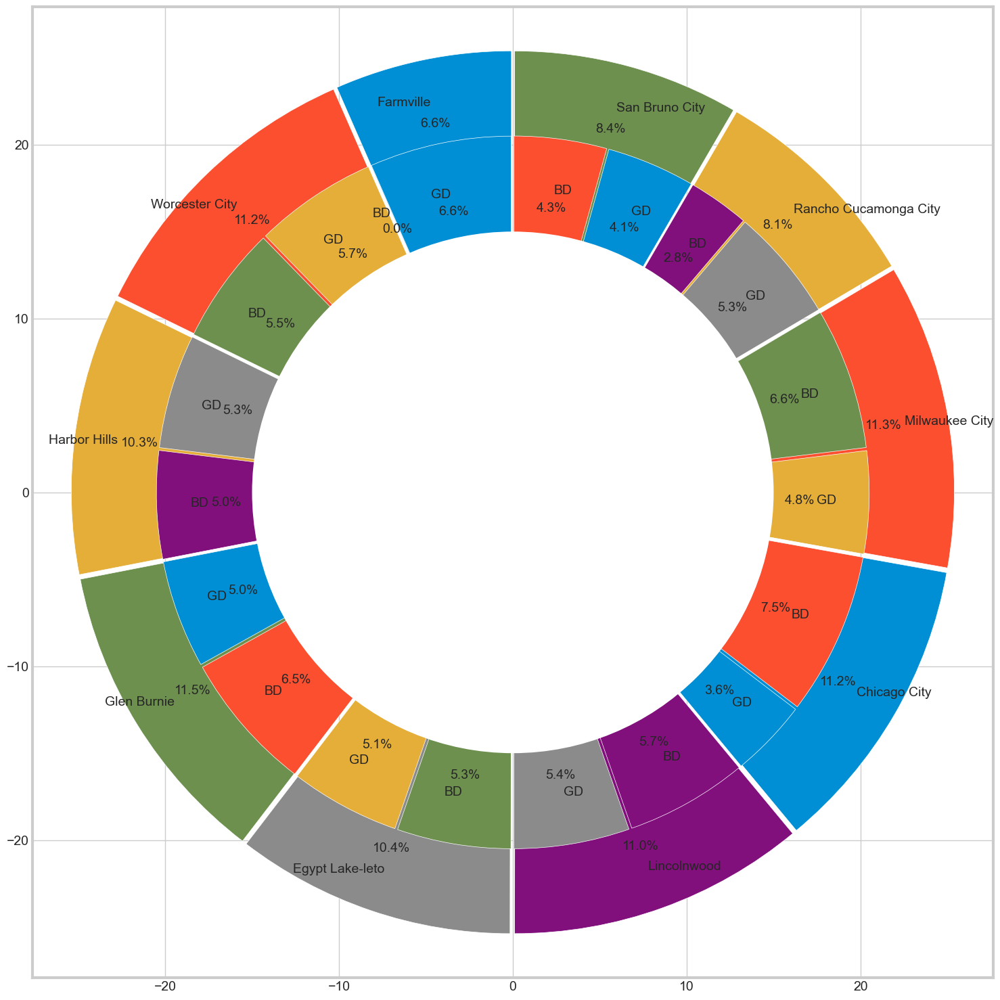

In [41]:
'''Since it is difficult to show all 2500 locations, without compromising readability, 
I have limited my selection to "Top 10" cities.'''

labels = list(df_pop.place[:10])
debt = list(df_pop.debt[:10])

sns.set_style("whitegrid")

gd_bd = l3[:20]

plt.figure(figsize = (15, 15))

color_pal = plt.rcParams['axes.prop_cycle'].by_key()['color']

plt.pie(debt, labels = labels, startangle = 90, frame = True, radius =25, autopct='%1.1f%%', pctdistance=0.85, 
        labeldistance = 0.9, colors = color_pal, explode = explode)
plt.pie(gd_bd, labels = labels_D, startangle = 90, frame = True, radius = 20, autopct='%1.1f%%', pctdistance=0.80, 
        labeldistance = 0.85, colors = color_pal, explode = explode_bd)
centre_circle = plt.Circle((0,0),15,color='black', fc='white',linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

plt.axis('equal')
plt.tight_layout()
plt.show()

### Box and whisker plot for the distribution of 2nd mortgage, home equity, good debt, and bad debt for different cities

In [42]:
second_mortgage = list(df_pop.second_mortgage)
home_equity = list(df_pop.home_equity)

Good_Debt = list(df_pop.good_debt)
Bad_Debt = list(df_pop.bad_debt)

In [43]:
'''Since it is difficult to show all 2500 locations, without compromising readability, 
I have limited my selection to "Top 10" cities.'''
df_pop['city'].value_counts()[:10].index

Index(['Chicago', 'Brooklyn', 'Houston', 'Los Angeles', 'Philadelphia',
       'San Antonio', 'Baltimore', 'Las Vegas', 'Phoenix', 'Miami'],
      dtype='object', name='city')

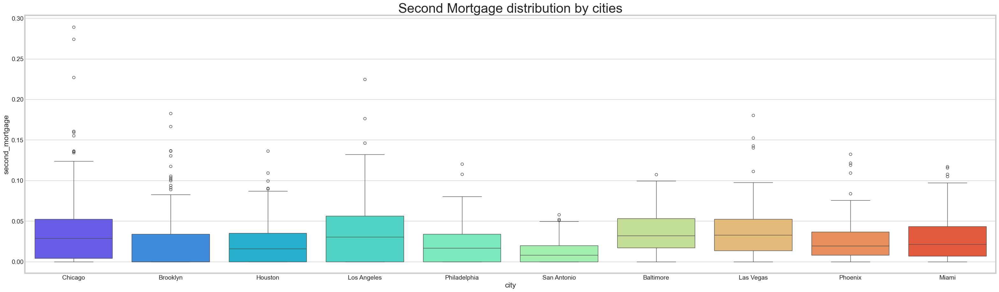

In [44]:
cities = ['Chicago', 'Brooklyn', 'Houston', 'Los Angeles', 'Philadelphia', 
          'San Antonio', 'Baltimore', 'Las Vegas', 'Phoenix', 'Miami']

boxplot_df = df_pop[df_pop['city'].isin(cities)]

sns.set_style("whitegrid")

plt.figure(figsize = (35, 10))
sns.boxplot(x='city',y='second_mortgage',data=boxplot_df,palette='rainbow', 
            order = ['Chicago', 'Brooklyn', 'Houston', 'Los Angeles', 'Philadelphia', 'San Antonio', 'Baltimore', 
                     'Las Vegas', 'Phoenix', 'Miami']).set_title('Second Mortgage distribution by cities', fontsize = 30)
plt.show()

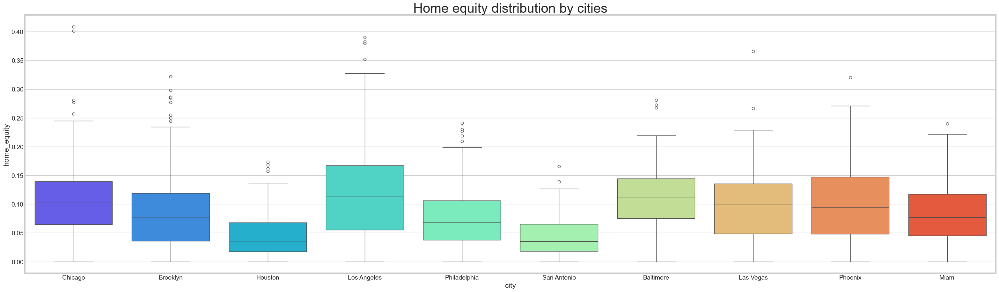

In [45]:
sns.set_style("whitegrid")

plt.figure(figsize = (35, 10))
sns.boxplot(x='city',y='home_equity',data=boxplot_df,palette='rainbow', 
            order = ['Chicago', 'Brooklyn', 'Houston', 'Los Angeles', 'Philadelphia', 'San Antonio', 'Baltimore', 
                     'Las Vegas', 'Phoenix', 'Miami']).set_title('Home equity distribution by cities', fontsize = 30)
plt.show()

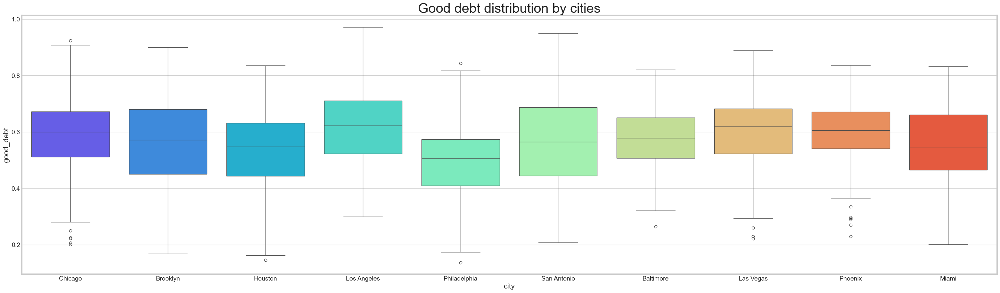

In [46]:
sns.set_style("whitegrid")

plt.figure(figsize = (35, 10))
sns.boxplot(x='city',y='good_debt',data=boxplot_df,palette='rainbow', 
            order = ['Chicago', 'Brooklyn', 'Houston', 'Los Angeles', 'Philadelphia', 'San Antonio', 'Baltimore', 
                     'Las Vegas', 'Phoenix', 'Miami']).set_title('Good debt distribution by cities', fontsize = 30)
plt.show()

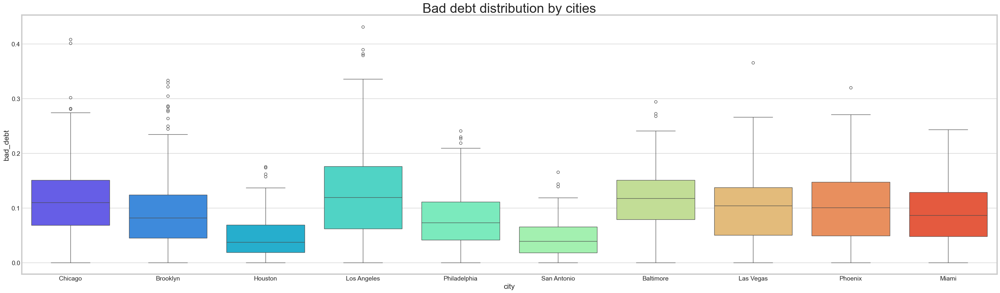

In [47]:
sns.set_style("whitegrid")

plt.figure(figsize = (35, 10))
sns.boxplot(x='city',y='bad_debt',data=boxplot_df,palette='rainbow', 
            order = ['Chicago', 'Brooklyn', 'Houston', 'Los Angeles', 'Philadelphia', 'San Antonio', 'Baltimore', 
                     'Las Vegas', 'Phoenix', 'Miami']).set_title('Bad debt distribution by cities', fontsize = 30)
plt.show()

- Since it is difficult to show 2500 locations, for better readability, I have limited it to Top 10 cities.

### Creating a collated income distribution chart for family income, house hold income and remaining income.

In [48]:
df_pop['remaining_income'] = df_pop['family_median'] - df_pop['hi_median']

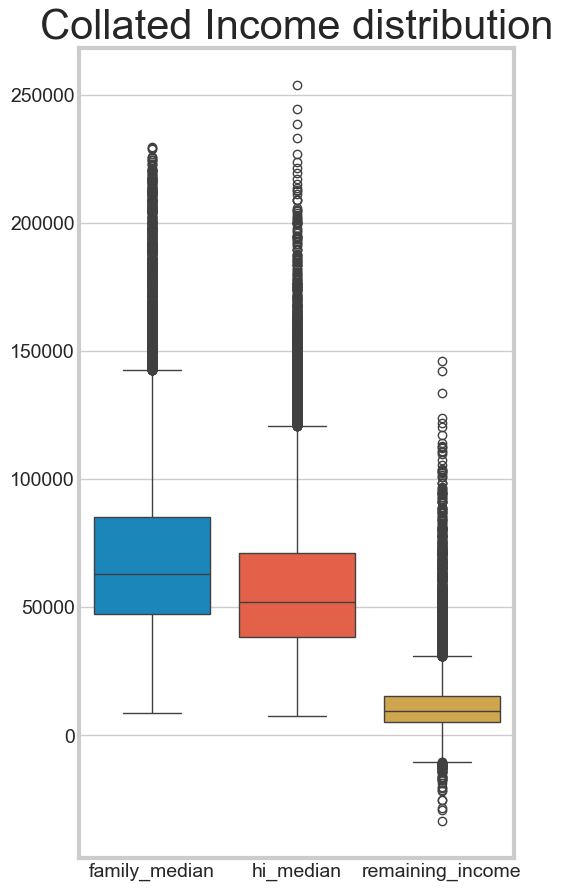

In [49]:
sns.set_style("whitegrid")
plt.figure(figsize = (5, 10))
sns.boxplot(data=df_pop[['family_median', 'hi_median', 'remaining_income']], 
            palette=color_pal).set_title('Collated Income distribution', fontsize = 30)
plt.show()

## Performing EDA & coming out with insights into population density & age :

In [50]:
#creating a new column named Population density
df_pop["population_density"] = df_pop['pop']/df_pop['ALand']
df_pop.head()

,UID,COUNTYID,STATEID,state,state_ab,city,place,type,primary,zip_code,area_code,lat,lng,ALand,AWater,pop,male_pop,female_pop,rent_mean,rent_median,rent_stdev,rent_sample_weight,rent_samples,rent_gt_10,rent_gt_15,rent_gt_20,rent_gt_25,rent_gt_30,rent_gt_35,rent_gt_40,rent_gt_50,universe_samples,used_samples,hi_mean,hi_median,hi_stdev,hi_sample_weight,hi_samples,family_mean,family_median,family_stdev,family_sample_weight,family_samples,hc_mortgage_mean,hc_mortgage_median,hc_mortgage_stdev,hc_mortgage_sample_weight,hc_mortgage_samples,hc_mean,hc_median,hc_stdev,hc_samples,hc_sample_weight,home_equity_second_mortgage,second_mortgage,home_equity,debt,second_mortgage_cdf,home_equity_cdf,debt_cdf,hs_degree,hs_degree_male,hs_degree_female,male_age_mean,male_age_median,male_age_stdev,male_age_sample_weight,male_age_samples,female_age_mean,female_age_median,female_age_stdev,female_age_sample_weight,female_age_samples,pct_own,married,married_snp,separated,divorced,text,bad_debt,good_debt,remaining_income,population_density
3285,289712,147,51,Virginia,VA,Farmville,Farmville,Town,tract,23901,434,37.297357,-78.396452,413391.0,0,1733,609,1124,782.00000,781.0,22.95830,11.00000,11.0,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,0.00000,11,11,33088.92156,23236.0,19970.41249,16.33316,19.0,47067.92731,59954.0,24030.19608,5.33316,8.0,2249.50000,2249.0,182.57419,0.79359,4.0,749.50000,749.0,36.51484,4.0,1.97980,0.00000,0.50000,0.00000,0.50000,0.00067,1.00000,0.77776,1.00000,1.00000,1.00000,21.33803,19.25000,9.50021,364.20985,609.0,19.58762,19.16667,4.00258,673.39577,1124.0,0.62069,0.03612,0.01806,0.01806,0.00000,Farmville Second Mortgage : 50.0%,0.50000,0.00000,36718.0,0.004192
11980,251185,27,25,Massachusetts,MA,Worcester,Worcester City,City,tract,1610,508,42.254262,-71.800347,797165.0,0,2133,1139,994,942.32740,953.0,304.34109,333.88019,645.0,0.98906,0.97813,0.86250,0.81563,0.68438,0.53281,0.47500,0.39063,655,640,39036.18368,29037.0,42317.65457,599.87224,768.0,50471.95789,40476.0,45794.28515,314.09134,432.0,1596.15811,1690.0,465.71234,30.05003,96.0,589.73200,528.0,198.18324,17.0,10.43434,0.43363,0.43363,0.43363,0.84956,0.00100,0.00468,0.08684,0.71803,0.68883,0.75828,30.99146,30.75000,18.15286,255.90977,1139.0,30.60147,26.16667,19.21553,262.09529,994.0,0.20247,0.37844,0.11976,0.09341,0.10539,Worcester City Second Mortgage : 43.36%,0.43363,0.41593,11439.0,0.002676
26018,269323,81,36,New York,NY,Corona,Harbor Hills,City,tract,11368,718,40.751809,-73.853582,169666.0,0,4181,2249,1932,1413.12357,1388.0,499.47343,205.65925,777.0,1.00000,0.92664,0.80952,0.69241,0.58301,0.44659,0.37967,0.30245,821,777,56434.63436,46106.0,47279.53535,674.74625,997.0,48558.91165,40462.0,35569.90113,630.41529,878.0,3037.81395,3320.0,888.70919,29.17150,138.0,751.81483,894.0,269.48263,38.0,23.35354,0.31818,0.31818,0.40341,0.78409,0.00241,0.00638,0.18540,0.58739,0.61499,0.55192,30.09851,29.58333,18.22005,483.12831,2249.0,29.80694,27.66667,18.45616,448.69061,1932.0,0.15618,0.44490,0.14555,0.02357,0.04066,Harbor Hills Second Mortgage : 31.82%,0.40341,0.38068,-5644.0,0.024643
7829,251324,3,24,Maryland,MD,Glen Burnie,Glen Burnie,CDP,tract,21061,410,39.127273,-76.635265,1110282.0,0,4866,1985,2881,1335.49818,1335.0,336.92824,352.62444,1502.0,1.00000,0.91545,0.77763,0.60186,0.49001,0.42011,0.38016,0.23435,1502,1502,59466.62302,50164.0,37351.26266,1293.31194,2068.0,64899.68626,50705.0,39727.56212,706.84520,1125.0,1622.29005,1520.0,511.53797,156.43774,496.0,452.77058,509.0,165.06276,70.0,49.29293,0.27739,0.30212,0.35689,0.87633,0.00289,0.01131,0.05915,0.86185,0.85294,0.86732,29.07276,27.41667,19.97922,475.95730,1985.0,32.53273,30.66667,19.61959,694.10357,2881.0,0.22380,0.58250,0.08321,0.00000,0.01778,Glen Burnie Second Mortgage : 30.21%,0.38162,0.49471,541.0,0.004383
2077,235788,57,12,Florida,FL,Tampa,Egypt Lake-leto,City,tract,33614,813,28.029063,-82.495395,2050906.0,234794,5468,2784,2684,914.10322,880.0,191.64962,1067.77502,1847.0,0.96619,0.92794,0.80820,0.58925,0.44235,0.3714

In [51]:
#creating a new column named median age
df_pop["median_age"] = (df_pop['male_age_median'] * df_pop['male_pop'] + df_pop['female_age_median'] * df_pop['female_pop'])  / df_pop['pop']

df_pop.head()

,UID,COUNTYID,STATEID,state,state_ab,city,place,type,primary,zip_code,area_code,lat,lng,ALand,AWater,pop,male_pop,female_pop,rent_mean,rent_median,rent_stdev,rent_sample_weight,rent_samples,rent_gt_10,rent_gt_15,rent_gt_20,rent_gt_25,rent_gt_30,rent_gt_35,rent_gt_40,rent_gt_50,universe_samples,used_samples,hi_mean,hi_median,hi_stdev,hi_sample_weight,hi_samples,family_mean,family_median,family_stdev,family_sample_weight,family_samples,hc_mortgage_mean,hc_mortgage_median,hc_mortgage_stdev,hc_mortgage_sample_weight,hc_mortgage_samples,hc_mean,hc_median,hc_stdev,hc_samples,hc_sample_weight,home_equity_second_mortgage,second_mortgage,home_equity,debt,second_mortgage_cdf,home_equity_cdf,debt_cdf,hs_degree,hs_degree_male,hs_degree_female,male_age_mean,male_age_median,male_age_stdev,male_age_sample_weight,male_age_samples,female_age_mean,female_age_median,female_age_stdev,female_age_sample_weight,female_age_samples,pct_own,married,married_snp,separated,divorced,text,bad_debt,good_debt,remaining_income,population_density,median_age
3285,289712,147,51,Virginia,VA,Farmville,Farmville,Town,tract,23901,434,37.297357,-78.396452,413391.0,0,1733,609,1124,782.00000,781.0,22.95830,11.00000,11.0,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,0.00000,11,11,33088.92156,23236.0,19970.41249,16.33316,19.0,47067.92731,59954.0,24030.19608,5.33316,8.0,2249.50000,2249.0,182.57419,0.79359,4.0,749.50000,749.0,36.51484,4.0,1.97980,0.00000,0.50000,0.00000,0.50000,0.00067,1.00000,0.77776,1.00000,1.00000,1.00000,21.33803,19.25000,9.50021,364.20985,609.0,19.58762,19.16667,4.00258,673.39577,1124.0,0.62069,0.03612,0.01806,0.01806,0.00000,Farmville Second Mortgage : 50.0%,0.50000,0.00000,36718.0,0.004192,19.195953
11980,251185,27,25,Massachusetts,MA,Worcester,Worcester City,City,tract,1610,508,42.254262,-71.800347,797165.0,0,2133,1139,994,942.32740,953.0,304.34109,333.88019,645.0,0.98906,0.97813,0.86250,0.81563,0.68438,0.53281,0.47500,0.39063,655,640,39036.18368,29037.0,42317.65457,599.87224,768.0,50471.95789,40476.0,45794.28515,314.09134,432.0,1596.15811,1690.0,465.71234,30.05003,96.0,589.73200,528.0,198.18324,17.0,10.43434,0.43363,0.43363,0.43363,0.84956,0.00100,0.00468,0.08684,0.71803,0.68883,0.75828,30.99146,30.75000,18.15286,255.90977,1139.0,30.60147,26.16667,19.21553,262.09529,994.0,0.20247,0.37844,0.11976,0.09341,0.10539,Worcester City Second Mortgage : 43.36%,0.43363,0.41593,11439.0,0.002676,28.614121
26018,269323,81,36,New York,NY,Corona,Harbor Hills,City,tract,11368,718,40.751809,-73.853582,169666.0,0,4181,2249,1932,1413.12357,1388.0,499.47343,205.65925,777.0,1.00000,0.92664,0.80952,0.69241,0.58301,0.44659,0.37967,0.30245,821,777,56434.63436,46106.0,47279.53535,674.74625,997.0,48558.91165,40462.0,35569.90113,630.41529,878.0,3037.81395,3320.0,888.70919,29.17150,138.0,751.81483,894.0,269.48263,38.0,23.35354,0.31818,0.31818,0.40341,0.78409,0.00241,0.00638,0.18540,0.58739,0.61499,0.55192,30.09851,29.58333,18.22005,483.12831,2249.0,29.80694,27.66667,18.45616,448.69061,1932.0,0.15618,0.44490,0.14555,0.02357,0.04066,Harbor Hills Second Mortgage : 31.82%,0.40341,0.38068,-5644.0,0.024643,28.697660
7829,251324,3,24,Maryland,MD,Glen Burnie,Glen Burnie,CDP,tract,21061,410,39.127273,-76.635265,1110282.0,0,4866,1985,2881,1335.49818,1335.0,336.92824,352.62444,1502.0,1.00000,0.91545,0.77763,0.60186,0.49001,0.42011,0.38016,0.23435,1502,1502,59466.62302,50164.0,37351.26266,1293.31194,2068.0,64899.68626,50705.0,39727.56212,706.84520,1125.0,1622.29005,1520.0,511.53797,156.43774,496.0,452.77058,509.0,165.06276,70.0,49.29293,0.27739,0.30212,0.35689,0.87633,0.00289,0.01131,0.05915,0.86185,0.85294,0.86732,29.07276,27.41667,19.97922,475.95730,1985.0,32.53273,30.66667,19.61959,694.10357,2881.0,0.22380,0.58250,0.08321,0.00000,0.01778,Glen Burnie Second Mortgage : 30.21%,0.38162,0.49471,541.0,0.004383,29.340889
2077,235788,57,12,Florida,FL,Tampa,Egypt Lake-leto,City,tract,33614,813,28.029063,-82.495395,2050906.0,234794,5468,2784,2684,914.10322,880.0,191.64962,1067.77502,18

In [52]:
df_pop.shape

(26215, 84)

In [54]:
# Grouping by "place" and calculating the mean for numeric columns only & sorting by "population_density" in ascending order
numeric_cols = df_pop.select_dtypes(include=[np.number]).columns
grouped_df2 = df_pop.groupby("place")[numeric_cols].mean().reset_index()
grouped_df2.sort_values("population_density", ascending = False, inplace = True)

In [56]:
grouped_df2.head(10)

,place,UID,COUNTYID,STATEID,zip_code,area_code,lat,lng,ALand,AWater,pop,male_pop,female_pop,rent_mean,rent_median,rent_stdev,rent_sample_weight,rent_samples,rent_gt_10,rent_gt_15,rent_gt_20,rent_gt_25,rent_gt_30,rent_gt_35,rent_gt_40,rent_gt_50,universe_samples,used_samples,hi_mean,hi_median,hi_stdev,hi_sample_weight,hi_samples,family_mean,family_median,family_stdev,family_sample_weight,family_samples,hc_mortgage_mean,hc_mortgage_median,hc_mortgage_stdev,hc_mortgage_sample_weight,hc_mortgage_samples,hc_mean,hc_median,hc_stdev,hc_samples,hc_sample_weight,home_equity_second_mortgage,second_mortgage,home_equity,debt,second_mortgage_cdf,home_equity_cdf,debt_cdf,hs_degree,hs_degree_male,hs_degree_female,male_age_mean,male_age_median,male_age_stdev,male_age_sample_weight,male_age_samples,female_age_mean,female_age_median,female_age_stdev,female_age_sample_weight,female_age_samples,pct_own,married,married_snp,separated,divorced,bad_debt,good_debt,remaining_income,population_density,median_age
9397,West New York,263686.000000,17.000000,34.000000,7090.600000,201.000000,40.782705,-74.017704,2.221112e+05,0.000000,5050.200000,2511.200000,2539.000000,1162.259002,1137.000000,464.796138,584.277416,1493.200000,0.979064,0.894584,0.795550,0.684530,0.582650,0.496846,0.429588,0.309610,1516.200000,1450.400000,55590.418086,41103.000000,51266.212952,1218.981086,1860.400000,57208.755690,44331.200000,45848.033086,772.543936,1208.200000,2735.812492,2672.600000,831.971622,49.057956,224.200000,993.602928,946.800000,429.697332,120.000000,58.527378,0.052770,0.061372,0.073476,0.690774,0.482274,0.584450,0.386330,0.733480,0.720220,0.747152,37.219120,35.383332,20.665828,591.858848,2511.200000,40.225510,39.933332,21.915406,612.336036,2539.000000,0.182894,0.410730,0.095736,0.034744,0.080046,0.082078,0.608696,3228.200000,0.022999,37.584970
6749,Pelham Manor,266279.073171,7.731707,36.000000,10442.170732,682.512195,40.841320,-73.867621,2.983027e+05,37782.439024,3994.000000,1845.414634,2148.585366,1203.362318,1181.243902,452.020770,435.760891,1087.658537,0.967115,0.893783,0.800241,0.693904,0.590978,0.496035,0.435634,0.341222,1111.268293,1070.439024,58502.622750,44428.682927,51355.127323,939.580236,1471.439024,64546.811042,53212.658537,48590.980901,538.037229,912.682927,2178.254525,2069.463415,812.845129,72.933181,238.853659,751.584478,703.195122,320.573905,121.317073,65.214028,0.022571,0.022879,0.081304,0.673274,0.656626,0.589730,0.411587,0.746182,0.733019,0.756151,36.526708,34.508130,21.221424,454.403004,1845.414634,39.260368,38.520326,22.144527,521.094943,2148.585366,0.309986,0.416497,0.090263,0.036900,0.077686,0.081611,0.591662,8783.975610,0.021001,36.632666
6065,New York City,268124.114355,58.897810,36.000000,11019.703163,652.029197,40.676638,-73.954562,3.196676e+05,51463.737226,3775.260341,1804.060827,1971.199513,1473.639762,1442.574209,565.666603,275.228792,921.038929,0.950093,0.866289,0.754370,0.634043,0.529436,0.447912,0.387028,0.301024,949.338200,896.746959,82425.185626,65847.486618,67056.203377,744.123631,1475.080292,92065.692741,82691.712895,60500.817065,398.367443,838.980535,2647.758185,2620.335766,947.457923,82.586866,326.226277,837.748624,825.445255,344.481322,199.515815,101.212713,0.015561,0.020927,0.081382,0.621186,0.670061,0.562106,0.514637,0.828262,0.827333,0.829071,37.624720,36.213504,20.633348,431.332496,1804.060827,39.487951,38.024533,21.476599,468.521450,1971.199513,0.413406,0.481331,0.065529,0.020454,0.057958,0.086748,0.534439,16844.226277,0.019496,37.150870
3534,Guttenberg,263673.000000,17.000000,34.000000,7074.600000,201.000000,40.793572,-74.006911,2.652618e+05,105465.200000,4545.000000,2179.000000,2366.000000,1636.453850,1569.200000,610.853568,233.331962,825.800000,0.954318,0.830924,0.701378,0.576524,0.469410,0.388840,0.300516,0.252056,848.800000,825.800000,88329.129176,72075.600000,65439.035304,810.847998,1557.400000,97516.064360,89319.800000,60208.247404,523.081900,1036.600000,2708.331912,2642.000000,1078.608570,128.886000,497.400000,1096

- Hence the top 10 places as per population_density in decreasing order is: 'West New York', 'Pelham Manor', 'New York City', 'Guttenberg', 'Hoboken City', 'Harbor Hills', 'Sausalito City', 'Mount Vernon City', 'Jersey City City', 'Yeadon'.

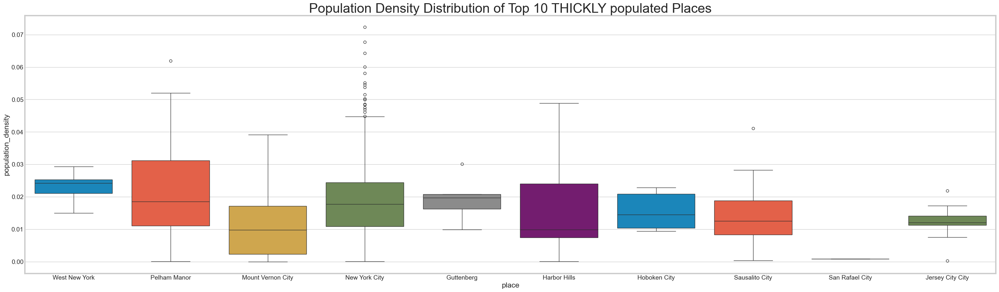

In [57]:
sns.set_style("whitegrid")
plt.figure(figsize = (35, 10))
sns.boxplot(x = 'place', y = 'population_density', data=df_pop.nlargest(26718, 'population_density'), 
            palette=color_pal, order = ['West New York', 'Pelham Manor', 'Mount Vernon City', 
                                        'New York City', 'Guttenberg', 'Harbor Hills', 'Hoboken City', 
                                        'Sausalito City', 'San Rafael City', 'Jersey City City']).set_title('Population Density Distribution of Top 10 THICKLY populated Places', fontsize = 30)
plt.show()

In [58]:
# Grouping by "state" and calculating the mean for numeric columns only & sorting by "population_density" in descending order
grouped_df3 = df_pop.groupby("state")[numeric_cols].mean().reset_index()
grouped_df3.sort_values("population_density", ascending = False, inplace = True)

In [59]:
grouped_df3.head(10)

,state,UID,COUNTYID,STATEID,zip_code,area_code,lat,lng,ALand,AWater,pop,male_pop,female_pop,rent_mean,rent_median,rent_stdev,rent_sample_weight,rent_samples,rent_gt_10,rent_gt_15,rent_gt_20,rent_gt_25,rent_gt_30,rent_gt_35,rent_gt_40,rent_gt_50,universe_samples,used_samples,hi_mean,hi_median,hi_stdev,hi_sample_weight,hi_samples,family_mean,family_median,family_stdev,family_sample_weight,family_samples,hc_mortgage_mean,hc_mortgage_median,hc_mortgage_stdev,hc_mortgage_sample_weight,hc_mortgage_samples,hc_mean,hc_median,hc_stdev,hc_samples,hc_sample_weight,home_equity_second_mortgage,second_mortgage,home_equity,debt,second_mortgage_cdf,home_equity_cdf,debt_cdf,hs_degree,hs_degree_male,hs_degree_female,male_age_mean,male_age_median,male_age_stdev,male_age_sample_weight,male_age_samples,female_age_mean,female_age_median,female_age_stdev,female_age_sample_weight,female_age_samples,pct_own,married,married_snp,separated,divorced,bad_debt,good_debt,remaining_income,population_density,median_age
32,New York,268436.077068,62.780702,36.0,12088.854637,632.058897,41.578063,-74.734822,2.719271e+07,1.215442e+06,4029.299499,1955.720551,2073.578947,1271.721203,1230.568296,476.467343,245.322914,593.949875,0.957529,0.868045,0.751784,0.634672,0.526339,0.442472,0.379079,0.291604,618.808897,580.714286,81373.622081,67133.473058,62234.728227,776.864789,1496.789474,90352.019748,80926.715539,56533.752799,432.140345,961.533835,2198.238536,2151.381579,797.165467,188.851498,554.655388,793.613588,778.686090,310.089499,323.325188,175.711654,0.017890,0.022275,0.104396,0.629268,0.570410,0.458773,0.507810,0.863976,0.859259,0.868522,38.733514,38.423298,21.570392,486.628841,1955.720551,40.945373,40.981568,22.293253,507.874392,2073.578947,0.613066,0.503955,0.056022,0.020495,0.074630,0.108781,0.520487,13793.242481,0.007876,39.712119
8,District of Columbia,234121.793651,1.000000,11.0,20012.238095,207.365079,38.907685,-77.007544,8.434634e+05,2.669059e+04,3798.047619,1781.047619,2017.000000,1416.399908,1326.158730,630.259117,315.187220,935.952381,0.946842,0.850060,0.733110,0.601082,0.481240,0.396121,0.333405,0.260723,962.174603,912.873016,91821.178179,75335.873016,71716.580547,749.115425,1647.349206,109398.881307,102648.095238,63476.349150,281.975346,693.936508,2226.000518,2167.523810,825.796258,143.103925,517.507937,649.115363,621.349206,266.183987,167.666667,94.711640,0.056848,0.064756,0.156508,0.758100,0.267708,0.275911,0.263103,0.884975,0.875870,0.891590,36.375987,33.722222,20.067259,450.742477,1781.047619,38.969143,36.537037,20.743642,518.580429,2017.000000,0.438463,0.321270,0.060650,0.026684,0.088382,0.164416,0.593684,27312.222222,0.006672,35.331991
11,Hawaii,240818.892857,3.625000,15.0,96772.866071,808.000000,21.102924,-157.442964,3.881117e+07,2.592509e+06,4899.839286,2442.919643,2456.919643,1681.996440,1616.392857,607.903490,183.314567,571.375000,0.973181,0.899392,0.796539,0.671492,0.548564,0.446280,0.368232,0.271972,621.125000,561.008929,89929.657105,75764.187500,64267.606026,761.269241,1571.642857,96380.206390,86088.580357,57729.424754,449.607211,1075.232143,2356.472729,2264.401786,911.748937,179.988795,641.812500,574.524905,537.928571,244.007022,308.705357,203.501099,0.023888,0.030153,0.132161,0.660568,0.422175,0.350084,0.455336,0.914682,0.924006,0.905908,40.296597,39.832589,21.962341,605.004693,2442.919643,42.473221,42.526786,22.901947,592.649283,2456.919643,0.628629,0.508870,0.058776,0.013431,0.094509,0.138426,0.522142,10324.392857,0.003502,41.174154
30,New Jersey,263728.705795,18.893016,34.0,7852.398217,717.251114,40.398053,-74.452933,1.095862e+07,7.206464e+05,4478.114413,2170.742942,2307.371471,1389.959943,1339.985141,500.921846,179.706585,521.105498,0.963412,0.890258,0.772873,0.648059,0.532189,0.439917,0.376119,0.279576,540.789004,509.942051,93228.887430,79082.713224,67341.747052,753.778993,1614.739970,102119.622407,93542.560178,59707.560669,441.443101,1123.637444,2418.087356,2371.337296,808.930711,181.063295,741.627043,996.073537,994.551263,303.119364

- Hence the top 10 States as per population_density in decreasing order is: 'New York', 'District of Columbia', 'Hawaii', 'New Jersey', 'California', 'Massachusetts', 'Illinois', 'Puerto Rico', 'Pennsylvania', 'Rhode Island'.

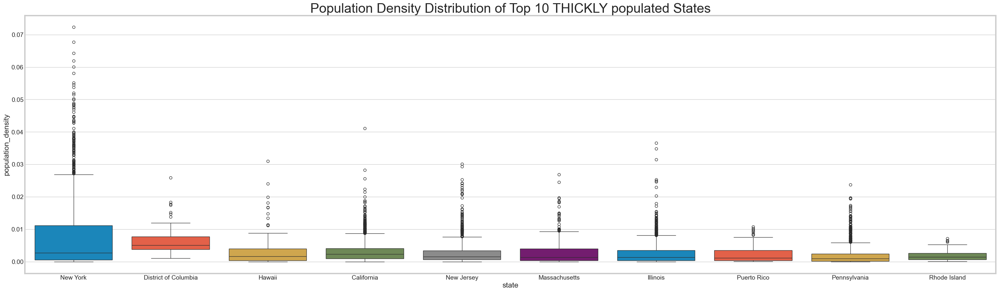

In [60]:
sns.set_style("whitegrid")
plt.figure(figsize = (35, 10))
sns.boxplot(x = 'state', y = 'population_density', data=df_pop.nlargest(26718, 'population_density'), palette=color_pal, 
            order = ['New York', 'District of Columbia', 'Hawaii', 'California', 'New Jersey', 
                     'Massachusetts', 'Illinois', 'Puerto Rico', 'Pennsylvania', 'Rhode Island']).set_title('Population Density Distribution of Top 10 THICKLY populated States', fontsize = 30)
plt.show()

In [61]:
# Grouping by "state", calculating the mean for numeric columns only & sorting by "population_density" in ascending order
grouped_df4 = df_pop.groupby("state")[numeric_cols].mean().reset_index()
grouped_df4.sort_values("population_density", ascending = False, inplace = True)

In [62]:
grouped_df4.head(10)

,state,UID,COUNTYID,STATEID,zip_code,area_code,lat,lng,ALand,AWater,pop,male_pop,female_pop,rent_mean,rent_median,rent_stdev,rent_sample_weight,rent_samples,rent_gt_10,rent_gt_15,rent_gt_20,rent_gt_25,rent_gt_30,rent_gt_35,rent_gt_40,rent_gt_50,universe_samples,used_samples,hi_mean,hi_median,hi_stdev,hi_sample_weight,hi_samples,family_mean,family_median,family_stdev,family_sample_weight,family_samples,hc_mortgage_mean,hc_mortgage_median,hc_mortgage_stdev,hc_mortgage_sample_weight,hc_mortgage_samples,hc_mean,hc_median,hc_stdev,hc_samples,hc_sample_weight,home_equity_second_mortgage,second_mortgage,home_equity,debt,second_mortgage_cdf,home_equity_cdf,debt_cdf,hs_degree,hs_degree_male,hs_degree_female,male_age_mean,male_age_median,male_age_stdev,male_age_sample_weight,male_age_samples,female_age_mean,female_age_median,female_age_stdev,female_age_sample_weight,female_age_samples,pct_own,married,married_snp,separated,divorced,bad_debt,good_debt,remaining_income,population_density,median_age
32,New York,268436.077068,62.780702,36.0,12088.854637,632.058897,41.578063,-74.734822,2.719271e+07,1.215442e+06,4029.299499,1955.720551,2073.578947,1271.721203,1230.568296,476.467343,245.322914,593.949875,0.957529,0.868045,0.751784,0.634672,0.526339,0.442472,0.379079,0.291604,618.808897,580.714286,81373.622081,67133.473058,62234.728227,776.864789,1496.789474,90352.019748,80926.715539,56533.752799,432.140345,961.533835,2198.238536,2151.381579,797.165467,188.851498,554.655388,793.613588,778.686090,310.089499,323.325188,175.711654,0.017890,0.022275,0.104396,0.629268,0.570410,0.458773,0.507810,0.863976,0.859259,0.868522,38.733514,38.423298,21.570392,486.628841,1955.720551,40.945373,40.981568,22.293253,507.874392,2073.578947,0.613066,0.503955,0.056022,0.020495,0.074630,0.108781,0.520487,13793.242481,0.007876,39.712119
8,District of Columbia,234121.793651,1.000000,11.0,20012.238095,207.365079,38.907685,-77.007544,8.434634e+05,2.669059e+04,3798.047619,1781.047619,2017.000000,1416.399908,1326.158730,630.259117,315.187220,935.952381,0.946842,0.850060,0.733110,0.601082,0.481240,0.396121,0.333405,0.260723,962.174603,912.873016,91821.178179,75335.873016,71716.580547,749.115425,1647.349206,109398.881307,102648.095238,63476.349150,281.975346,693.936508,2226.000518,2167.523810,825.796258,143.103925,517.507937,649.115363,621.349206,266.183987,167.666667,94.711640,0.056848,0.064756,0.156508,0.758100,0.267708,0.275911,0.263103,0.884975,0.875870,0.891590,36.375987,33.722222,20.067259,450.742477,1781.047619,38.969143,36.537037,20.743642,518.580429,2017.000000,0.438463,0.321270,0.060650,0.026684,0.088382,0.164416,0.593684,27312.222222,0.006672,35.331991
11,Hawaii,240818.892857,3.625000,15.0,96772.866071,808.000000,21.102924,-157.442964,3.881117e+07,2.592509e+06,4899.839286,2442.919643,2456.919643,1681.996440,1616.392857,607.903490,183.314567,571.375000,0.973181,0.899392,0.796539,0.671492,0.548564,0.446280,0.368232,0.271972,621.125000,561.008929,89929.657105,75764.187500,64267.606026,761.269241,1571.642857,96380.206390,86088.580357,57729.424754,449.607211,1075.232143,2356.472729,2264.401786,911.748937,179.988795,641.812500,574.524905,537.928571,244.007022,308.705357,203.501099,0.023888,0.030153,0.132161,0.660568,0.422175,0.350084,0.455336,0.914682,0.924006,0.905908,40.296597,39.832589,21.962341,605.004693,2442.919643,42.473221,42.526786,22.901947,592.649283,2456.919643,0.628629,0.508870,0.058776,0.013431,0.094509,0.138426,0.522142,10324.392857,0.003502,41.174154
30,New Jersey,263728.705795,18.893016,34.0,7852.398217,717.251114,40.398053,-74.452933,1.095862e+07,7.206464e+05,4478.114413,2170.742942,2307.371471,1389.959943,1339.985141,500.921846,179.706585,521.105498,0.963412,0.890258,0.772873,0.648059,0.532189,0.439917,0.376119,0.279576,540.789004,509.942051,93228.887430,79082.713224,67341.747052,753.778993,1614.739970,102119.622407,93542.560178,59707.560669,441.443101,1123.637444,2418.087356,2371.337296,808.930711,181.063295,741.627043,996.073537,994.551263,303.119364

- Hence the top 10 states as per population_density in increasing order is: 'New York', 'District of Columbia', 'Hawaii', 'New Jersey', 'California', 'Massachusetts', 'Illinois', 'Puerto Rico', 'Pennsylvania', 'Rhode Island'.

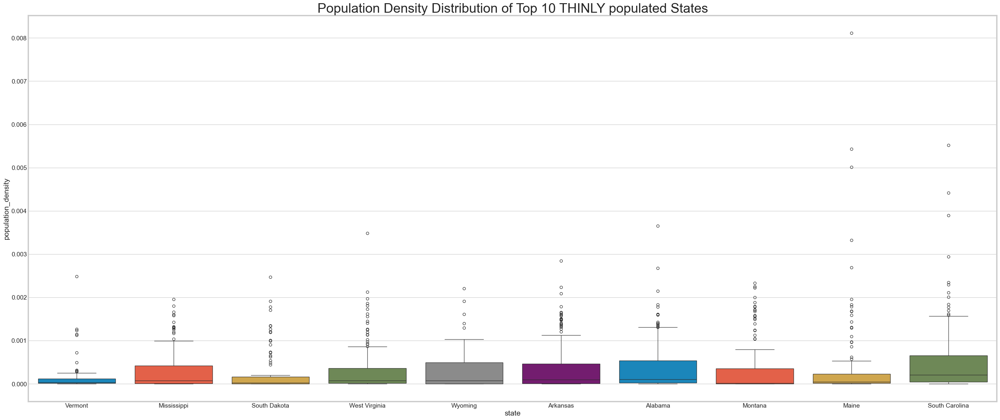

In [63]:
sns.set_style("whitegrid")
plt.figure(figsize = (35, 15))
sns.boxplot(x = 'state', y = 'population_density', data=df_pop.nsmallest(26718, 'population_density'), palette=color_pal, 
            order = ['Vermont', 'Mississippi', 'South Dakota', 'West Virginia', 'Wyoming', 'Arkansas', 'Alabama', 
                     'Montana', 'Maine', 'South Carolina']).set_title('Population Density Distribution of Top 10 THINLY populated States', fontsize = 30)
plt.show()

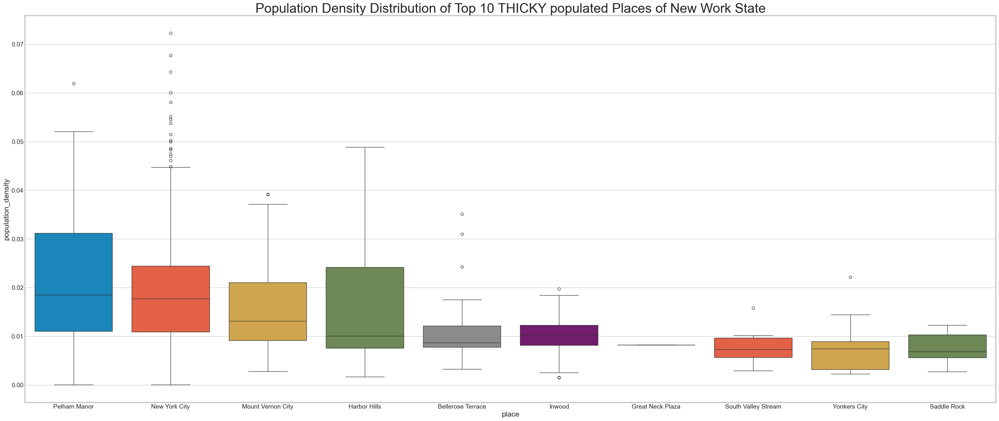

In [66]:
sns.set_style("whitegrid")
plt.figure(figsize = (35, 15))
sns.boxplot(x = 'place', y = 'population_density', data=df_pop[df_pop['state'] == 'New York'].nlargest(26718, 'population_density'), palette=color_pal, 
            order = ['Pelham Manor', 'New York City', 'Mount Vernon City', 'Harbor Hills', 
                     'Bellerose Terrace', 'Inwood', 'Great Neck Plaza', 'South Valley Stream', 
                     'Yonkers City', 'Saddle Rock']).set_title('Population Density Distribution of Top 10 THICKY populated Places of New Work State', fontsize = 30)
plt.show()

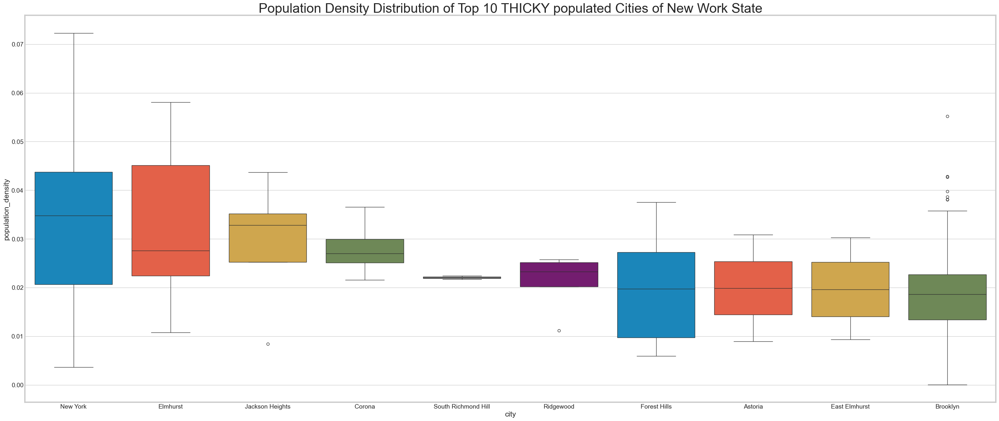

In [68]:
sns.set_style("whitegrid")
plt.figure(figsize = (35, 15))
sns.boxplot(x = 'city', y = 'population_density', data=df_pop[df_pop['state'] == 'New York'].nlargest(26718, 'population_density'), palette=color_pal, 
            order = ['New York', 'Elmhurst', 'Jackson Heights', 'Corona', 'South Richmond Hill', 'Ridgewood', 
                     'Forest Hills', 'Astoria', 'East Elmhurst', 'Brooklyn']).set_title('Population Density Distribution of Top 10 THICKY populated Cities of New Work State', fontsize = 30)
plt.show()

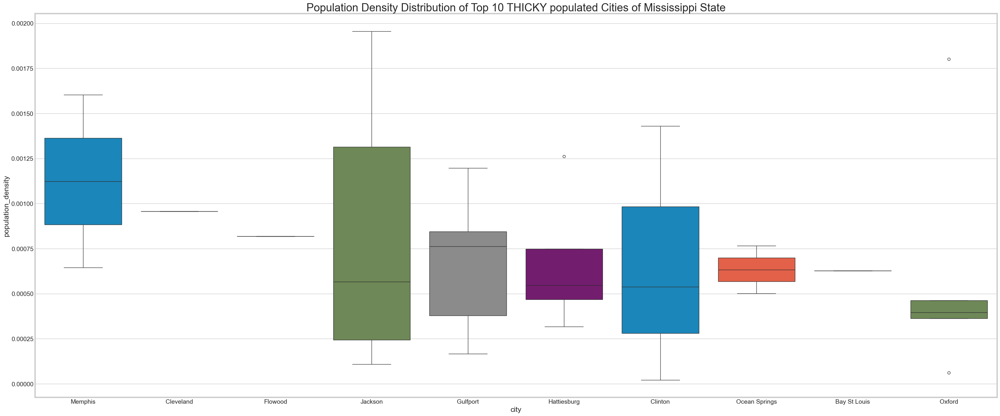

In [69]:
sns.set_style("whitegrid")
plt.figure(figsize = (35, 15))
sns.boxplot(x = 'city', y = 'population_density', data=df_pop[df_pop['state'] == 'Mississippi'].nlargest(26718, 'population_density'), palette=color_pal, 
            order = ['Memphis', 'Cleveland', 'Flowood', 'Jackson', 'Gulfport', 'Hattiesburg', 'Clinton', 
                     'Ocean Springs', 'Bay St Louis', 'Oxford']).set_title('Population Density Distribution of Top 10 THICKY populated Cities of Mississippi State', fontsize = 25)
plt.show()

In [70]:
print(list(df_pop.nlargest(500, 'median_age').state.unique()))
print(len(list(df_pop.nlargest(500, 'median_age').state.unique())))

['New York', 'Florida', 'California', 'Maryland', 'New Jersey', 'Arizona', 'Nevada', 'Arkansas', 'Illinois', 'North Carolina', 'South Carolina', 'Delaware', 'Ohio', 'Texas', 'Georgia', 'Alabama', 'New Mexico', 'Tennessee', 'Oregon', 'Michigan', 'Hawaii', 'Massachusetts', 'Minnesota', 'Wisconsin', 'Missouri', 'Washington', 'Colorado', 'Virginia', 'Maine', 'Mississippi', 'Pennsylvania', 'Louisiana', 'Indiana', 'Oklahoma', 'Wyoming', 'Montana', 'Connecticut']
37


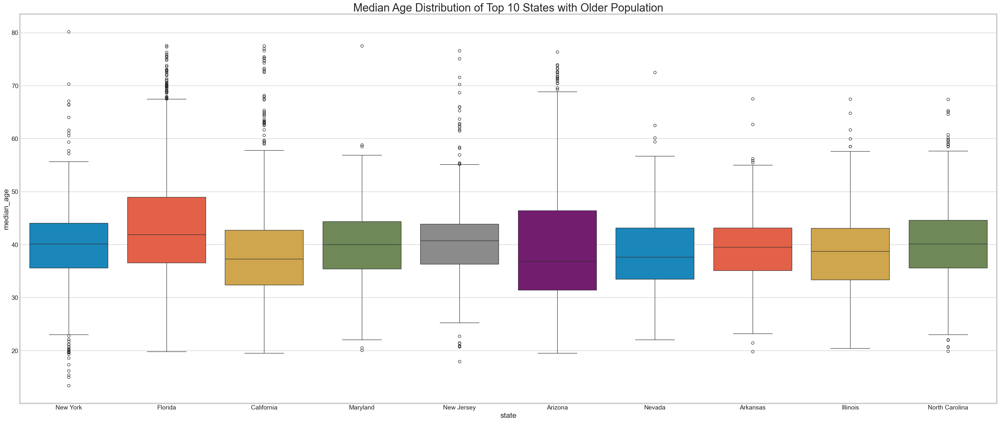

In [71]:
sns.set_style("whitegrid")
plt.figure(figsize = (35, 15))

sns.boxplot(x = 'state', y = 'median_age', data=df_pop.nlargest(26585, 'median_age'), palette=color_pal, 
            order = ['New York', 'Florida', 'California', 'Maryland', 'New Jersey', 'Arizona', 'Nevada', 
                     'Arkansas', 'Illinois', 'North Carolina']).set_title('Median Age Distribution of Top 10 States with Older Population', fontsize = 25)

plt.show()

In [72]:
print(list(df_pop.nsmallest(50, 'median_age').state.unique()))
print(len(list(df_pop.nsmallest(50, 'median_age').state.unique())))

['New York', 'New Jersey', 'Ohio', 'Virginia', 'Texas', 'Mississippi', 'Colorado', 'Oregon', 'Arizona', 'California', 'Utah', 'Pennsylvania', 'Michigan', 'Arkansas', 'Maine', 'Florida', 'North Carolina', 'Minnesota', 'Georgia', 'Connecticut', 'Maryland', 'Wisconsin', 'Louisiana', 'Massachusetts']
24


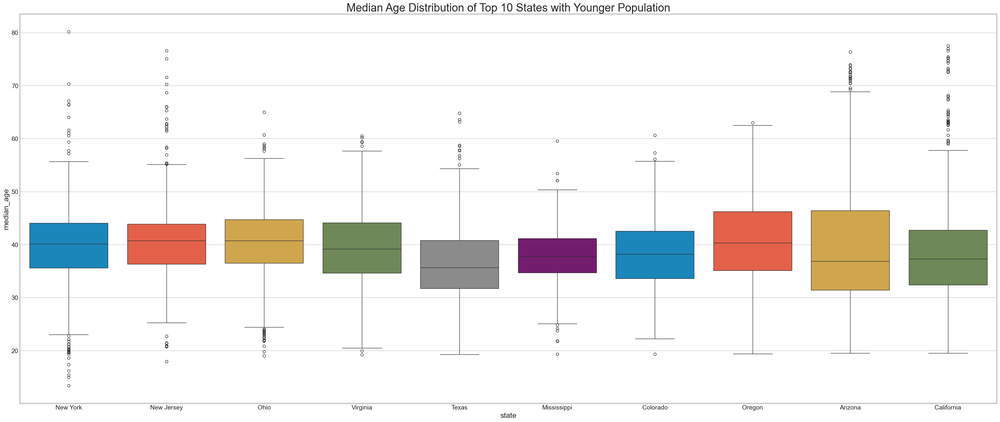

In [73]:
sns.set_style("whitegrid")
plt.figure(figsize = (35, 15))

sns.boxplot(x = 'state', y = 'median_age', data=df_pop.nsmallest(26585, 'median_age'), palette=color_pal, 
            order = ['New York', 'New Jersey', 'Ohio', 'Virginia', 'Texas', 'Mississippi', 
                     'Colorado', 'Oregon', 'Arizona', 'California']).set_title('Median Age Distribution of Top 10 States with Younger Population', fontsize = 25)

plt.show()

In [74]:
print(list(df_pop[df_pop['state'] == 'New York'].nlargest(100, 'median_age').city.unique()))
print(len(list(df_pop[df_pop['state'] == 'New York'].nlargest(100, 'median_age').city.unique())))

['Bellerose', 'Ridge', 'Somers', 'Bronx', 'Yorktown Heights', 'Johnson City', 'Brooklyn', 'Williamsville', 'Fishers Island', 'Lake George', 'Chestertown', 'Rhinebeck', 'Southampton', 'Richmond Hill', 'Mount Vernon', 'Jamaica', 'Long Lake', 'Melville', 'Amityville', 'East Rochester', 'Rome', 'Calverton', 'Woodstock', 'White Plains', 'Craryville', 'Rochester', 'Youngstown', 'Sag Harbor', 'Valatie', 'Yonkers', 'Hammondsport', 'Utica', 'Middle Island', 'New York', 'Staten Island', 'Caroga Lake', 'Willsboro', 'Margaretville', 'Canandaigua', 'Bayside', 'Elma', 'Cambria Heights', 'Depew', 'Ellicottville', 'Endwell', 'Syosset', 'Grahamsville', 'Hurley', 'Honeoye', 'Great Neck', 'Greenfield Center', 'Hollis', 'Nedrow', 'Pawling', 'Webster', 'Jeffersonville', 'North Tonawanda', 'Amsterdam', 'Rushville', 'Delmar', 'Hamburg', 'Bemus Point', 'Orchard Park', 'Flushing', 'Long Island City', 'North Salem', 'Fairport', 'Ossining', 'Kingston', 'Port Washington', 'Mattituck', 'Scotia', 'Lake Katrine', 'H

- Hence the top 10 Cities in 'New York' state as per median age in decreasing order is: 'Bellerose', 'Ridge', 'Somers', 'Bronx', 'Yorktown Heights', 'Johnson City', 'Brooklyn', 'Williamsville', 'Fishers Island', 'Lake George'.

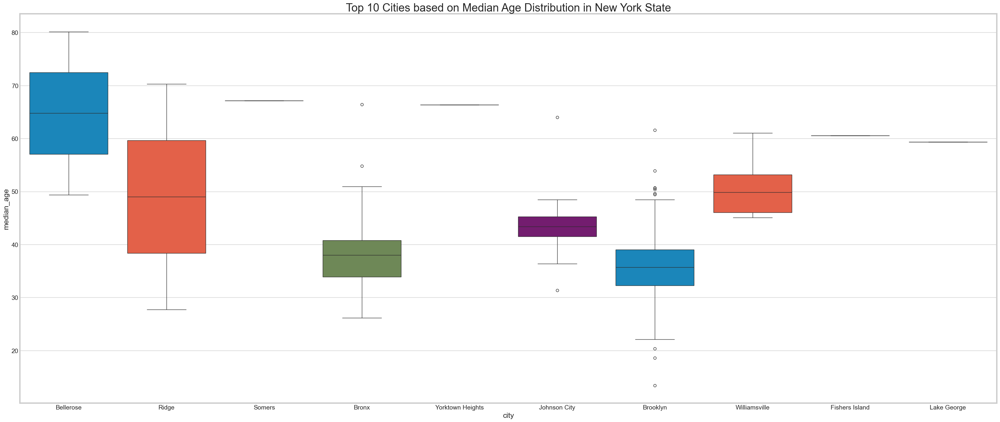

In [75]:
sns.set_style("whitegrid")
plt.figure(figsize = (35, 15))

sns.boxplot(x = 'city', y = 'median_age', data=df_pop.nlargest(26585, 'median_age'), palette=color_pal, 
            order = ['Bellerose', 'Ridge', 'Somers', 'Bronx', 'Yorktown Heights', 'Johnson City', 'Brooklyn', 
                     'Williamsville', 'Fishers Island', 'Lake George']).set_title('Top 10 Cities based on Median Age Distribution in New York State', fontsize = 25)

plt.show()

In [76]:
print(list(df_pop[df_pop['state'] == 'Mississippi'].nlargest(100, 'median_age').city.unique()))
print(len(list(df_pop[df_pop['state'] == 'Mississippi'].nlargest(100, 'median_age').city.unique())))

['Long Beach', 'Natchez', 'Bay St Louis', 'Ocean Springs', 'Jackson', 'Flowood', 'Camden', 'Pearl', 'Liberty', 'Moss Point', 'Decatur', 'Belzoni', 'Sallis', 'Biloxi', 'Vicksburg', 'Clinton', 'Holly Springs', 'Louisville', 'Carthage', 'Collinsville', 'Coffeeville', 'Crystal Springs', 'Wesson', 'Greenville', 'Prentiss', 'Ridgeland', 'Heidelberg', 'Hattiesburg', 'Meridian', 'Calhoun City', 'North Carrollton', 'Poplarville', 'Utica', 'Dekalb', 'Brookhaven', 'Tylertown', 'Guntown', 'Pope', 'Marietta', 'Gulfport', 'Aberdeen', 'Laurel', 'Columbus', 'Madison', 'Brandon', 'Hernando', 'Woodville', 'Bay St. Louis', 'Corinth', 'Foxworth', 'Eupora', 'Mccool', 'Inverness', 'Pontotoc', 'Glen', 'Weir', 'Pinola', 'Okolona', 'Florence', 'Newton', 'Macon', 'Maben', 'Canton', 'Purvis', 'Ellisville', 'Bay Springs', 'Water Valley', 'Mantachie', 'Cedar Bluff', 'Wiggins', 'Ashland', 'Grenada', 'Bolton', 'Pascagoula', 'Waynesboro', 'Pelahatchie', 'Hurley', 'Magnolia', 'Petal', 'Whitfield', 'Diberville', 'Quitm

- Hence the top 10 Cities in 'Mississippi' state as per median age in decreasing order is: 'Long Beach', 'Natchez', 'Bay St Louis', 'Ocean Springs', 'Jackson', 'Flowood', 'Camden', 'Pearl', 'Liberty', 'Moss Point'.

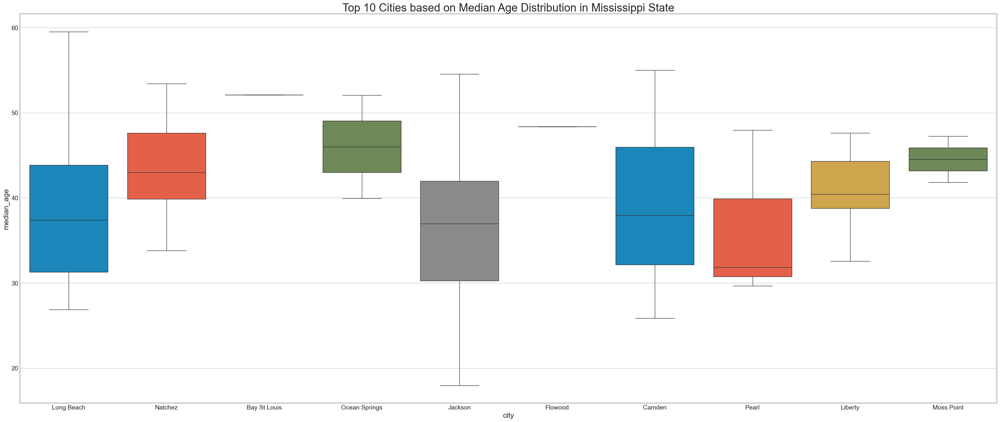

In [77]:
sns.set_style("whitegrid")
plt.figure(figsize = (35, 15))

sns.boxplot(x = 'city', y = 'median_age', data=df_pop.nlargest(26585, 'median_age'), palette=color_pal, 
            order = ['Long Beach', 'Natchez', 'Bay St Louis', 'Ocean Springs', 'Jackson', 
                     'Flowood', 'Camden', 'Pearl', 'Liberty', 'Moss Point']).set_title('Top 10 Cities based on Median Age Distribution in Mississippi State', fontsize = 25)

plt.show()

## Creating bins for population into a new variable by selecting appropriate class interval so that the number of categories don’t exceed 5 for the ease of analysis.
### Analyzing & Visualizing married, separated and divorced population

In [78]:
married_stat_df = train_data[['state', 'city', 'place', 'pop', 'male_pop', 'female_pop', 'male_age_median', 
                        'female_age_median', 'married', 'separated', 'divorced']]
married_stat_df.head()

,state,city,place,pop,male_pop,female_pop,male_age_median,female_age_median,married,separated,divorced
0,New York,Hamilton,Hamilton,5230,2612,2618,44.00000,45.33333,0.57851,0.01240,0.08770
1,Indiana,South Bend,Roseland,2633,1349,1284,32.00000,37.58333,0.34886,0.01426,0.09030
2,Indiana,Danville,Danville,6881,3643,3238,40.83333,42.83333,0.64745,0.01607,0.10657
3,Puerto Rico,San Juan,Guaynabo,2700,1141,1559,48.91667,50.58333,0.47257,0.02021,0.10106
4,Kansas,Manhattan,Manhattan City,5637,2586,3051,22.41667,21.58333,0.12356,0.00000,0.03109


In [79]:
married_stat_df.shape

(26585, 11)

In [80]:
married_stat_df.male_age_median.unique()

array([44.     , 32.     , 40.83333, 48.91667, 22.41667, 41.41667,
       40.     , 53.08333, 30.66667, 47.33333, 34.33333, 46.91667,
       49.75   , 34.66667, 42.58333, 45.83333, 44.16667, 32.5    ,
       30.41667, 27.41667, 30.08333, 41.16667, 38.75   , 30.     ,
       31.16667, 46.75   , 36.66667, 38.16667, 34.91667, 40.16667,
       27.66667, 39.33333, 42.83333, 36.41667, 41.91667, 44.5    ,
       51.75   , 43.41667, 51.66667, 34.     , 64.08333, 51.41667,
       20.25   , 29.     , 28.     , 41.25   , 49.83333, 24.91667,
       45.41667, 28.16667, 34.08333, 36.91667, 46.66667, 36.16667,
       36.75   , 38.5    , 36.08333, 47.5    , 51.16667, 48.16667,
       33.     , 25.25   , 37.08333, 42.66667, 40.25   , 29.75   ,
       38.41667, 37.41667, 42.     , 44.08333, 36.5    , 32.16667,
       35.91667, 39.5    , 37.75   , 38.58333, 21.25   , 35.33333,
       40.41667, 46.08333, 54.41667, 41.5    , 37.83333, 31.41667,
       41.75   , 32.41667, 26.66667, 39.83333, 31.91667, 34.58

- Age group defaults: Kids (0 - 12), Youth (13 - 18), Young Adult (18 - 35), Adult (36 - 55) & Senior Citizen (>= 56)

In [81]:
bins = [0, 12, 18, 35, 55, 100]
labels = ["Kids", "Youth", "Young Adult", "Adult", "Senior Citizen"]

In [82]:
#separating male & female age median into different bins as defined above
married_stat_df["male_population_bracket"] = pd.cut(married_stat_df["male_age_median"], bins, labels = labels)
married_stat_df["female_population_bracket"] = pd.cut(married_stat_df["female_age_median"], bins, labels = labels)

In [83]:
married_stat_df.head()

,state,city,place,pop,male_pop,female_pop,male_age_median,female_age_median,married,separated,divorced,male_population_bracket,female_population_bracket
0,New York,Hamilton,Hamilton,5230,2612,2618,44.00000,45.33333,0.57851,0.01240,0.08770,Adult,Adult
1,Indiana,South Bend,Roseland,2633,1349,1284,32.00000,37.58333,0.34886,0.01426,0.09030,Young Adult,Adult
2,Indiana,Danville,Danville,6881,3643,3238,40.83333,42.83333,0.64745,0.01607,0.10657,Adult,Adult
3,Puerto Rico,San Juan,Guaynabo,2700,1141,1559,48.91667,50.58333,0.47257,0.02021,0.10106,Adult,Adult
4,Kansas,Manhattan,Manhattan City,5637,2586,3051,22.41667,21.58333,0.12356,0.00000,0.03109,Young Adult,Young Adult


In [84]:
for i in married_stat_df['state'].unique():
    print(i)

New York
Indiana
Puerto Rico
Kansas
Alabama
Texas
South Carolina
California
Arkansas
Maryland
Illinois
Iowa
Tennessee
Nevada
Louisiana
Colorado
Rhode Island
Mississippi
New Jersey
Oregon
Arizona
Florida
Wisconsin
Pennsylvania
North Carolina
Virginia
Michigan
Ohio
Oklahoma
Georgia
Idaho
South Dakota
Minnesota
Missouri
Washington
Wyoming
Connecticut
West Virginia
Kentucky
Massachusetts
District of Columbia
Hawaii
Montana
Alaska
New Hampshire
Utah
Vermont
Nebraska
North Dakota
New Mexico
Maine
Delaware


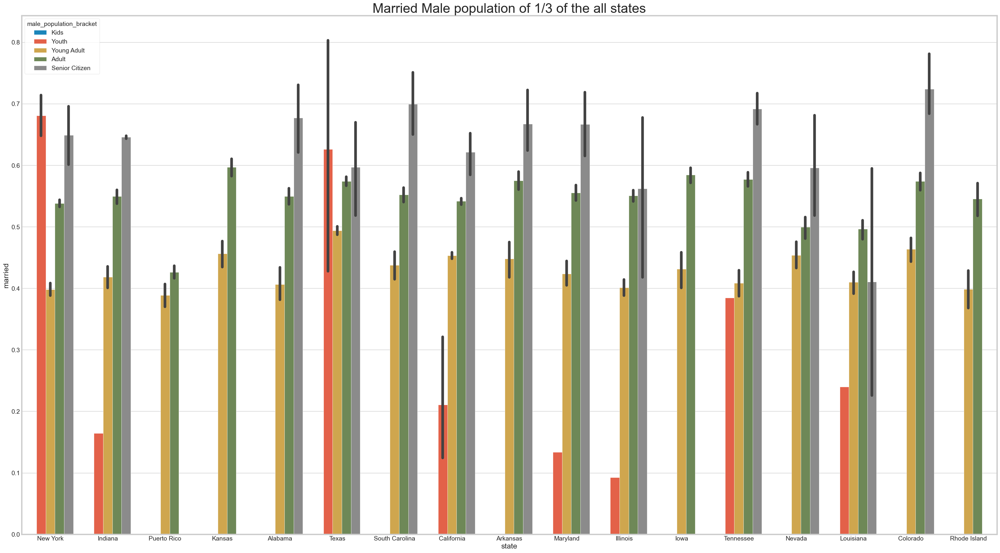

In [85]:
sns.set_style("whitegrid")
plt.figure(figsize = (35, 20))

sns.barplot(x = 'state', y = 'married', hue = 'male_population_bracket', data = married_stat_df, palette=color_pal, 
           order = ['New York', 'Indiana', 'Puerto Rico', 'Kansas', 'Alabama', 'Texas', 'South Carolina', 'California', 
                    'Arkansas', 'Maryland', 'Illinois', 'Iowa', 'Tennessee', 'Nevada', 'Louisiana', 'Colorado', 
                    'Rhode Island']).set_title('Married Male population of 1/3 of the all states', fontsize = 30)

plt.show()

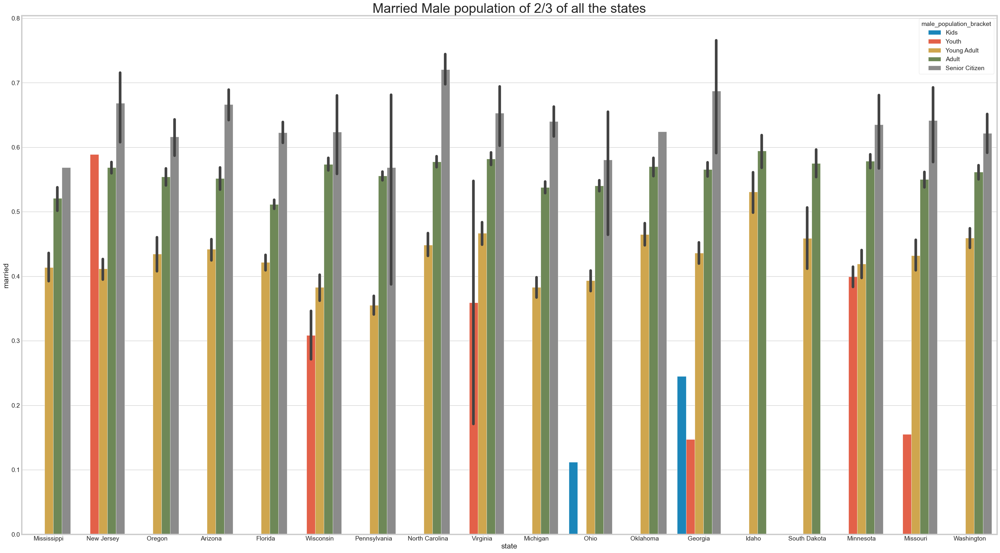

In [86]:
sns.set_style("whitegrid")
plt.figure(figsize = (35, 20))

sns.barplot(x = 'state', y = 'married', hue = 'male_population_bracket', data = married_stat_df, palette=color_pal, 
           order = ['Mississippi', 'New Jersey', 'Oregon', 'Arizona', 'Florida', 'Wisconsin', 'Pennsylvania', 'North Carolina', 
                    'Virginia', 'Michigan', 'Ohio', 'Oklahoma', 'Georgia', 'Idaho', 'South Dakota', 'Minnesota', 'Missouri', 
                    'Washington']).set_title('Married Male population of 2/3 of all the states', fontsize = 30)

plt.show()

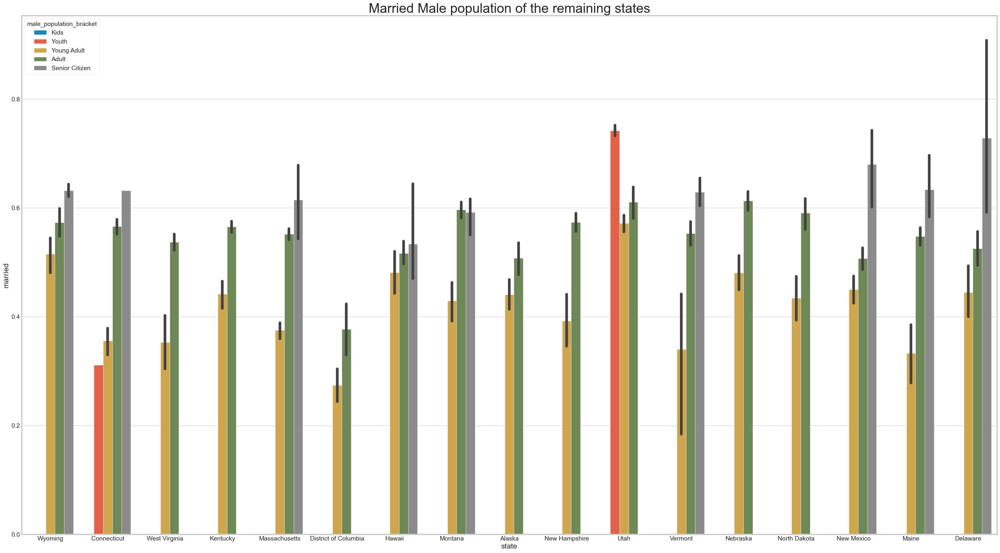

In [87]:
sns.set_style("whitegrid")
plt.figure(figsize = (35, 20))

sns.barplot(x = 'state', y = 'married', hue = 'male_population_bracket', data = married_stat_df, palette=color_pal, 
           order = ['Wyoming', 'Connecticut', 'West Virginia', 'Kentucky', 'Massachusetts', 'District of Columbia', 
                    'Hawaii', 'Montana', 'Alaska', 'New Hampshire', 'Utah', 'Vermont', 'Nebraska', 'North Dakota', 
                    'New Mexico', 'Maine', 'Delaware']).set_title('Married Male population of the remaining states', fontsize = 30)

plt.show()

- We can see from the above 3 plots that Ohio & Georgia states have married male Kids which is quite surprising.
- New York state has the highest married Youth among all the states.

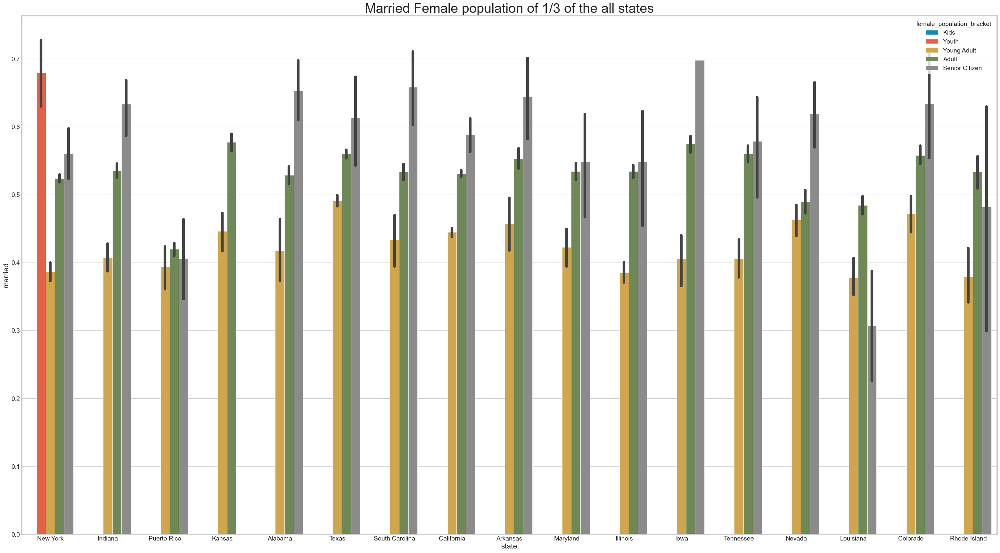

In [88]:
sns.set_style("whitegrid")
plt.figure(figsize = (35, 20))

sns.barplot(x = 'state', y = 'married', hue = 'female_population_bracket', data = married_stat_df, palette=color_pal, 
           order = ['New York', 'Indiana', 'Puerto Rico', 'Kansas', 'Alabama', 'Texas', 'South Carolina', 'California', 
                    'Arkansas', 'Maryland', 'Illinois', 'Iowa', 'Tennessee', 'Nevada', 'Louisiana', 'Colorado', 
                    'Rhode Island']).set_title('Married Female population of 1/3 of the all states', fontsize = 30)

plt.show()

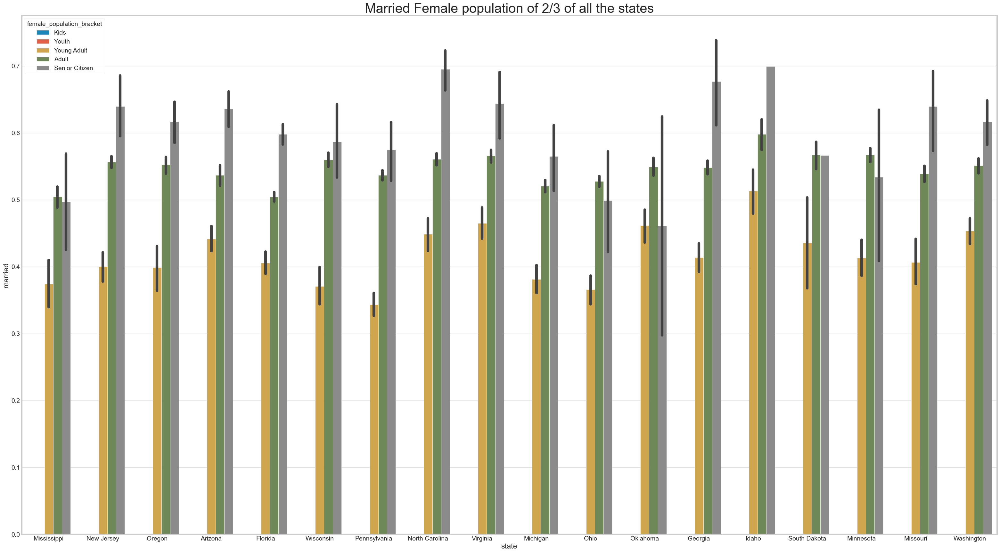

In [89]:
sns.set_style("whitegrid")
plt.figure(figsize = (35, 20))

sns.barplot(x = 'state', y = 'married', hue = 'female_population_bracket', data = married_stat_df, palette=color_pal, 
           order = ['Mississippi', 'New Jersey', 'Oregon', 'Arizona', 'Florida', 'Wisconsin', 'Pennsylvania', 'North Carolina', 
                    'Virginia', 'Michigan', 'Ohio', 'Oklahoma', 'Georgia', 'Idaho', 'South Dakota', 'Minnesota', 'Missouri', 
                    'Washington']).set_title('Married Female population of 2/3 of all the states', fontsize = 30)

plt.show()

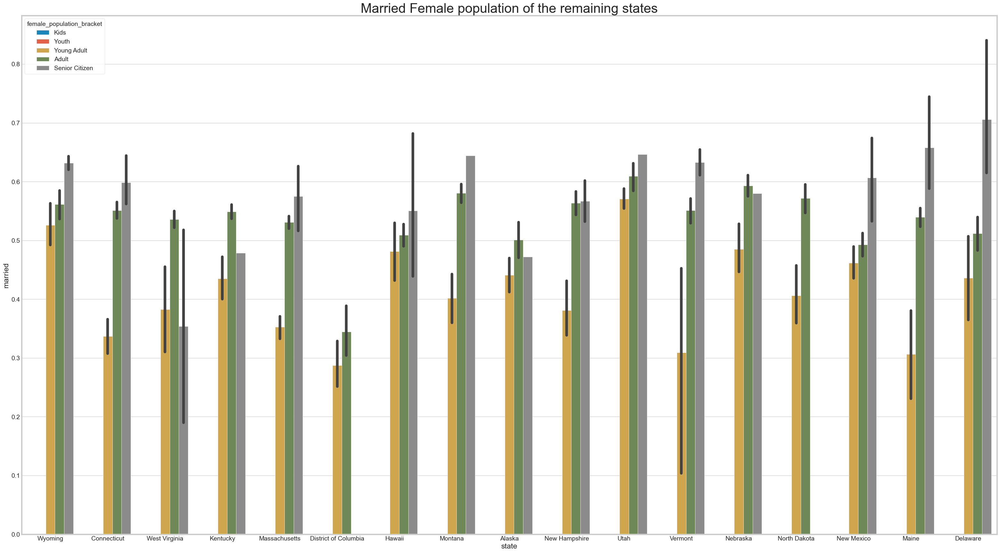

In [90]:
sns.set_style("whitegrid")
plt.figure(figsize = (35, 20))

sns.barplot(x = 'state', y = 'married', hue = 'female_population_bracket', data = married_stat_df, palette=color_pal, 
           order = ['Wyoming', 'Connecticut', 'West Virginia', 'Kentucky', 'Massachusetts', 'District of Columbia', 
                    'Hawaii', 'Montana', 'Alaska', 'New Hampshire', 'Utah', 'Vermont', 'Nebraska', 'North Dakota', 
                    'New Mexico', 'Maine', 'Delaware']).set_title('Married Female population of the remaining states', fontsize = 30)

plt.show()

- New York state is the only state having married Female Youth, while in case of male population there are multiple states having married male Youth. That means either the female partners of those males are dead and these males are considered as Married as there is no column for widower population or the female partners are non resident of USA and they are staying outside USA when this data was collected.
- Similarly Ohio & Gorgia states are having married male kids with no married female kids population.

## Separated Population Analysis of all states

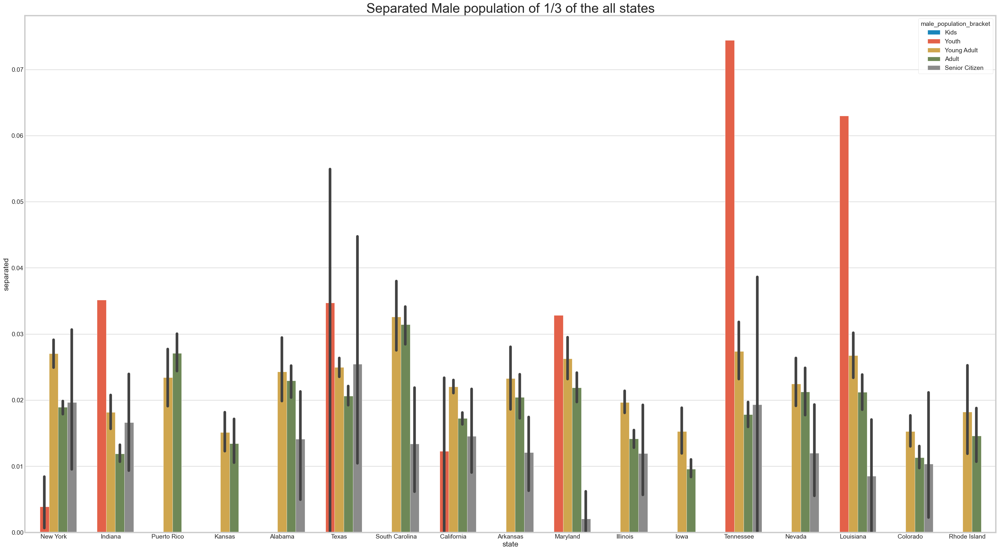

In [91]:
sns.set_style("whitegrid")
plt.figure(figsize = (35, 20))

sns.barplot(x = 'state', y = 'separated', hue = 'male_population_bracket', data = married_stat_df, palette=color_pal, 
           order = ['New York', 'Indiana', 'Puerto Rico', 'Kansas', 'Alabama', 'Texas', 'South Carolina', 'California', 
                    'Arkansas', 'Maryland', 'Illinois', 'Iowa', 'Tennessee', 'Nevada', 'Louisiana', 'Colorado', 
                    'Rhode Island']).set_title('Separated Male population of 1/3 of the all states', fontsize = 30)

plt.show()

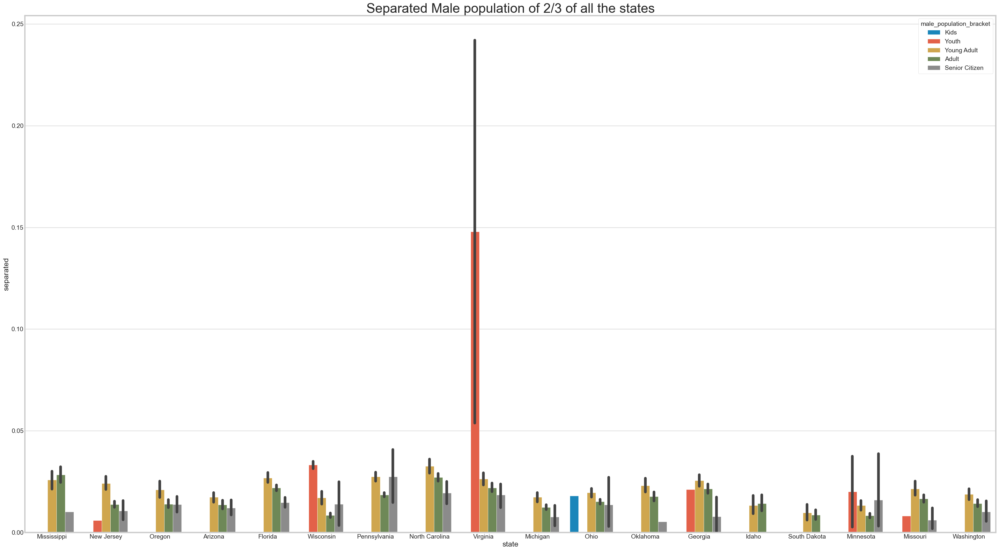

In [92]:
sns.set_style("whitegrid")
plt.figure(figsize = (35, 20))

sns.barplot(x = 'state', y = 'separated', hue = 'male_population_bracket', data = married_stat_df, palette=color_pal, 
           order = ['Mississippi', 'New Jersey', 'Oregon', 'Arizona', 'Florida', 'Wisconsin', 'Pennsylvania', 'North Carolina', 
                    'Virginia', 'Michigan', 'Ohio', 'Oklahoma', 'Georgia', 'Idaho', 'South Dakota', 'Minnesota', 'Missouri', 
                    'Washington']).set_title('Separated Male population of 2/3 of all the states', fontsize = 30)

plt.show()

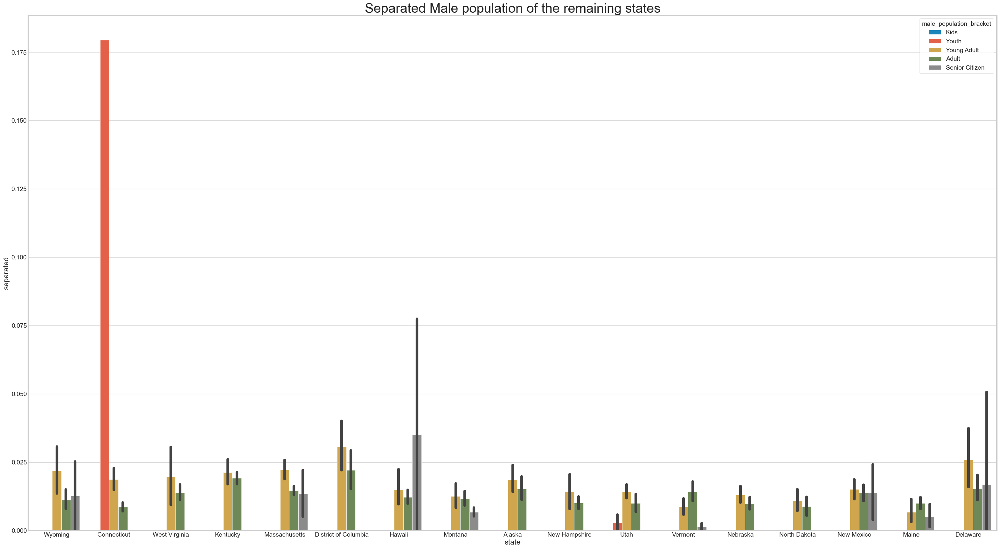

In [93]:
sns.set_style("whitegrid")
plt.figure(figsize = (35, 20))

sns.barplot(x = 'state', y = 'separated', hue = 'male_population_bracket', data = married_stat_df, palette=color_pal, 
           order = ['Wyoming', 'Connecticut', 'West Virginia', 'Kentucky', 'Massachusetts', 'District of Columbia', 
                    'Hawaii', 'Montana', 'Alaska', 'New Hampshire', 'Utah', 'Vermont', 'Nebraska', 'North Dakota', 
                    'New Mexico', 'Maine', 'Delaware']).set_title('Separated Male population of the remaining states', fontsize = 30)

plt.show()

- Ohio state has separated male Kids Population!
- Connecticut state has the highest separated male Youth population.

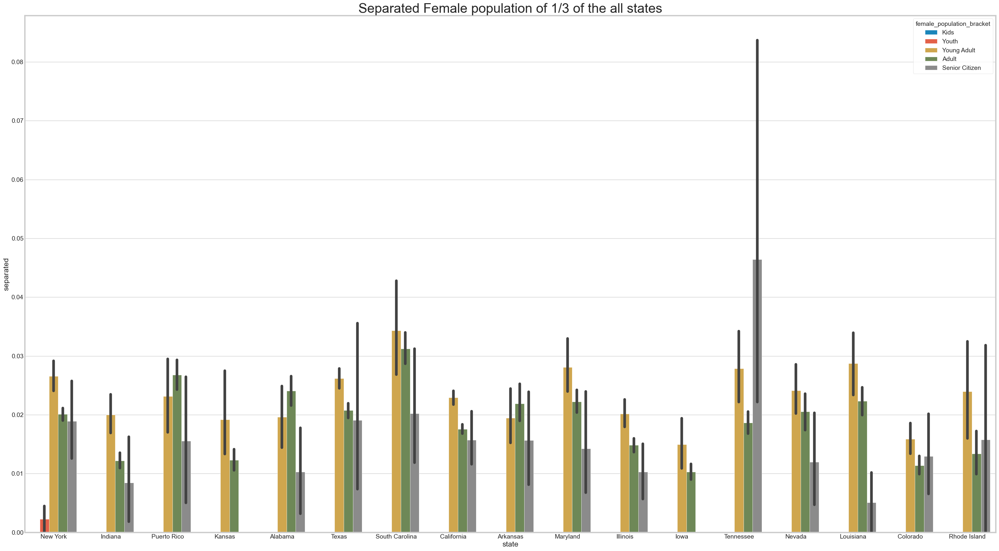

In [94]:
sns.set_style("whitegrid")
plt.figure(figsize = (35, 20))

sns.barplot(x = 'state', y = 'separated', hue = 'female_population_bracket', data = married_stat_df, palette=color_pal, 
           order = ['New York', 'Indiana', 'Puerto Rico', 'Kansas', 'Alabama', 'Texas', 'South Carolina', 'California', 
                    'Arkansas', 'Maryland', 'Illinois', 'Iowa', 'Tennessee', 'Nevada', 'Louisiana', 'Colorado', 
                    'Rhode Island']).set_title('Separated Female population of 1/3 of the all states', fontsize = 30)

plt.show()

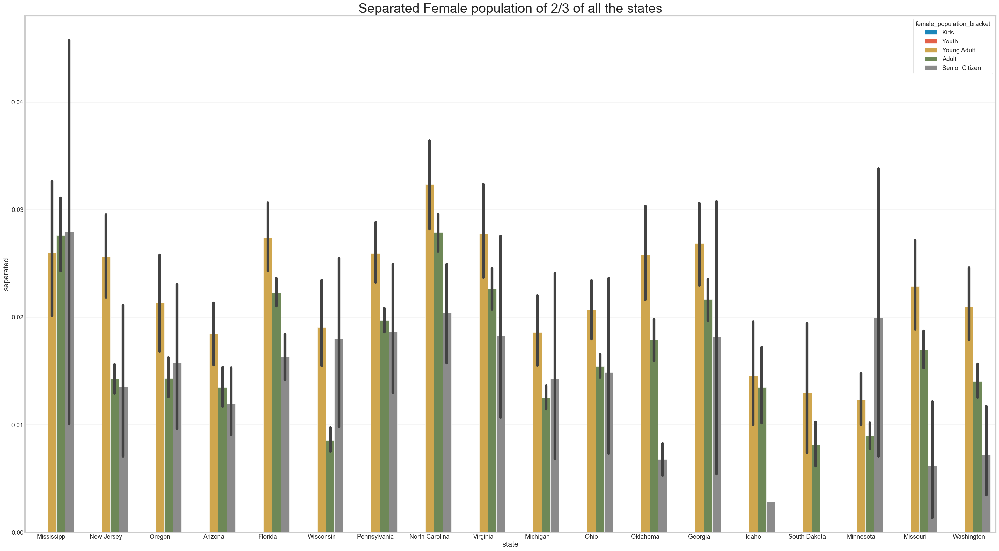

In [95]:
sns.set_style("whitegrid")
plt.figure(figsize = (35, 20))

sns.barplot(x = 'state', y = 'separated', hue = 'female_population_bracket', data = married_stat_df, palette=color_pal, 
           order = ['Mississippi', 'New Jersey', 'Oregon', 'Arizona', 'Florida', 'Wisconsin', 'Pennsylvania', 'North Carolina', 
                    'Virginia', 'Michigan', 'Ohio', 'Oklahoma', 'Georgia', 'Idaho', 'South Dakota', 'Minnesota', 'Missouri', 
                    'Washington']).set_title('Separated Female population of 2/3 of all the states', fontsize = 30)

plt.show()

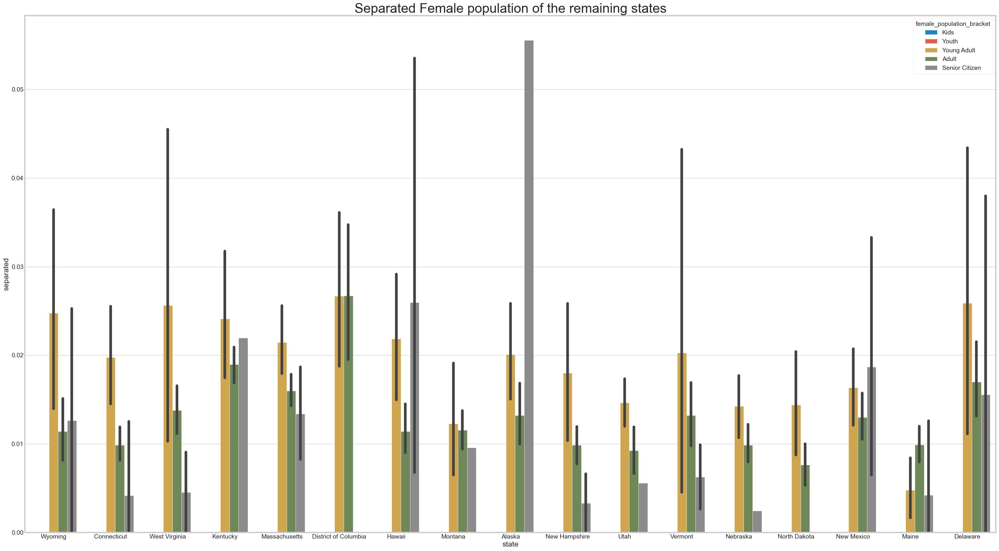

In [96]:
sns.set_style("whitegrid")
plt.figure(figsize = (35, 20))

sns.barplot(x = 'state', y = 'separated', hue = 'female_population_bracket', data = married_stat_df, palette=color_pal, 
           order = ['Wyoming', 'Connecticut', 'West Virginia', 'Kentucky', 'Massachusetts', 'District of Columbia', 
                    'Hawaii', 'Montana', 'Alaska', 'New Hampshire', 'Utah', 'Vermont', 'Nebraska', 'North Dakota', 
                    'New Mexico', 'Maine', 'Delaware']).set_title('Separated Female population of the remaining states', fontsize = 30)

plt.show()

- Except New York, no other state has separated female youth population.

## Divorced Population Analysis

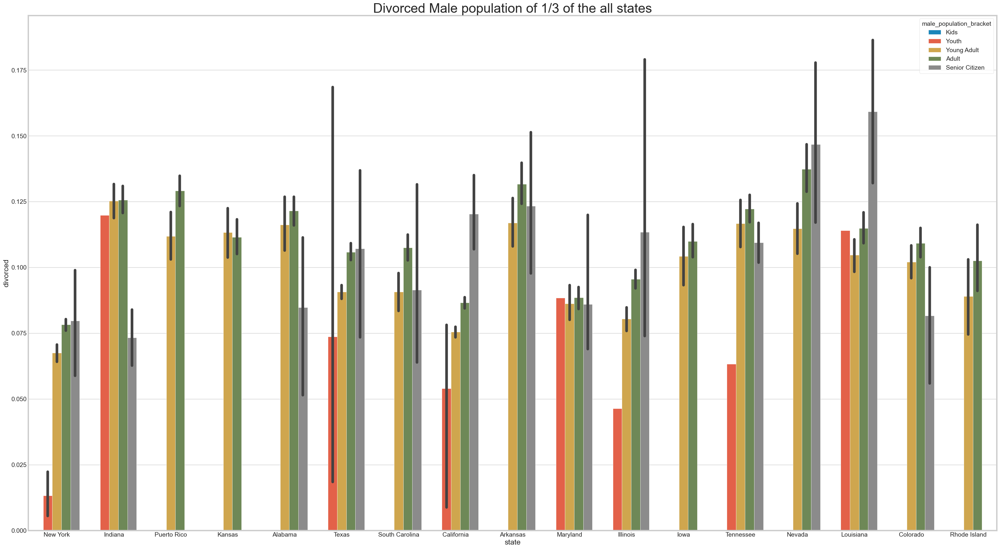

In [97]:
sns.set_style("whitegrid")
plt.figure(figsize = (35, 20))

sns.barplot(x = 'state', y = 'divorced', hue = 'male_population_bracket', data = married_stat_df, palette=color_pal, 
           order = ['New York', 'Indiana', 'Puerto Rico', 'Kansas', 'Alabama', 'Texas', 'South Carolina', 'California', 
                    'Arkansas', 'Maryland', 'Illinois', 'Iowa', 'Tennessee', 'Nevada', 'Louisiana', 'Colorado', 
                    'Rhode Island']).set_title('Divorced Male population of 1/3 of the all states', fontsize = 30)

plt.show()

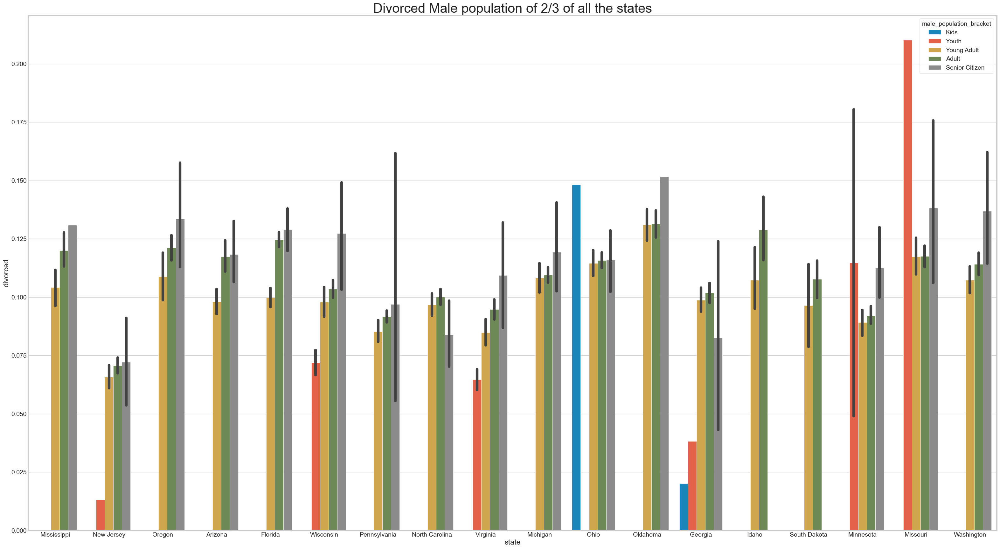

In [98]:
sns.set_style("whitegrid")
plt.figure(figsize = (35, 20))

sns.barplot(x = 'state', y = 'divorced', hue = 'male_population_bracket', data = married_stat_df, palette=color_pal, 
           order = ['Mississippi', 'New Jersey', 'Oregon', 'Arizona', 'Florida', 'Wisconsin', 'Pennsylvania', 'North Carolina', 
                    'Virginia', 'Michigan', 'Ohio', 'Oklahoma', 'Georgia', 'Idaho', 'South Dakota', 'Minnesota', 'Missouri', 
                    'Washington']).set_title('Divorced Male population of 2/3 of all the states', fontsize = 30)

plt.show()

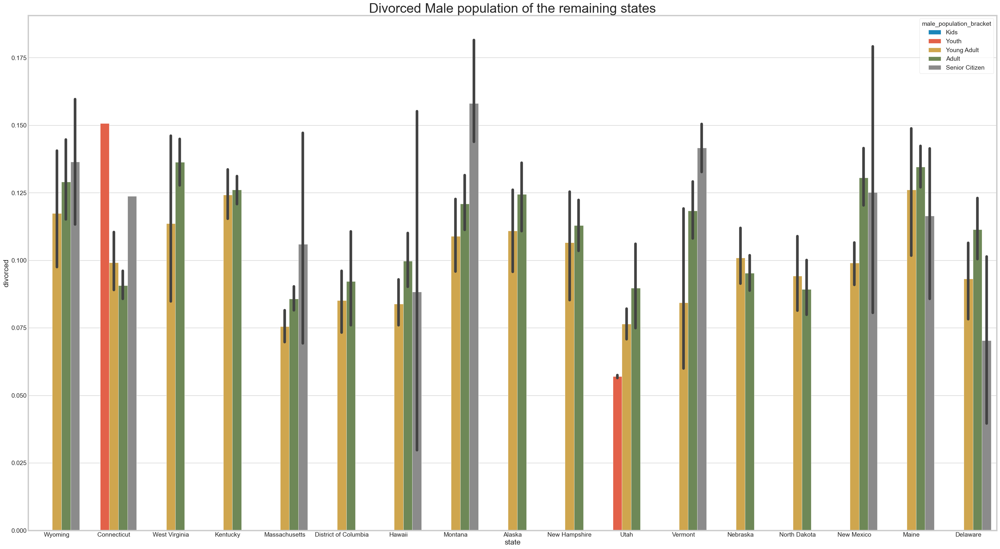

In [99]:
sns.set_style("whitegrid")
plt.figure(figsize = (35, 20))

sns.barplot(x = 'state', y = 'divorced', hue = 'male_population_bracket', data = married_stat_df, palette=color_pal, 
           order = ['Wyoming', 'Connecticut', 'West Virginia', 'Kentucky', 'Massachusetts', 'District of Columbia', 
                    'Hawaii', 'Montana', 'Alaska', 'New Hampshire', 'Utah', 'Vermont', 'Nebraska', 'North Dakota', 
                    'New Mexico', 'Maine', 'Delaware']).set_title('Divorced Male population of the remaining states', fontsize = 30)

plt.show()

- Ohio, Georgia states are having divorced male kids population!!
- Connecticut has highest number of Divorced male youth.

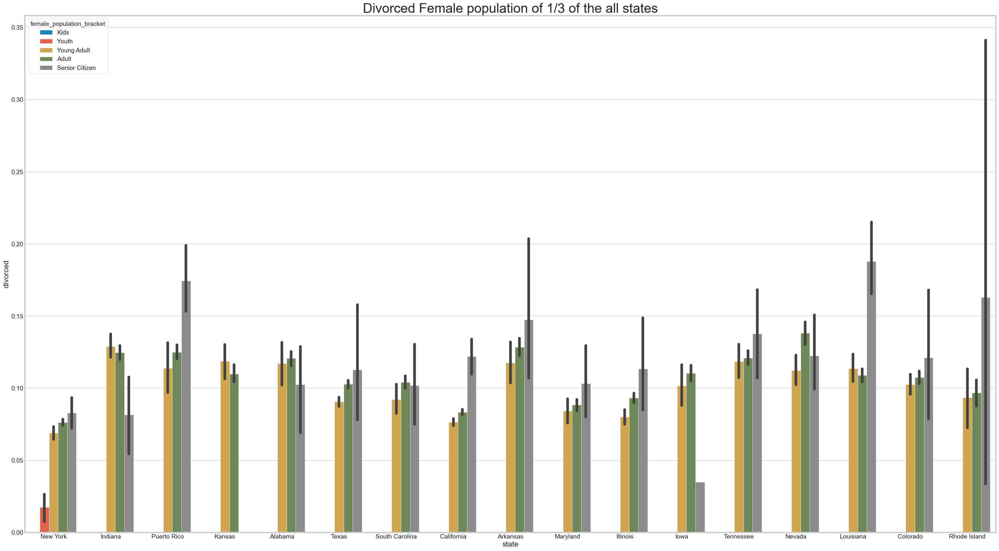

In [100]:
sns.set_style("whitegrid")
plt.figure(figsize = (35, 20))

sns.barplot(x = 'state', y = 'divorced', hue = 'female_population_bracket', data = married_stat_df, palette=color_pal, 
           order = ['New York', 'Indiana', 'Puerto Rico', 'Kansas', 'Alabama', 'Texas', 'South Carolina', 'California', 
                    'Arkansas', 'Maryland', 'Illinois', 'Iowa', 'Tennessee', 'Nevada', 'Louisiana', 'Colorado', 
                    'Rhode Island']).set_title('Divorced Female population of 1/3 of the all states', fontsize = 30)

plt.show()

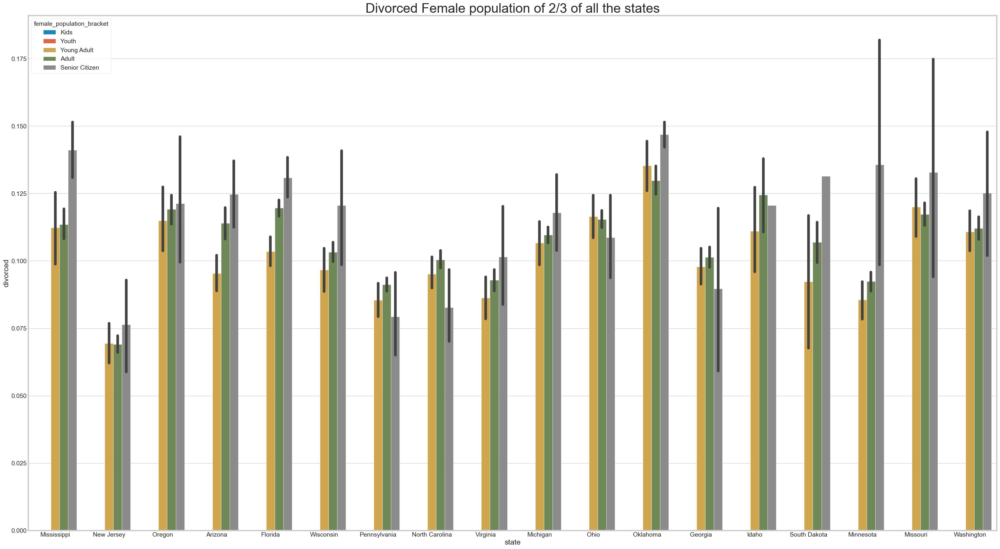

In [101]:
sns.set_style("whitegrid")
plt.figure(figsize = (35, 20))

sns.barplot(x = 'state', y = 'divorced', hue = 'female_population_bracket', data = married_stat_df, palette=color_pal, 
           order = ['Mississippi', 'New Jersey', 'Oregon', 'Arizona', 'Florida', 'Wisconsin', 'Pennsylvania', 'North Carolina', 
                    'Virginia', 'Michigan', 'Ohio', 'Oklahoma', 'Georgia', 'Idaho', 'South Dakota', 'Minnesota', 'Missouri', 
                    'Washington']).set_title('Divorced Female population of 2/3 of all the states', fontsize = 30)

plt.show()

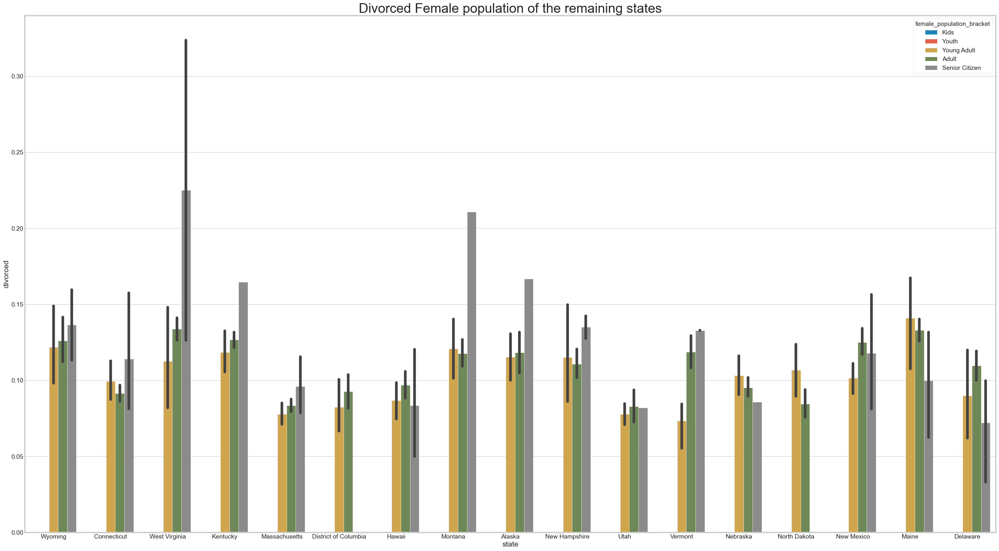

In [102]:
sns.set_style("whitegrid")
plt.figure(figsize = (35, 20))

sns.barplot(x = 'state', y = 'divorced', hue = 'female_population_bracket', data = married_stat_df, palette=color_pal, 
           order = ['Wyoming', 'Connecticut', 'West Virginia', 'Kentucky', 'Massachusetts', 'District of Columbia', 
                    'Hawaii', 'Montana', 'Alaska', 'New Hampshire', 'Utah', 'Vermont', 'Nebraska', 'North Dakota', 
                    'New Mexico', 'Maine', 'Delaware']).set_title('Divorced Female population of the remaining states', fontsize = 30)

plt.show()

- New York is the only state having Divorced female Youth.
- Maine state has the highest number of Divorced female young adults.

## Rent as a percentage of income at an overall level and for different states

In [103]:
rent = train_data[['state', 'city', 'rent_median', 'hi_median', 'family_median']]
rent.head()

,state,city,rent_median,hi_median,family_median
0,New York,Hamilton,784.0,48120.0,53245.0
1,Indiana,South Bend,848.0,35186.0,43023.0
2,Indiana,Danville,703.0,74964.0,85395.0
3,Puerto Rico,San Juan,782.0,37845.0,44399.0
4,Kansas,Manhattan,881.0,22497.0,50272.0


In [104]:
#overall rent as a percentage of overall household income
Overall_rent_percentage = (rent['rent_median'].sum() / rent['hi_median'].sum()) * 100
round(Overall_rent_percentage, 2)

np.float64(1.74)

- Overall rent as a percentage of overall household income is around 1.74%.

In [105]:
rent["overall_rent_percentage"] = round((rent['rent_median']/rent['hi_median'])*100, 2)
rent.head()

,state,city,rent_median,hi_median,family_median,overall_rent_percentage
0,New York,Hamilton,784.0,48120.0,53245.0,1.63
1,Indiana,South Bend,848.0,35186.0,43023.0,2.41
2,Indiana,Danville,703.0,74964.0,85395.0,0.94
3,Puerto Rico,San Juan,782.0,37845.0,44399.0,2.07
4,Kansas,Manhattan,881.0,22497.0,50272.0,3.92


In [106]:
print(list(rent.nlargest(500, 'overall_rent_percentage').state.unique()))
print(len(list(rent.nlargest(500, 'overall_rent_percentage').state.unique())))

['Georgia', 'Texas', 'California', 'New York', 'Florida', 'Washington', 'Oregon', 'Pennsylvania', 'Maryland', 'Virginia', 'Mississippi', 'Alabama', 'Michigan', 'Louisiana', 'Iowa', 'Puerto Rico', 'New Jersey', 'Illinois', 'Arizona', 'North Carolina', 'South Carolina', 'Tennessee', 'Ohio', 'Wisconsin', 'Missouri', 'Connecticut', 'Minnesota', 'Massachusetts', 'Indiana', 'Colorado', 'Kansas', 'Oklahoma', 'District of Columbia', 'New Mexico', 'Hawaii', 'Maine', 'Arkansas', 'Vermont', 'Rhode Island', 'Kentucky']
40


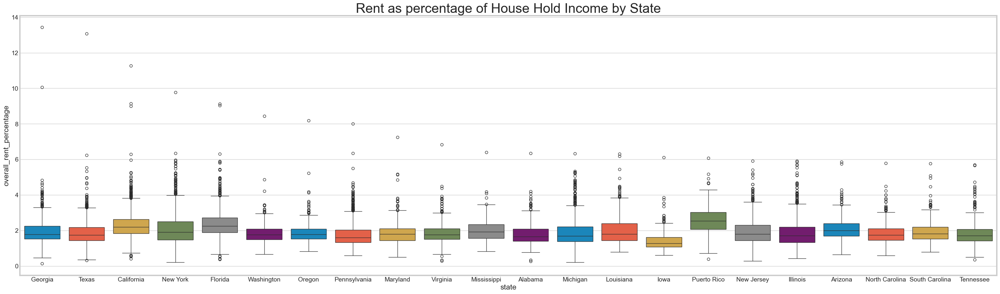

In [107]:
sns.set_style("whitegrid")
plt.figure(figsize = (35, 10))
sns.boxplot(x = 'state', y = 'overall_rent_percentage', data=rent.nlargest(26719, 'overall_rent_percentage'), palette=color_pal, 
            order = ['Georgia', 'Texas', 'California', 'New York', 'Florida', 'Washington', 'Oregon', 'Pennsylvania', 
                     'Maryland', 'Virginia', 'Mississippi', 'Alabama', 'Michigan', 'Louisiana', 'Iowa', 'Puerto Rico', 
                     'New Jersey', 'Illinois', 'Arizona', 'North Carolina', 'South Carolina', 'Tennessee']).set_title('Rent as percentage of House Hold Income by State', fontsize = 30)

plt.show()

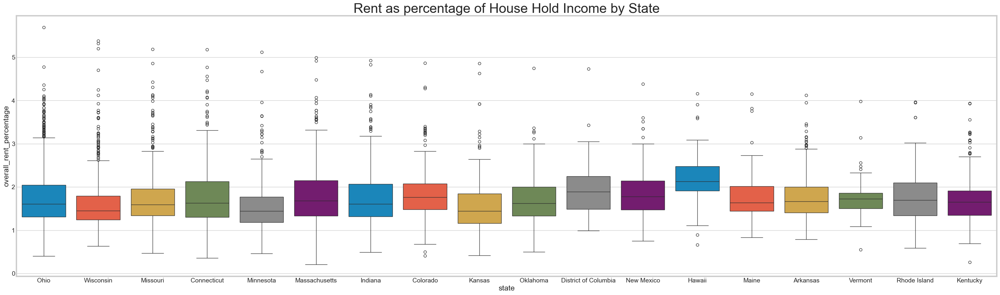

In [108]:
sns.set_style("whitegrid")
plt.figure(figsize = (35, 10))
sns.boxplot(x = 'state', y = 'overall_rent_percentage', data=rent.nlargest(26719, 'overall_rent_percentage'), palette=color_pal, 
            order = ['Ohio', 'Wisconsin', 'Missouri', 'Connecticut', 'Minnesota', 'Massachusetts', 'Indiana', 
                     'Colorado', 'Kansas', 'Oklahoma', 'District of Columbia', 'New Mexico', 'Hawaii', 'Maine', 
                     'Arkansas', 'Vermont', 'Rhode Island', 'Kentucky']).set_title('Rent as percentage of House Hold Income by State', fontsize = 30)

plt.show()

## Correlation analysis for all the relevant variables by creating heatmap

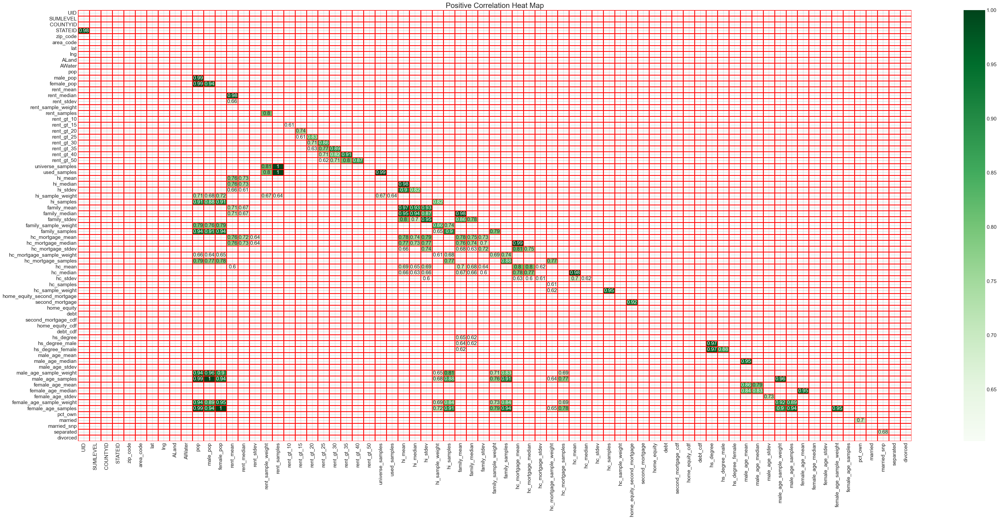

In [110]:
sns.set_style("whitegrid")

# Select only numeric columns for correlation
numeric_cols_train = train_data.select_dtypes(include=[np.number])
corr = numeric_cols_train.corr()

mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

kot = corr[corr >= .6]
plt.figure(figsize=(45, 20))
sns.heatmap(kot, cmap="Greens", annot=True, mask=mask, linewidths=1, linecolor='red').set_title('Positive Correlation Heat Map', fontsize=20)
plt.grid(True)
plt.show()

- "Population parameters" have strong positive correlation with "Sample Parameters".
- "male_pop" is highly correlated with "female_pop".
- "rent_mean", "rent_median" has high positive corelation with "hi_mean", "hi_median", "hi_stdev".
- "rent_stdev" has high positive corelation with "hc_mortgage_mean" & "hc_mortgage_median.
- "House hold income" and "Family income" are highly positively correlated.
- "Family Income" and "hc_mortgage" are positively correlated.
- "pct_own" is positively correlated with "Married" marital status. 

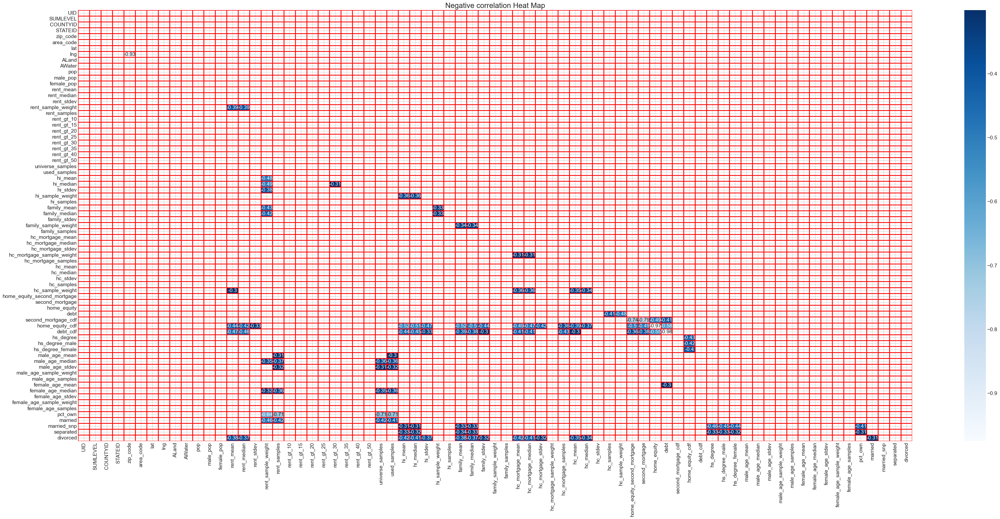

In [111]:
sns.set_style("whitegrid")

kot = corr[corr <=-.3]
plt.figure(figsize=(45,20))
sns.heatmap(kot, cmap="Blues", annot = True, mask = mask, linewidths=1, linecolor='red').set_title('Negative correlation Heat Map', fontsize = 20)
plt.grid('on', )
plt.show()

- "House hold income and Family Income" has Strong negative correlation with ["married_snp", "separated", "divorced"].
- "High School Degree in both "Males and Females" have Strong negative correlation with ["married_snp", "separated"].
- "pct_own" has Strong negative correlation with  ["married_snp", "separated"].
- "hi_median" has Strong negative correlation with "rent_gt_30", indicating that most households look for properties with rent less than 30% of their house hold income.

# 5. Data Pre-processing
1. The economic multivariate data has a significant number of measured variables. The goal is to find where the measured variables depend on a number of smaller unobserved common factors or latent variables. 
2. Each variable is assumed to be dependent upon a linear combination of the common factors, and the coefficients are known as loadings. Each measured variable also includes a component due to independent      random variability, known as “specific variance” because it is specific to one variable. Obtain the common factors and then plot the loadings. Use factor analysis to find latent variables in our dataset and gain          insight into the linear relationships in the data. Following are the list of latent variables:
- Highschool graduation rates

- Median population age

- Second mortgage statistics

- Percent own

- Bad debt expense

In [112]:
train_data['Bad_Debt'] = train_data['second_mortgage'] + train_data['home_equity'] - train_data['home_equity_second_mortgage']

In [113]:
for col in train_data.columns:
    print(col,' = ' ,train_data[col].dtype)

UID  =  int64
SUMLEVEL  =  int64
COUNTYID  =  int64
STATEID  =  int64
state  =  object
state_ab  =  object
city  =  object
place  =  object
type  =  object
primary  =  object
zip_code  =  int64
area_code  =  int64
lat  =  float64
lng  =  float64
ALand  =  float64
AWater  =  int64
pop  =  int64
male_pop  =  int64
female_pop  =  int64
rent_mean  =  float64
rent_median  =  float64
rent_stdev  =  float64
rent_sample_weight  =  float64
rent_samples  =  float64
rent_gt_10  =  float64
rent_gt_15  =  float64
rent_gt_20  =  float64
rent_gt_25  =  float64
rent_gt_30  =  float64
rent_gt_35  =  float64
rent_gt_40  =  float64
rent_gt_50  =  float64
universe_samples  =  int64
used_samples  =  int64
hi_mean  =  float64
hi_median  =  float64
hi_stdev  =  float64
hi_sample_weight  =  float64
hi_samples  =  float64
family_mean  =  float64
family_median  =  float64
family_stdev  =  float64
family_sample_weight  =  float64
family_samples  =  float64
hc_mortgage_mean  =  float64
hc_mortgage_median  =  floa

In [114]:
#function to get categorical variables
def cat_variables(df):
    cat_variables = list(df.select_dtypes(exclude = ['int', 'float']).columns)
    return cat_variables

In [115]:
#function to get numerical variables
def num_variables(df):
    num_variables = list(df.select_dtypes(include = ['int', 'float']).columns)
    return num_variables

In [116]:
cat_variables(train_data)

['state', 'state_ab', 'city', 'place', 'type', 'primary']

In [117]:
num_variables(train_data)

['UID',
 'SUMLEVEL',
 'COUNTYID',
 'STATEID',
 'zip_code',
 'area_code',
 'lat',
 'lng',
 'ALand',
 'AWater',
 'pop',
 'male_pop',
 'female_pop',
 'rent_mean',
 'rent_median',
 'rent_stdev',
 'rent_sample_weight',
 'rent_samples',
 'rent_gt_10',
 'rent_gt_15',
 'rent_gt_20',
 'rent_gt_25',
 'rent_gt_30',
 'rent_gt_35',
 'rent_gt_40',
 'rent_gt_50',
 'universe_samples',
 'used_samples',
 'hi_mean',
 'hi_median',
 'hi_stdev',
 'hi_sample_weight',
 'hi_samples',
 'family_mean',
 'family_median',
 'family_stdev',
 'family_sample_weight',
 'family_samples',
 'hc_mortgage_mean',
 'hc_mortgage_median',
 'hc_mortgage_stdev',
 'hc_mortgage_sample_weight',
 'hc_mortgage_samples',
 'hc_mean',
 'hc_median',
 'hc_stdev',
 'hc_samples',
 'hc_sample_weight',
 'home_equity_second_mortgage',
 'second_mortgage',
 'home_equity',
 'debt',
 'second_mortgage_cdf',
 'home_equity_cdf',
 'debt_cdf',
 'hs_degree',
 'hs_degree_male',
 'hs_degree_female',
 'male_age_mean',
 'male_age_median',
 'male_age_stdev',
 

In [118]:
#dataframe with numerical variables only
num_train_df = train_data[num_variables(train_data)]
num_train_df.head()

,UID,SUMLEVEL,COUNTYID,STATEID,zip_code,area_code,lat,lng,ALand,AWater,pop,male_pop,female_pop,rent_mean,rent_median,rent_stdev,rent_sample_weight,rent_samples,rent_gt_10,rent_gt_15,rent_gt_20,rent_gt_25,rent_gt_30,rent_gt_35,rent_gt_40,rent_gt_50,universe_samples,used_samples,hi_mean,hi_median,hi_stdev,hi_sample_weight,hi_samples,family_mean,family_median,family_stdev,family_sample_weight,family_samples,hc_mortgage_mean,hc_mortgage_median,hc_mortgage_stdev,hc_mortgage_sample_weight,hc_mortgage_samples,hc_mean,hc_median,hc_stdev,hc_samples,hc_sample_weight,home_equity_second_mortgage,second_mortgage,home_equity,debt,second_mortgage_cdf,home_equity_cdf,debt_cdf,hs_degree,hs_degree_male,hs_degree_female,male_age_mean,male_age_median,male_age_stdev,male_age_sample_weight,male_age_samples,female_age_mean,female_age_median,female_age_stdev,female_age_sample_weight,female_age_samples,pct_own,married,married_snp,separated,divorced,Bad_Debt
0,267822,140,53,36,13346,315,42.840812,-75.501524,202183361.0,1699120,5230,2612,2618,769.38638,784.0,232.63967,272.34441,362.0,0.86761,0.79155,0.59155,0.45634,0.42817,0.18592,0.15493,0.12958,387,355,63125.28406,48120.0,49042.01206,1290.96240,2024.0,67994.14790,53245.0,47667.30119,884.33516,1491.0,1414.80295,1223.0,641.22898,377.83135,867.0,570.01530,558.0,270.11299,770.0,499.29293,0.01588,0.02077,0.08919,0.52963,0.43658,0.49087,0.73341,0.89288,0.85880,0.92434,42.48574,44.00000,22.97306,696.42136,2612.0,44.48629,45.33333,22.51276,685.33845,2618.0,0.79046,0.57851,0.01882,0.01240,0.08770,0.09408
1,246444,140,141,18,46616,574,41.701441,-86.266614,1560828.0,100363,2633,1349,1284,804.87924,848.0,253.46747,312.58622,513.0,0.97410,0.93227,0.69920,0.69920,0.55179,0.41235,0.39044,0.27888,542,502,41931.92593,35186.0,31639.50203,838.74664,1127.0,50670.10337,43023.0,34715.57548,375.28798,554.0,864.41390,784.0,482.27020,316.88320,356.0,351.98293,336.0,125.40457,229.0,189.60606,0.02222,0.02222,0.04274,0.60855,0.42174,0.70823,0.58120,0.90487,0.86947,0.94187,34.84728,32.00000,20.37452,323.90204,1349.0,36.48391,37.58333,23.43353,267.23367,1284.0,0.52483,0.34886,0.01426,0.01426,0.09030,0.04274
2,245683,140,63,18,46122,317,39.792202,-86.515246,69561595.0,284193,6881,3643,3238,742.77365,703.0,323.39011,291.85520,378.0,0.95238,0.88624,0.79630,0.66667,0.39153,0.39153,0.28307,0.15873,459,378,84942.68317,74964.0,56811.62186,1155.20980,2488.0,95262.51431,85395.0,49292.67664,709.74925,1889.0,1506.06758,1361.0,731.89394,699.41354,1491.0,556.45986,532.0,184.42175,538.0,323.35354,0.00000,0.00000,0.09512,0.73484,1.00000,0.46332,0.28704,0.94288,0.94616,0.93952,39.38154,40.83333,22.89769,888.29730,3643.0,42.15810,42.83333,23.94119,707.01963,3238.0,0.85331,0.64745,0.02830,0.01607,0.10657,0.09512
3,279653,140,127,72,927,787,18.396103,-66.104169,1105793.0,0,2700,1141,1559,803.42018,782.0,297.39258,259.30316,368.0,0.94693,0.87151,0.69832,0.61732,0.51397,0.46927,0.35754,0.32961,438,358,48733.67116,37845.0,45100.54010,928.32193,1267.0,56401.68133,44399.0,41082.90515,490.18479,729.0,1175.28642,1101.0,428.98751,261.28471,437.0,288.04047,247.0,185.55887,392.0,314.90566,0.01086,0.01086,0.01086,0.52714,0.53057,0.82530,0.73727,0.91500,0.90755,0.92043,48.64749,48.91667,23.05968,274.98956,1141.0,47.77526,50.58333,24.32015,362.20193,1559.0,0.65037,0.47257,0.02021,0.02021,0.10106,0.01086
4,247218,140,161,20,66502,785,39.195573,-96.569366,2554403.0,0,5637,2586,3051,938.56493,881.0,392.44096,1005.42886,1704.0,0.99286,0.98247,0.91688,0.84740,0.78247,0.60974,0.55455,0.44416,1725,1540,31834.15466,22497.0,34046.50907,1548.67477,1983.0,54053.42396,50272.0,39609.12605,244.08903,395.0,1192.58759,1125.0,327.49674,76.61052,134.0,443.68855,444.0,76.12674,124.0,79.55556,0.05426,0.05426,0.05426,0.51938,0.18332,0.65545,0.74967,1.00000,1.00000,1.00000,26.07533,22.41667,11.84399,1296.89877,2586.0,24.17693,21.58333,11.10484,1854.48652,3051.0,0.13046,0.12356,0.00000,0.00000,0.03109,0.05426


In [119]:
# exclude columns you don't want
num_train_df = num_train_df[num_train_df.columns[~num_train_df.columns.isin(['SUMLEVEL', 'lat', 'lng', 'ALand'])]]

In [121]:
# Create factor analysis object and perform factor analysis
fa = FactorAnalyzer( rotation=None, n_factors = 25)
fa.fit(num_train_df)
# Check Eigenvalues
ev, v = fa.get_eigenvalues()
ev

array([ 1.58023871e+01,  1.22230406e+01,  8.32797756e+00,  4.61639261e+00,
        3.99148861e+00,  3.04818899e+00,  2.27093998e+00,  1.97920685e+00,
        1.39789293e+00,  1.27946793e+00,  1.19194529e+00,  1.13249693e+00,
        1.01628976e+00,  9.65581419e-01,  8.86558149e-01,  8.46899429e-01,
        8.16241237e-01,  7.41682930e-01,  7.19753840e-01,  5.78573147e-01,
        5.45916263e-01,  4.89272491e-01,  4.49574387e-01,  4.14899144e-01,
        3.75719927e-01,  3.46563868e-01,  3.12608091e-01,  3.04517805e-01,
        2.55007297e-01,  2.42794140e-01,  2.35786546e-01,  2.05810853e-01,
        2.00861904e-01,  1.83701905e-01,  1.70426261e-01,  1.52597300e-01,
        1.41661067e-01,  1.32745819e-01,  1.16409002e-01,  1.08357484e-01,
        9.78262584e-02,  9.38872323e-02,  9.10215578e-02,  8.93801155e-02,
        5.82867420e-02,  5.04202958e-02,  4.12727831e-02,  3.41006890e-02,
        3.24275278e-02,  2.71843077e-02,  2.26532405e-02,  2.16635138e-02,
        1.90404897e-02,  

In [122]:
print(sorted(ev, reverse=True))

[np.float64(15.802387139592248), np.float64(12.223040594995247), np.float64(8.327977562106978), np.float64(4.616392607884086), np.float64(3.9914886103034903), np.float64(3.0481889941505256), np.float64(2.2709399778003636), np.float64(1.9792068536916516), np.float64(1.3978929266983675), np.float64(1.279467926210213), np.float64(1.1919452891053441), np.float64(1.1324969312219357), np.float64(1.0162897617143125), np.float64(0.9655814194536348), np.float64(0.8865581492535193), np.float64(0.8468994293567469), np.float64(0.8162412366782469), np.float64(0.7416829298797274), np.float64(0.7197538402406062), np.float64(0.57857314723905), np.float64(0.5459162626439544), np.float64(0.4892724913396932), np.float64(0.4495743872060417), np.float64(0.41489914373151243), np.float64(0.37571992675497895), np.float64(0.34656386784858406), np.float64(0.3126080908411551), np.float64(0.30451780521812444), np.float64(0.2550072969985265), np.float64(0.24279414034645136), np.float64(0.23578654556606007), np.flo

In [123]:
loadings = fa.loadings_

In [124]:
xvals = range(1, num_train_df.shape[1]+1)

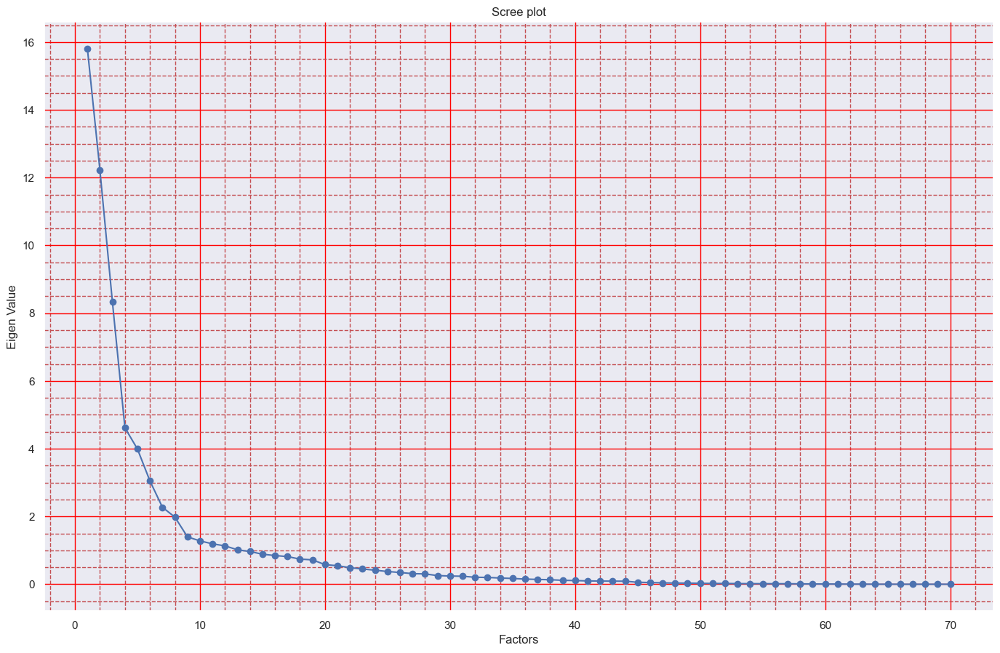

In [132]:
sns.set()
plt.figure(figsize=(15, 10))
plt.scatter(xvals, ev)
plt.plot(xvals, ev)
plt.title('Scree plot')
plt.xlabel('Factors')
plt.ylabel('Eigen Value')
plt.grid(color='red', which='both', linestyle='-')
plt.minorticks_on()
plt.grid(True, which='minor', color='r', linestyle='--')
plt.show()

In [126]:
factors  = pd.DataFrame.from_records(loadings)

factors = factors.add_prefix('Factor')

factors.index = num_train_df.columns
factors

,Factor0,Factor1,Factor2,Factor3,Factor4,Factor5,Factor6,Factor7,Factor8,Factor9,Factor10,Factor11,Factor12,Factor13,Factor14,Factor15,Factor16,Factor17,Factor18,Factor19,Factor20,Factor21,Factor22,Factor23,Factor24
UID,-0.095217,-0.009068,0.210690,-0.150495,0.126173,-0.116958,0.790462,0.431866,0.061021,0.112059,0.046565,0.056529,-0.097118,0.130072,0.034544,0.036935,-0.016986,-0.021065,-0.006902,0.026768,-0.006613,0.021632,-0.010872,0.013730,0.005215
COUNTYID,-0.116865,0.031332,0.069936,-0.062437,0.038793,-0.093914,0.171624,0.090365,0.007713,0.093137,0.057606,0.094827,0.011745,0.053960,0.063883,0.026222,0.048127,0.038343,0.003496,0.046892,-0.135162,0.163091,0.211568,0.072117,0.016953
STATEID,-0.125066,-0.008432,0.224105,-0.137120,0.125664,-0.120900,0.791258,0.441471,0.065455,0.111722,0.034696,0.037723,-0.103791,0.137439,0.026831,0.036725,-0.029278,-0.045491,-0.005864,0.000230,0.041296,-0.040297,-0.044117,-0.021142,-0.003363
zip_code,-0.029714,0.090691,-0.066001,-0.085805,-0.059384,-0.072400,-0.274474,-0.174670,-0.048394,0.076820,0.213737,0.168762,-0.041024,0.159202,0.137807,0.018155,-0.044433,0.023986,-0.022518,0.104991,0.008799,0.157860,0.021634,0.063640,0.012668
area_code,0.019505,0.016680,-0.015403,0.024515,0.002677,-0.076387,0.006730,0.061303,0.041522,0.039457,0.017626,-0.010310,0.004099,-0.004260,-0.000313,-0.052282,-0.057432,-0.046137,-0.008831,0.016062,-0.037752,0.103131,0.088208,0.034663,0.016273
AWater,-0.007866,-0.020529,0.022824,-0.018917,0.017937,-0.014705,-0.036669,-0.018618,-0.032538,0.014970,0.002399,0.009134,0.028744,0.000470,0.001015,0.000129,-0.016039,-0.001094,-0.005375,0.035412,-0.020749,0.043990,0.038916,0.013157,0.005768
pop,0.315314,0.928882,0.077734,0.042062,0.020488,-0.111439,-0.041319,0.036114,0.005535,0.007953,-0.015033,0.002147,0.000644,-0.006396,-0.006055,0.052930,-0.080669,0.037142,0.008702,0.020267,-0.001822,-0.000610,-0.011145,0.005454,-0.012764
male_pop,0.308202,0.908074,0.075589,0.023154,0.018152,-0.133428,-0.059096,0.040722,-0.004890,0.043883,-0.043866,-0.007722,0.009908,0.003144,0.010727,0.104402,-0.095123,0.054931,0.013068,0.005248,0.002849,0.102424,-0.100391,-0.014213,-0.015218
female_pop,0.313122,0.922221,0.077559,0.059265,0.022160,-0.086660,-0.022737,0.030517,0.015509,-0.027264,0.013496,0.011673,-0.008379,-0.015451,-0.022135,0.001148,-0.063627,0.018515,0.004141,0.033935,-0.006238,-0.099471,0.074574,0.023923,-0.009740
rent_mean,0.753884,-0.074707,-0.342061,0.155447,0.091077,-0.170731,-0.123958,-0.061994,0.093315,0.188325,0.130437,0.080265,-0.099996,0.209620,-0.301898,0.017519,0.054709,-0.074615,-0.011568,0.007086,-0.113221,-0.028933,-0.029048,0.025322,-0.000424


In [127]:
fa = FactorAnalyzer( rotation="varimax", n_factors = 12)
fa.fit(num_train_df)
loadings = fa.loadings_

In [128]:
factors  = pd.DataFrame.from_records(loadings)

factors = factors.add_prefix('Factor ')

factors.index = num_train_df.columns
factors

,Factor 0,Factor 1,Factor 2,Factor 3,Factor 4,Factor 5,Factor 6,Factor 7,Factor 8,Factor 9,Factor 10,Factor 11
UID,-0.072674,-0.004367,-0.016648,-0.075393,-0.023346,0.029606,-0.047829,0.966729,-0.018867,-0.029943,0.020366,0.031342
COUNTYID,-0.095171,0.014518,-0.013591,-0.019736,-0.044878,-0.032324,-0.018113,0.233261,-0.010644,-0.019683,-0.113431,-0.008627
STATEID,-0.099761,-0.004841,-0.024339,-0.068728,-0.013982,0.012957,-0.063756,0.952464,-0.034519,-0.024880,0.031241,0.030318
zip_code,-0.038589,0.058121,0.009347,-0.044817,-0.119754,-0.025425,0.096356,-0.266668,0.052966,-0.014366,-0.262844,-0.010624
area_code,0.041675,0.029351,-0.047299,0.001512,-0.016183,-0.071708,0.002894,0.047134,0.002982,0.043956,-0.019607,-0.010998
AWater,-0.003646,-0.015489,-0.013005,-0.020990,-0.004420,0.006207,-0.009601,-0.031027,-0.035028,-0.029525,-0.031981,-0.011726
pop,0.120336,0.973356,0.107021,-0.010476,-0.104723,-0.022269,0.041553,-0.012594,0.038992,0.019312,-0.001218,-0.021276
male_pop,0.117380,0.952077,0.085532,-0.024046,-0.107205,-0.041868,0.043184,-0.017272,0.030623,0.004958,-0.001505,-0.066069
female_pop,0.119033,0.961109,0.125836,0.003005,-0.098900,-0.000121,0.039023,-0.007662,0.045918,0.033427,-0.000670,0.024362
rent_mean,0.805156,0.068701,-0.114904,0.040617,-0.015035,0.046633,0.109194,-0.146131,0.206076,0.138568,-0.086749,-0.116257


In [129]:
factors_df = round(factors.loc[['hs_degree', 'hs_degree_male', 'hs_degree_female',"male_age_median", 
                                "female_age_median", "home_equity_second_mortgage", 'second_mortgage', 
                                'second_mortgage_cdf', 'pct_own', 'Bad_Debt'], :], 2)

In [130]:
def color_negative_red(value):
  """
  Colors elements in a dateframe
  green if positive and red if
  negative. Does not color NaN
  values.
  """

  if value < -0.6:
    color = 'red'
  elif value > 0.6:
    color = 'green'
  else:
    color = 'black'

  return 'color: %s' % color

In [133]:
factors_df.style.applymap(color_negative_red)

,Factor 0,Factor 1,Factor 2,Factor 3,Factor 4,Factor 5,Factor 6,Factor 7,Factor 8,Factor 9,Factor 10,Factor 11
hs_degree,0.370000,0.030000,-0.030000,-0.170000,0.240000,0.830000,0.070000,0.060000,0.150000,-0.030000,0.040000,-0.040000
hs_degree_male,0.380000,0.030000,-0.010000,-0.160000,0.220000,0.770000,0.070000,0.040000,0.150000,-0.020000,0.040000,-0.030000
hs_degree_female,0.330000,0.030000,-0.060000,-0.170000,0.250000,0.770000,0.070000,0.060000,0.130000,-0.040000,0.050000,-0.040000
male_age_median,0.170000,-0.070000,-0.230000,-0.090000,0.860000,0.120000,-0.040000,-0.020000,-0.050000,-0.050000,0.020000,0.090000
female_age_median,0.110000,-0.080000,-0.200000,-0.060000,0.860000,0.110000,-0.040000,-0.020000,-0.060000,-0.020000,0.040000,0.190000
home_equity_second_mortgage,0.040000,0.040000,0.040000,0.010000,-0.090000,-0.010000,0.920000,-0.040000,0.060000,0.030000,0.080000,-0.060000
second_mortgage,0.070000,0.030000,0.040000,0.020000,-0.080000,-0.020000,0.960000,-0.050000,0.050000,0.040000,0.060000,-0.060000
second_mortgage_cdf,-0.100000,-0.120000,0.080000,0.020000,0.010000,-0.110000,-0.780000,0.060000,-0.130000,-0.030000,-0.100000,-0.040000
pct_own,0.150000,0.200000,-0.750000,-0.150000,0.320000,0.280000,0.010000,0.060000,0.010000,-0.070000,0.030000,0.190000
Bad_Debt,0.410000,0.040000,-0.040000,-0.030000,-0.020000,0.170000,0.480000,-0.120000,0.210000,0.050000,0.660000,-0.020000


In [134]:
len(num_train_df.columns)

70

In [135]:
# Get variance of each factors
fact_variance  = fa.get_factor_variance()
fact_variance

(array([12.32969769, 11.83332189,  5.2466151 ,  4.76101083,  4.44646407,
         3.49273236,  3.34070028,  2.19990447,  2.05165854,  1.80105183,
         1.6564458 ,  1.63443837]),
 array([0.17613854, 0.16904746, 0.07495164, 0.06801444, 0.06352092,
        0.04989618, 0.04772429, 0.03142721, 0.02930941, 0.02572931,
        0.02366351, 0.02334912]),
 array([0.17613854, 0.34518599, 0.42013764, 0.48815208, 0.55167299,
        0.60156917, 0.64929346, 0.68072067, 0.71003007, 0.73575939,
        0.7594229 , 0.78277202]))

In [136]:
factor_variance  = pd.DataFrame.from_records(fact_variance)

factor_variance = factor_variance.add_prefix('Factor ')

factor_variance.index = ['SS Loadings', 'Proportion Var', 'Cumulative Var']
round(factor_variance, 2)

,Factor 0,Factor 1,Factor 2,Factor 3,Factor 4,Factor 5,Factor 6,Factor 7,Factor 8,Factor 9,Factor 10,Factor 11
SS Loadings,12.33,11.83,5.25,4.76,4.45,3.49,3.34,2.20,2.05,1.80,1.66,1.63
Proportion Var,0.18,0.17,0.07,0.07,0.06,0.05,0.05,0.03,0.03,0.03,0.02,0.02
Cumulative Var,0.18,0.35,0.42,0.49,0.55,0.60,0.65,0.68,0.71,0.74,0.76,0.78


# 6. Data Modeling
## Building a linear Regression model to predict the total monthly expenditure for home mortgages loan.
a) Run a model at a Nation level. If the accuracy levels and R square are not satisfactory proceed to below step.

b) Run another model at State level. There are 52 states in USA.

c) Keep below considerations while building a linear regression model. Data Modeling :

• Variables should have significant impact on predicting Monthly mortgage and owner costs

• Utilize all predictor variable to start with initial hypothesis

• R square of 60 percent and above should be achieved

• Ensure Multi-collinearity does not exist in dependent variables

• Test if predicted variable is normally distributed

In [137]:
train_data.shape

(26585, 80)

In [138]:
test_data.shape

(11355, 79)

In [139]:
train_data.drop('Bad_Debt', axis = 1, inplace = True)

In [140]:
train_data.shape

(26585, 79)

In [141]:
train_data[num_variables(train_data)].head(30)

,UID,SUMLEVEL,COUNTYID,STATEID,zip_code,area_code,lat,lng,ALand,AWater,pop,male_pop,female_pop,rent_mean,rent_median,rent_stdev,rent_sample_weight,rent_samples,rent_gt_10,rent_gt_15,rent_gt_20,rent_gt_25,rent_gt_30,rent_gt_35,rent_gt_40,rent_gt_50,universe_samples,used_samples,hi_mean,hi_median,hi_stdev,hi_sample_weight,hi_samples,family_mean,family_median,family_stdev,family_sample_weight,family_samples,hc_mortgage_mean,hc_mortgage_median,hc_mortgage_stdev,hc_mortgage_sample_weight,hc_mortgage_samples,hc_mean,hc_median,hc_stdev,hc_samples,hc_sample_weight,home_equity_second_mortgage,second_mortgage,home_equity,debt,second_mortgage_cdf,home_equity_cdf,debt_cdf,hs_degree,hs_degree_male,hs_degree_female,male_age_mean,male_age_median,male_age_stdev,male_age_sample_weight,male_age_samples,female_age_mean,female_age_median,female_age_stdev,female_age_sample_weight,female_age_samples,pct_own,married,married_snp,separated,divorced
0,267822,140,53,36,13346,315,42.840812,-75.501524,202183361.0,1699120,5230,2612,2618,769.38638,784.0,232.63967,272.34441,362.0,0.86761,0.79155,0.59155,0.45634,0.42817,0.18592,0.15493,0.12958,387,355,63125.28406,48120.0,49042.01206,1290.96240,2024.0,67994.14790,53245.0,47667.30119,884.33516,1491.0,1414.80295,1223.0,641.22898,377.83135,867.0,570.01530,558.0,270.11299,770.0,499.29293,0.01588,0.02077,0.08919,0.52963,0.43658,0.49087,0.73341,0.89288,0.85880,0.92434,42.48574,44.00000,22.97306,696.42136,2612.0,44.48629,45.33333,22.51276,685.33845,2618.0,0.79046,0.57851,0.01882,0.01240,0.08770
1,246444,140,141,18,46616,574,41.701441,-86.266614,1560828.0,100363,2633,1349,1284,804.87924,848.0,253.46747,312.58622,513.0,0.97410,0.93227,0.69920,0.69920,0.55179,0.41235,0.39044,0.27888,542,502,41931.92593,35186.0,31639.50203,838.74664,1127.0,50670.10337,43023.0,34715.57548,375.28798,554.0,864.41390,784.0,482.27020,316.88320,356.0,351.98293,336.0,125.40457,229.0,189.60606,0.02222,0.02222,0.04274,0.60855,0.42174,0.70823,0.58120,0.90487,0.86947,0.94187,34.84728,32.00000,20.37452,323.90204,1349.0,36.48391,37.58333,23.43353,267.23367,1284.0,0.52483,0.34886,0.01426,0.01426,0.09030
2,245683,140,63,18,46122,317,39.792202,-86.515246,69561595.0,284193,6881,3643,3238,742.77365,703.0,323.39011,291.85520,378.0,0.95238,0.88624,0.79630,0.66667,0.39153,0.39153,0.28307,0.15873,459,378,84942.68317,74964.0,56811.62186,1155.20980,2488.0,95262.51431,85395.0,49292.67664,709.74925,1889.0,1506.06758,1361.0,731.89394,699.41354,1491.0,556.45986,532.0,184.42175,538.0,323.35354,0.00000,0.00000,0.09512,0.73484,1.00000,0.46332,0.28704,0.94288,0.94616,0.93952,39.38154,40.83333,22.89769,888.29730,3643.0,42.15810,42.83333,23.94119,707.01963,3238.0,0.85331,0.64745,0.02830,0.01607,0.10657
3,279653,140,127,72,927,787,18.396103,-66.104169,1105793.0,0,2700,1141,1559,803.42018,782.0,297.39258,259.30316,368.0,0.94693,0.87151,0.69832,0.61732,0.51397,0.46927,0.35754,0.32961,438,358,48733.67116,37845.0,45100.54010,928.32193,1267.0,56401.68133,44399.0,41082.90515,490.18479,729.0,1175.28642,1101.0,428.98751,261.28471,437.0,288.04047,247.0,185.55887,392.0,314.90566,0.01086,0.01086,0.01086,0.52714,0.53057,0.82530,0.73727,0.91500,0.90755,0.92043,48.64749,48.91667,23.05968,274.98956,1141.0,47.77526,50.58333,24.32015,362.20193,1559.0,0.65037,0.47257,0.02021,0.02021,0.10106
4,247218,140,161,20,66502,785,39.195573,-96.569366,2554403.0,0,5637,2586,3051,938.56493,881.0,392.44096,1005.42886,1704.0,0.99286,0.98247,0.91688,0.84740,0.78247,0.60974,0.55455,0.44416,1725,1540,31834.15466,22497.0,34046.50907,1548.67477,1983.0,54053.42396,50272.0,39609.12605,244.08903,395.0,1192.58759,1125.0,327.49674,76.61052,134.0,443.68855,444.0,76.12674,124.0,79.55556,0.05426,0.05426,0.05426,0.51938,0.18332,0.65545,0.74967,1.00000,1.00000,1.00000,26.07533,22.41667,11.84399,1296.89877,2586.0,24.17693,21.58333,11.10484,1854.48652,3051.0,0.13046,0.12356,0.00000,0.00000,0.03109
5,221087,140,79,1,35673,256,34.519582,-87.151801,78402217.0,487343,5475,2564,2911,605.10246,684.0,230.15912,272.10405,287.0,0

In [142]:
#dropping 'SUMLEVEL' variable from train dataset
train_data.drop('SUMLEVEL', inplace = True, axis = 1)

In [143]:
train_data.shape

(26585, 78)

In [144]:
test_data.shape

(11355, 79)

In [145]:
#dropping 'SUMLEVEL' variable from test dataset
test_data.drop('SUMLEVEL', inplace = True, axis = 1)

In [146]:
#train_data[num_variables(train_data)]

In [147]:
num_2_cat = ['UID','COUNTYID', 'STATEID', 'zip_code', 'area_code', 'lat', 'lng']

In [148]:
for col in num_2_cat:
    train_data[col] = train_data[col].astype('category')
    test_data[col] = test_data[col].astype('category')

In [149]:
print(train_data[cat_variables(train_data)].head(10))

      UID COUNTYID STATEID           state state_ab                 city  \
0  267822       53      36        New York       NY             Hamilton   
1  246444      141      18         Indiana       IN           South Bend   
2  245683       63      18         Indiana       IN             Danville   
3  279653      127      72     Puerto Rico       PR             San Juan   
4  247218      161      20          Kansas       KS            Manhattan   
5  221087       79       1         Alabama       AL              Trinity   
6  286689      337      48           Texas       TX               Nocona   
7  280558       45      45  South Carolina       SC              Taylors   
8  269138       81      36        New York       NY  South Richmond Hill   
9  227164       37       6      California       CA  Rancho Palos Verdes   

                       place   type primary zip_code area_code        lat  \
0                   Hamilton   City   tract    13346       315  42.840812   
1        

In [150]:
obj_2_cat = ['state', 'state_ab', 'city', 'place', 'type', 'primary']

In [151]:
for col in obj_2_cat:
    train_data[col] = train_data[col].astype('category')
    test_data[col] = test_data[col].astype('category')

In [152]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 26585 entries, 0 to 27320
Data columns (total 78 columns):
 #   Column                       Non-Null Count  Dtype   
---  ------                       --------------  -----   
 0   UID                          26585 non-null  category
 1   COUNTYID                     26585 non-null  category
 2   STATEID                      26585 non-null  category
 3   state                        26585 non-null  category
 4   state_ab                     26585 non-null  category
 5   city                         26585 non-null  category
 6   place                        26585 non-null  category
 7   type                         26585 non-null  category
 8   primary                      26585 non-null  category
 9   zip_code                     26585 non-null  category
 10  area_code                    26585 non-null  category
 11  lat                          26585 non-null  category
 12  lng                          26585 non-null  category
 13  ALand 

In [153]:
print(train_data[['hc_mortgage_mean']].head(30))

    hc_mortgage_mean
0         1414.80295
1          864.41390
2         1506.06758
3         1175.28642
4         1192.58759
5         1137.05215
6         1339.98441
7         1891.72540
8         2941.26980
9         3306.26240
10        2785.22083
11        2860.75770
12        1191.26932
13        1895.03457
14        3196.37077
15        1152.77797
16        1755.89306
17        1205.08477
18        1427.52735
19        2974.53585
20        1297.19094
21        1445.37985
22        1208.26436
23        1384.75689
24        1533.66808
25        1090.42033
26        2055.48404
27        1652.64523
28        3221.20828
29        1386.51823


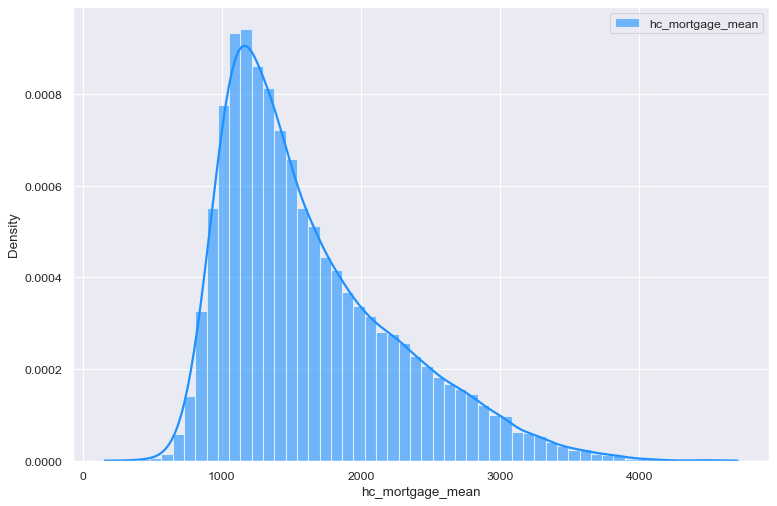

In [154]:
# Plot
kwargs = dict(hist_kws={'alpha':.6}, kde_kws={'linewidth':2})

plt.figure(figsize=(10,7), dpi= 80)
sns.distplot(train_data.hc_mortgage_mean, color="dodgerblue", label="hc_mortgage_mean", **kwargs)

plt.legend()

- Target Variable "hc_mortgage_mean" has a Positive Skew.

In [155]:
#linear regression estimator
lr = LinearRegression()

In [156]:
#Adjusted r2 = 1-(1-R2)*(n-1)/(n-p-1)
def adj_rsqrd(df, r2):
    # adjusted r2 using formula adj_r2 = 1 - (1- r2) * (n-1) / (n - k - 1)
    # k = number of predictors = data.shape[1] - 1
    adj_rsqrd = 1 - (1-r2)*(len(df) - 1) / (len(df) - (df.shape[1] - 1) - 1)
    return round(adj_rsqrd, 3)

In [157]:
cat_cols_2_drop = ['UID', 'state', 'state_ab', 'city', 'place', 'type', 'primary', 'zip_code', 'area_code', 'lat', 'lng']

In [158]:
train_data.drop(cat_cols_2_drop, axis=1, inplace=True)

In [159]:
test_data.drop(cat_cols_2_drop, axis=1, inplace=True)

In [160]:
train_data.drop(['COUNTYID', 'STATEID'], axis=1, inplace=True)

In [161]:
test_y = test_data['hc_mortgage_mean']

In [162]:
test_data.drop(['COUNTYID', 'STATEID', 'hc_mortgage_mean'], axis=1, inplace=True)

In [163]:
print(train_data.shape, test_data.shape)

(26585, 65) (11355, 64)


In [164]:
train_X = train_data.drop(columns=['hc_mortgage_mean'])
train_y = train_data['hc_mortgage_mean']

In [165]:
#model fitting
lr.fit(train_X, train_y)

LinearRegression()

In [166]:
#prediction
predict_train = lr.predict(train_X)
predict_test = lr.predict(test_data)

In [167]:
# model evaluation for testing set
mae = mean_absolute_error(test_y, predict_test)
mse = mean_squared_error(test_y, predict_test)
r2 = r2_score(test_y, predict_test)

print("The model performance for test set")
print("--------------------------------------")
print('MAE is {}'.format(round(mae, 3)))
print('MSE is {}'.format(round(mse, 3)))
print('RMSE is {}'.format(round(mse**(0.5), 3)))
print('R2 score is {}'.format(round(r2, 3)))

print('Adjusted R2 score is {}'.format(adj_rsqrd(test_data, r2)))

The model performance for test set
--------------------------------------
MAE is 43.675
MSE is 4673.486
RMSE is 68.363
R2 score is 0.988
Adjusted R2 score is 0.988


# Regression Model with all dependent numeric variables @ Country level is giving R SQUARED metric of 98.8%. So skipping state level Regression Model

In [168]:
correlated_features = set()
correlation_matrix = train_data.drop('hc_mortgage_mean', axis=1).corr()

for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > 0.8:
            colname = correlation_matrix.columns[i]
            correlated_features.add(colname)

In [169]:
correlated_features

{'debt_cdf',
 'family_mean',
 'family_median',
 'family_sample_weight',
 'family_samples',
 'family_stdev',
 'female_age_mean',
 'female_age_median',
 'female_age_sample_weight',
 'female_age_samples',
 'female_pop',
 'hc_median',
 'hc_mortgage_samples',
 'hc_sample_weight',
 'hi_median',
 'hi_samples',
 'hi_stdev',
 'home_equity_cdf',
 'hs_degree_female',
 'hs_degree_male',
 'male_age_median',
 'male_age_sample_weight',
 'male_age_samples',
 'male_pop',
 'rent_gt_25',
 'rent_gt_30',
 'rent_gt_35',
 'rent_gt_40',
 'rent_gt_50',
 'rent_median',
 'rent_samples',
 'second_mortgage',
 'universe_samples',
 'used_samples'}

In [170]:
corr_list = ['debt_cdf', 'family_mean', 'family_median', 'family_sample_weight', 'family_samples', 'family_stdev', 'female_age_mean', 
             'female_age_median','female_age_sample_weight', 'female_age_samples', 'female_pop', 'hc_median', 'hc_mortgage_samples', 
             'hc_sample_weight', 'hi_median','hi_samples', 'hi_stdev', 'home_equity_cdf', 'hs_degree_female', 'hs_degree_male', 
             'male_age_median', 'male_age_sample_weight','male_age_samples', 'male_pop', 'rent_gt_25', 'rent_gt_30', 'rent_gt_35', 
             'rent_gt_40', 'rent_gt_50', 'rent_median', 'rent_samples', 'second_mortgage', 'universe_samples', 'used_samples']

In [171]:
train_data.drop(corr_list, axis=1, inplace=True)

In [172]:
test_data.drop(corr_list, axis=1, inplace=True)

In [173]:
print(train_data.shape, test_data.shape)

(26585, 31) (11355, 30)


# Dropped MultiCollinear variables and ran the Regression Model.

In [174]:
train_data.head()

,ALand,AWater,pop,rent_mean,rent_stdev,rent_sample_weight,rent_gt_10,rent_gt_15,rent_gt_20,hi_mean,hi_sample_weight,hc_mortgage_mean,hc_mortgage_median,hc_mortgage_stdev,hc_mortgage_sample_weight,hc_mean,hc_stdev,hc_samples,home_equity_second_mortgage,home_equity,debt,second_mortgage_cdf,hs_degree,male_age_mean,male_age_stdev,female_age_stdev,pct_own,married,married_snp,separated,divorced
0,202183361.0,1699120,5230,769.38638,232.63967,272.34441,0.86761,0.79155,0.59155,63125.28406,1290.96240,1414.80295,1223.0,641.22898,377.83135,570.01530,270.11299,770.0,0.01588,0.08919,0.52963,0.43658,0.89288,42.48574,22.97306,22.51276,0.79046,0.57851,0.01882,0.01240,0.08770
1,1560828.0,100363,2633,804.87924,253.46747,312.58622,0.97410,0.93227,0.69920,41931.92593,838.74664,864.41390,784.0,482.27020,316.88320,351.98293,125.40457,229.0,0.02222,0.04274,0.60855,0.42174,0.90487,34.84728,20.37452,23.43353,0.52483,0.34886,0.01426,0.01426,0.09030
2,69561595.0,284193,6881,742.77365,323.39011,291.85520,0.95238,0.88624,0.79630,84942.68317,1155.20980,1506.06758,1361.0,731.89394,699.41354,556.45986,184.42175,538.0,0.00000,0.09512,0.73484,1.00000,0.94288,39.38154,22.89769,23.94119,0.85331,0.64745,0.02830,0.01607,0.10657
3,1105793.0,0,2700,803.42018,297.39258,259.30316,0.94693,0.87151,0.69832,48733.67116,928.32193,1175.28642,1101.0,428.98751,261.28471,288.04047,185.55887,392.0,0.01086,0.01086,0.52714,0.53057,0.91500,48.64749,23.05968,24.32015,0.65037,0.47257,0.02021,0.02021,0.10106
4,2554403.0,0,5637,938.56493,392.44096,1005.42886,0.99286,0.98247,0.91688,31834.15466,1548.67477,1192.58759,1125.0,327.49674,76.61052,443.68855,76.12674,124.0,0.05426,0.05426,0.51938,0.18332,1.00000,26.07533,11.84399,11.10484,0.13046,0.12356,0.00000,0.00000,0.03109


In [175]:
train_X = train_data.drop(columns=['hc_mortgage_mean'])
train_y = train_data['hc_mortgage_mean']

In [176]:
lr.fit(train_X, train_y)

LinearRegression()

In [177]:
predict_train = lr.predict(train_X)
predict_test = lr.predict(test_data)

In [178]:
# model evaluation for testing set

mae = mean_absolute_error(test_y, predict_test)
mse = mean_squared_error(test_y, predict_test)
r2 = r2_score(test_y, predict_test)

print("The model performance for test set")
print("--------------------------------------")
print('MAE is {}'.format(round(mae, 3)))
print('MSE is {}'.format(round(mse, 3)))
print('RMSE is {}'.format(round(mse**(0.5), 3)))
print('R2 score is {}'.format(round(r2, 3)))

print('Adjusted R2 score is {}'.format(adj_rsqrd(test_data, r2)))

The model performance for test set
--------------------------------------
MAE is 44.001
MSE is 4787.228
RMSE is 69.19
R2 score is 0.988
Adjusted R2 score is 0.988


In [179]:
sorted(SCORERS.keys())

NameError: name 'SCORERS' is not defined

# Let's Check how close our algorithm is predicting, by passing the inputs from our test set and compare them to the target values.

In [180]:
import random
randomlist = []
for i in range(0,100):
    n = random.randint(1,len(test_data))
    randomlist.append(n)
print(randomlist)

[421, 1642, 4569, 8918, 3235, 6617, 8546, 5371, 10394, 9557, 11273, 10625, 565, 6012, 10727, 363, 3833, 4016, 476, 5468, 3688, 5851, 10274, 1827, 425, 6742, 4703, 7479, 9209, 6375, 5249, 6665, 3887, 4089, 6729, 5196, 245, 7929, 381, 7532, 2306, 6675, 7625, 2784, 8581, 10452, 9054, 2615, 6019, 9360, 3652, 6034, 225, 8815, 7849, 6712, 5334, 7378, 8935, 4043, 3009, 1036, 25, 3067, 9097, 4711, 9271, 4349, 10910, 9711, 4627, 9734, 10005, 7398, 3193, 8591, 8830, 4912, 3050, 991, 9224, 3082, 4905, 3241, 10443, 3373, 3570, 6273, 6645, 7834, 5805, 9698, 965, 3484, 3776, 9771, 9010, 10692, 10466, 3632]


In [181]:
pre_out = []
out = []

for i in randomlist:
    data_in = [list(test_data.iloc[i])]
    pre_data_out = lr.predict(data_in)
    data_out = test_y .iloc[i]
    
    print(i, pre_data_out, data_out)
    
    pre_out.append(pre_data_out)
    out.append(data_out)

421 [1656.76382198] 1685.74763
1642 [1307.18353446] 1291.7009
4569 [2438.56906855] 2392.98314
8918 [1151.07662149] 1036.84535
3235 [1163.5643721] 1172.57752
6617 [1409.94766864] 1429.48853
8546 [1249.60998146] 1272.72829
5371 [1375.30620669] 1334.75091
10394 [1164.51186699] 1135.11343
9557 [1603.10593829] 1540.23687
11273 [3818.96487698] 3711.78148
10625 [2320.76747647] 2375.85876
565 [1864.67057732] 1844.81255
6012 [1310.84316472] 1352.1665
10727 [2227.46758548] 2399.24275
363 [1777.91090124] 1810.8213
3833 [1633.95387198] 1640.58462
4016 [1156.05501577] 1179.90404
476 [1415.18568634] 1381.33574
5468 [1172.13413691] 1079.94468
3688 [1482.59581089] 1442.78429
5851 [955.48148529] 1054.74246
10274 [914.01568075] 908.08984
1827 [1804.70449461] 1778.0372
425 [918.35609147] 902.38294
6742 [3697.85698329] 3373.80422
4703 [1120.70622967] 1125.83333
7479 [2439.69806016] 2412.22397
9209 [1745.62001366] 1698.72959
6375 [1648.5618367] 1641.33822
5249 [2429.89467715] 2308.73142
6665 [1285.32035465

In [182]:
print(pre_out)

[array([1656.76382198]), array([1307.18353446]), array([2438.56906855]), array([1151.07662149]), array([1163.5643721]), array([1409.94766864]), array([1249.60998146]), array([1375.30620669]), array([1164.51186699]), array([1603.10593829]), array([3818.96487698]), array([2320.76747647]), array([1864.67057732]), array([1310.84316472]), array([2227.46758548]), array([1777.91090124]), array([1633.95387198]), array([1156.05501577]), array([1415.18568634]), array([1172.13413691]), array([1482.59581089]), array([955.48148529]), array([914.01568075]), array([1804.70449461]), array([918.35609147]), array([3697.85698329]), array([1120.70622967]), array([2439.69806016]), array([1745.62001366]), array([1648.5618367]), array([2429.89467715]), array([1285.32035465]), array([1558.58699032]), array([1897.70315357]), array([1039.80398438]), array([798.60022149]), array([1055.71555614]), array([2998.86553502]), array([2078.99037118]), array([1185.76924634]), array([1327.77987028]), array([1475.41027948]

In [183]:
x = [2,3,5,9,1,0,2,3]

def my_min(sequence):
    """return the minimum element of sequence"""
    low = sequence[0] # need to start with some value
    for i in sequence:
        if i < low:
            low = i
    return low

print(my_min(x))

0


In [184]:
x = [2,3,5,9,1,0,2,3]

def my_maxi(sequence):
    """return the minimum element of sequence"""
    maxi = sequence[0] # need to start with some value
    for i in sequence:
        if i > maxi:
            maxi = i
    return maxi

print(my_maxi(x))

9


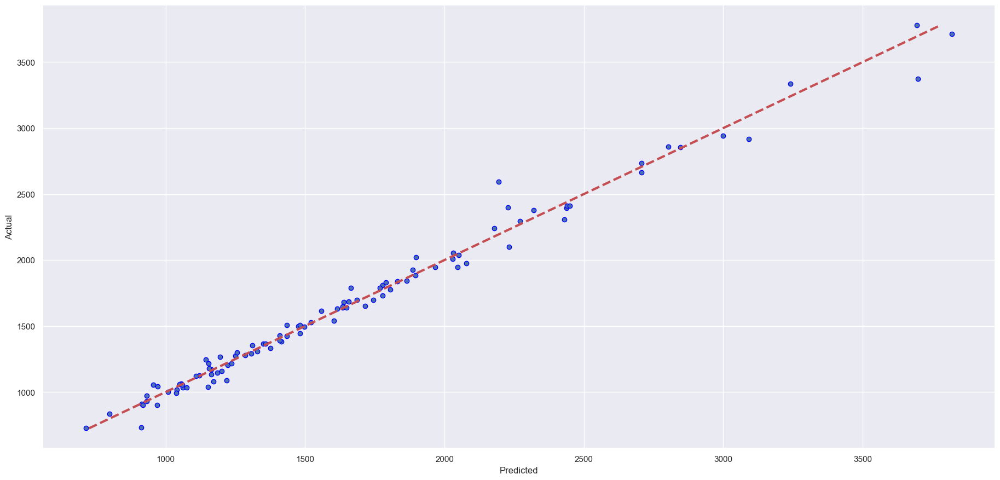

In [185]:
fig, ax = plt.subplots(figsize=(20,10))
ax.scatter(pre_out, out, edgecolors=(0, 0, 1))
ax.plot([my_min(out), my_maxi(out)], [my_min(out), my_maxi(out)], 'r--', lw=3)
ax.set_xlabel('Predicted')
ax.set_ylabel('Actual')
plt.show()

In [186]:
# model evaluation for testing set

mae = mean_absolute_error(test_y, predict_test)
mse = mean_squared_error(test_y, predict_test)
r2 = r2_score(test_y, predict_test)

print("The model performance for test set")
print("--------------------------------------")
print('MAE is {}'.format(round(mae, 3)))
print('MSE is {}'.format(round(mse, 3)))
print('RMSE is {}'.format(round(mse**(0.5), 3)))
print('R2 score is {}'.format(round(r2, 3)))

print('Adjusted R2 score is {}'.format(adj_rsqrd(test_data, r2)))

The model performance for test set
--------------------------------------
MAE is 44.001
MSE is 4787.228
RMSE is 69.19
R2 score is 0.988
Adjusted R2 score is 0.988


# We have achieved an adjusted R Squared value of 98.8% which is pretty close to 1, indicating our selected "Independent Variables" are highly correlated to our "Dependent Variable" and our model is able to predict very accurately.